<a href="https://colab.research.google.com/github/Mefoolyhi/PHA-Biodegradation/blob/main/data.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [ ]:
import pandas as pd

# Загрузка двух Excel файлов
file1 = '/content/preprocessed_test (2).xlsx'  # Укажите путь к первому файлу
file2 = '/content/preprocessed_train1 (7).xlsx'  # Укажите путь к второму файлу

df1 = pd.read_excel(file1)
df2 = pd.read_excel(file2)

# Список столбцов для сравнения (все, кроме 'mass')
columns_to_compare = ['type of pha', '% second component', 'environment', 'day',
                      'form', 'enzymatic', 'ph', 'in vivo', 'porosity', 'dimensionality']

# Проверка, что все нужные столбцы есть в обоих файлах
if not all(col in df1.columns and col in df2.columns for col in columns_to_compare + ['mass']):
    raise ValueError("Один или оба файла не содержат всех необходимых столбцов")

# Создаем копии датафреймов с выбранными столбцами для сравнения
df1_compare = df1[columns_to_compare].copy()
df2_compare = df2[columns_to_compare].copy()

# Находим строки, где все значения в columns_to_compare совпадают
merged = df1_compare.merge(df2_compare, how='inner', on=columns_to_compare)

# Если совпадения найдены, получаем соответствующие строки из исходных датафреймов
if not merged.empty:
    # Получаем индексы совпадающих строк
    result = []
    for idx1 in df1.index:
        for idx2 in df2.index:
            if (df1.loc[idx1, columns_to_compare].equals(df2.loc[idx2, columns_to_compare]) and
                df1.loc[idx1, 'mass'] != df2.loc[idx2, 'mass']):
                result.append({
                    'file1_row': df1.loc[idx1].to_dict(),
                    'file2_row': df2.loc[idx2].to_dict()
                })

    # Вывод результатов
    if result:
        print("Найдены строки с одинаковыми значениями во всех полях, кроме 'mass':")
        for pair in result:
            print("\nСтрока из test:")
            print(pair['file1_row'])
            print("Строка из train:")
            print(pair['file2_row'])
    else:
        print("Нет строк, где все поля совпадают, но 'mass' различается")
else:
    print("Нет строк с одинаковыми значениями во всех полях (кроме 'mass')")

<ipython-input-8-e5ac381f4687>:23: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  merged = df1_compare.merge(df2_compare, how='inner', on=columns_to_compare)


Найдены строки с одинаковыми значениями во всех полях, кроме 'mass':

Строка из test:
{'type of pha': 'p3hb', '% second component': 0, 'day': 180, 'environment': 'phosphate buffer', 'form': 'thread', 'enzymatic': 0, 'ph': 5.2, 'in vivo': 0, 'mass': 102, 'prev_day': 150, 'prev_day_mass': 100, 'porosity': 0, 'dimensionality': '1D'}
Строка из train:
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 180.0, 'environment': 'phosphate buffer', 'form': 'thread', 'enzymatic': 0, 'ph': 5.2, 'in vivo': 0, 'mass': 100.0, 'porosity': 0, 'dimensionality': '1D', 'initial_mn': nan, 'initial_mw': nan}


In [ ]:
import pandas as pd


df1 = pd.read_excel(file1)
df2 = pd.read_excel(file2)

# Список столбцов для группировки (все, кроме 'day' и 'mass')
group_cols = ['type of pha', '% second component', 'environment',
              'form', 'enzymatic', 'ph', 'in vivo', 'porosity', 'dimensionality']

# Проверка, что все нужные столбцы есть в обоих файлах
if not all(col in df1.columns and col in df2.columns for col in group_cols + ['day', 'mass']):
    raise ValueError("Один или оба файла не содержат всех необходимых столбцов")

# Функция для группировки и сортировки
def process_dataframe(df):
    # Группируем по всем столбцам, кроме 'day' и 'mass', и собираем 'day' и 'mass' в списки
    grouped = df.groupby(group_cols).agg({
        'day': lambda x: sorted(x.tolist()),  # Сортируем дни
        'mass': list
    }).reset_index()
    return grouped

# Обрабатываем оба датафрейма
df1_grouped = process_dataframe(df1)
df2_grouped = process_dataframe(df2)

# Находим совпадающие группы по group_cols
merged = df1_grouped.merge(df2_grouped, on=group_cols, how='inner', suffixes=('_file1', '_file2'))

# Фильтруем группы, где списки 'day' совпадают, а 'mass' различаются
result = []
for idx, row in merged.iterrows():
    days_file1 = row['day_file1']
    days_file2 = row['day_file2']
    mass_file1 = row['mass_file1']
    mass_file2 = row['mass_file2']

    # Проверяем, что дни совпадают, а массы различаются
    if days_file1 == days_file2 and mass_file1 != mass_file2:
        result.append({
            'group': row[group_cols].to_dict(),
            'days': days_file1,
            'mass_file1': mass_file1,
            'mass_file2': mass_file2
        })

# Вывод результатов
if result:
    print("Найдены группы с одинаковыми значениями во всех полях (кроме 'day' и 'mass') и одинаковыми последовательностями 'day':")
    for res in result:
        print("\nГруппа:")
        print(res['group'])
        print("Последовательность дней:", res['days'])
        print("Массы из file1:", res['mass_file1'])
        print("Массы из file2:", res['mass_file2'])
else:
    print("Нет групп, где все поля (кроме 'day' и 'mass') и последовательности 'day' совпадают, но 'mass' различается")

# Опционально: сохранение результата в Excel
if result:
    result_df = pd.DataFrame([
        {**res['group'], 'days': res['days'], 'mass_file1': res['mass_file1'], 'mass_file2': res['mass_file2']}
        for res in result
    ])
    result_df.to_excel('comparison_result.xlsx', index=False)

Нет групп, где все поля (кроме 'day' и 'mass') и последовательности 'day' совпадают, но 'mass' различается


<ipython-input-8-ac5617a3ca10>:29: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  merged = df1_grouped.merge(df2_grouped, on=group_cols, how='inner', suffixes=('_file1', '_file2'))


In [ ]:
import pandas as pd


df1 = pd.read_excel(file1)
df2 = pd.read_excel(file2)

# Список столбцов для группировки (все, кроме 'day' и 'mass')
group_cols = ['type of pha', '% second component', 'environment',
              'form', 'enzymatic', 'ph', 'in vivo', 'porosity', 'dimensionality']

# Проверка, что все нужные столбцы есть в обоих файлах
if not all(col in df1.columns and col in df2.columns for col in group_cols + ['day', 'mass']):
    raise ValueError("Один или оба файла не содержат всех необходимых столбцов")

# Функция для группировки и сортировки
def process_dataframe(df):
    # Группируем по всем столбцам, кроме 'day' и 'mass', и собираем 'day' и 'mass' в списки
    grouped = df.groupby(group_cols).agg({
        'day': lambda x: sorted(x.tolist()),  # Сортируем дни
        'mass': list
    }).reset_index()
    return grouped

# Обрабатываем оба датафрейма
df1_grouped = process_dataframe(df1)
df2_grouped = process_dataframe(df2)

# Находим совпадающие группы по group_cols
merged = df1_grouped.merge(df2_grouped, on=group_cols, how='inner', suffixes=('_file1', '_file2'))

# Фильтруем группы, где списки 'day' НЕ совпадают, а 'mass' различаются
result = []
for idx, row in merged.iterrows():
    days_file1 = row['day_file1']
    days_file2 = row['day_file2']
    mass_file1 = row['mass_file1']
    mass_file2 = row['mass_file2']

    # Проверяем, что дни НЕ совпадают, а массы различаются
    if days_file1 != days_file2 and mass_file1 != mass_file2:
        result.append({
            'group': row[group_cols].to_dict(),
            'days_file1': days_file1,
            'days_file2': days_file2,
            'mass_file1': mass_file1,
            'mass_file2': mass_file2
        })

# Вывод результатов
if result:
    print("Найдены группы с одинаковыми значениями во всех полях (кроме 'day' и 'mass'), но с разными последовательностями 'day':")
    for res in result:
        print("\nГруппа:")
        print(res['group'])
        print("Последовательность дней из file1:", res['days_file1'])
        print("Последовательность дней из file2:", res['days_file2'])
        print("Массы из file1:", res['mass_file1'])
        print("Массы из file2:", res['mass_file2'])
else:
    print("Нет групп, где все поля (кроме 'day' и 'mass') совпадают, последовательности 'day' различаются, и 'mass' различается")

# Опционально: сохранение результата в Excel
if result:
    result_df = pd.DataFrame([
        {**res['group'], 'days_file1': res['days_file1'], 'days_file2': res['days_file2'],
         'mass_file1': res['mass_file1'], 'mass_file2': res['mass_file2']}
        for res in result
    ])
    result_df.to_excel('comparison_result.xlsx', index=False)

Найдены группы с одинаковыми значениями во всех полях (кроме 'day' и 'mass'), но с разными последовательностями 'day':

Группа:
{'type of pha': 'p3hb', '% second component': 0, 'environment': 'phosphate buffer', 'form': 'thread', 'enzymatic': 0, 'ph': 5.2, 'in vivo': 0, 'porosity': 0, 'dimensionality': '1D'}
Последовательность дней из file1: [30, 60, 90, 120, 150, 180]
Последовательность дней из file2: [180.0]
Массы из file1: [99, 102, 106, 99, 100, 102]
Массы из file2: [100.0]


<ipython-input-9-7b6ae1fe881b>:29: UserWarning: You are merging on int and float columns where the float values are not equal to their int representation.
  merged = df1_grouped.merge(df2_grouped, on=group_cols, how='inner', suffixes=('_file1', '_file2'))


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt

# Загрузка двух Excel файлов
file1 = '/content/preprocessed_test (2).xlsx'  # Укажите путь к первому файлу
file2 = '/content/preprocessed_train1 (7).xlsx'

df1 = pd.read_excel(file1)
df2 = pd.read_excel(file2)

# Список столбцов для группировки (все, кроме 'day' и 'mass')
group_cols = ['type of pha', '% second component', 'environment',
              'form', 'enzymatic', 'ph', 'in vivo', 'porosity', 'dimensionality']

# Проверка, что все нужные столбцы есть в обоих файлах
if not all(col in df1.columns and col in df2.columns for col in group_cols + ['day', 'mass']):
    raise ValueError("Один или оба файла не содержат всех необходимых столбцов")

# Функция для группировки и подготовки данных
def process_dataframe(df, file_name):
    # Группируем по всем столбцам, кроме 'day' и 'mass', и собираем 'day' и 'mass' в списки
    grouped = df.groupby(group_cols).agg({
        'day': list,
        'mass': list
    }).reset_index()
    # Добавляем метку файла
    grouped['file'] = file_name
    return grouped

# Обрабатываем оба датафрейма
df1_grouped = process_dataframe(df1, 'File 1')
df2_grouped = process_dataframe(df2, 'File 2')

# Объединяем данные для обработки всех групп
all_groups = pd.concat([df1_grouped, df2_grouped], ignore_index=True)

# Построение единого графика
if not all_groups.empty:
    print("Строим единый график для всех групп из обоих файлов:")

    # Создаем одну фигуру
    plt.figure(figsize=(12, 8))

    # Счетчик групп для вывода
    group_count = 0

    # Группируем по group_cols для обработки уникальных комбинаций
    for group_key, group_data in all_groups.groupby(group_cols):
        group_count += 1

        # Проходим по данным группы (может быть из File 1, File 2 или обоих)
        for _, row in group_data.iterrows():
            file_name = row['file']
            days = row['day']
            masses = row['mass']
            color = 'blue' if file_name == 'File 1' else 'red'

            # Формируем метку для легенды: группа + файл
            group_label = f"Group {group_count} ({file_name}): " + ', '.join([f"{k}={v}" for k, v in zip(group_cols, group_key)])

            # Строим линию для текущей группы и файла
            plt.plot(days, masses, marker='o', color=color, label=group_label, linestyle='-')

    # Настройка графика
    plt.xlabel('Day')
    plt.ylabel('Mass')
    plt.title('All Groups from File 1 and File 2')
    plt.legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    plt.grid(True)

    # Устанавливаем отступы, чтобы легенда не обрезалась
    plt.tight_layout()

    # Сохранение графика
    plt.savefig('all_groups_plot.png', bbox_inches='tight')
    plt.close()

    print("Единый график сохранен как all_groups_plot.png")
else:
    print("Нет данных для построения графика")

# Опционально: сохранение всех групп в Excel
all_groups.to_excel('all_groups_result.xlsx', index=False)

Строим единый график для всех групп из обоих файлов:


<ipython-input-5-3aca6a20fbd3>:72: UserWarning: Tight layout not applied. The left and right margins cannot be made large enough to accommodate all Axes decorations.
  plt.tight_layout()


Единый график сохранен как all_groups_plot.png


In [ ]:
import pandas as pd

# Загрузка Excel файла
file_path = '/content/preprocessed_test (2).xlsx'  # Укажите путь к вашему файлу
df = pd.read_excel(file_path)

# 1. Замена значений в столбце enzymatic
df['enzymatic'] = df['enzymatic'].replace({'yes': 1, 'no': 0})

# 2. Замена значений в столбце in vivo
df['in vivo'] = df['in vivo'].replace({'in vitro': 0, 'in vivo': 1})

# 3. Маппинг для environment_type
environment_mapping = {
    'simulated body fluid': 'simulated body fluid',
    'sterile buffer': 'sterile buffer',
    'simulated gastric juice': 'simulated gastric juice',
    'synthetic gastric juice': 'simulated gastric juice',
    'simulated colonic fluid': 'simulated colonic fluid',
    'artificial colonic fluid': 'simulated colonic fluid',
    'subcutaneous': 'tissue implantation',
    'intramuscular': 'tissue implantation',
    'intraperitoneal': 'tissue implantation',
    'bloodstream': 'bloodstream',
    'intravenous': 'bloodstream',
    'bone tissue': 'bone tissue',
    'femur': 'bone tissue',
    'inside the body': 'in vivo (unspecified)',
    'Inside the body': 'in vivo (unspecified)',
    'pericardium': 'cardiovascular implantation',
    'right ventricular outflow tract': 'cardiovascular implantation',
    'right atrium': 'cardiovascular implantation',
    'nerve wrap-around': 'nerve tissue',
    'subperiosteal': 'bone tissue',
    'phosphate buffer': 'phosphate buffer'
}

# 4. Маппинг для form_type
form_mapping = {
    'film': 'film',
    'plate': 'film',
    'disc': 'film',
    'matrix': 'film',
    'tensile test pieces': 'film',
    'patch': 'film',
    'nanofiber membranes': 'film',
    'mesh': 'film',
    '3d construct': 'scaffold',
    '3d figure': 'scaffold',
    'microspheres': 'microspheres',
    'particles': 'microspheres',
    'thread': 'thread',
    'scaffold': 'scaffold',
    'screw': 'screw',
    'cylinder': 'cylinder',
}

# Добавление столбцов environment_type и form_type
df['environment_type'] = df['environment'].map(environment_mapping)
df['form_type'] = df['form'].map(form_mapping)

# Проверка, что все значения были отображены (если есть пропуски, выведем предупреждение)
if df['environment_type'].isna().any():
    print("Предупреждение: Некоторые значения в 'environment' не найдены в маппинге")
if df['form_type'].isna().any():
    print("Предупреждение: Некоторые значения в 'form' не найдены в маппинге")

# 5. Маппинг для dimensionality по form_type
dimensionality_mapping = {
    'film': '2D',
    'thread': '1D',
    'scaffold': '3D',
    'microspheres': '3D',
    'screw': '3D',
    'cylinder': '3D'
}

df['dimensionality'] = df['form_type'].map(dimensionality_mapping)

# 6. Проставление значений в столбце porosity
df['porosity'] = 0  # По умолчанию 0
df.loc[df['form'].isin(['scaffold', 'nanofiber membranes', 'mesh']), 'porosity'] = 1

# Сохранение результата в новый Excel файл
output_file = 'transformed_file.xlsx'
df.to_excel(output_file, index=False)
print(f"Файл сохранен как {output_file}")

Предупреждение: Некоторые значения в 'environment' не найдены в маппинге
Файл сохранен как transformed_file.xlsx


In [ ]:
import pandas as pd

# Загрузка Excel файла
file_path = '/content/cleaned_file_no_article_duplicates.xlsx'  # Укажите путь к вашему файлу
df = pd.read_excel(file_path)

# Проверка наличия всех необходимых столбцов
required_columns = ['type of pha', '% second component', 'day', 'environment', 'form',
                   'enzymatic', 'ph', 'in vivo', 'mass', 'porosity', 'dimensionality',
                   'article', 'environment_type', 'form_type']
if not all(col in df.columns for col in required_columns):
    raise ValueError("Файл не содержит всех необходимых столбцов")


# Список столбцов для сравнения (все, кроме 'article' и 'mass')
cols_no_article_mass = [col for col in required_columns if col not in ['article', 'mass']]

# Функция для поиска пар строк
def find_matching_pairs(df, compare_cols, exclude_cols):
    pairs = []
    n = len(df)
    for i in range(n):
        for j in range(i + 1, n):
            # Проверяем, совпадают ли значения в указанных столбцах
            if df.loc[i, compare_cols].equals(df.loc[j, compare_cols]):
                # Проверяем, различаются ли значения в исключенных столбцах
                if not all(df.loc[i, col] == df.loc[j, col] for col in exclude_cols):
                    pairs.append((i, j))
    return pairs

# 2. Поиск пар, где совпадают все значения, кроме 'article' и 'mass'
pairs_no_article_mass = find_matching_pairs(df, cols_no_article_mass, ['article', 'mass'])

print("\n2. Пары строк, где совпадают все значения, кроме 'article' и 'mass':")
if pairs_no_article_mass:
    for idx1, idx2 in pairs_no_article_mass:
        print(f"\nПара строк (индексы {idx1}, {idx2}):")
        print("Строка 1:")
        print(df.loc[idx1].to_dict())
        print("Строка 2:")
        print(df.loc[idx2].to_dict())
else:
    print("Таких пар не найдено")

# Опционально: сохранение результатов в Excel
result = []

for idx1, idx2 in pairs_no_article_mass:
    result.append({
        'condition': 'Same except article and mass',
        'row1_index': idx1,
        'row2_index': idx2,
        **{f'row1_{k}': v for k, v in df.loc[idx1].to_dict().items()},
        **{f'row2_{k}': v for k, v in df.loc[idx2].to_dict().items()}
    })

if result:
    result_df = pd.DataFrame(result)
    result_df.to_excel('matching_pairs.xlsx', index=False)
    print("\nРезультаты сохранены в 'matching_pairs.xlsx'")


2. Пары строк, где совпадают все значения, кроме 'article' и 'mass':

Пара строк (индексы 137, 239):
Строка 1:
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 30.0, 'environment': 'inside the body', 'form': 'matrix', 'enzymatic': 'Yes', 'ph': 7.4, 'in vivo': 1, 'mass': 100.0, 'porosity': 0, 'dimensionality': '2D', 'article': 10, 'environment_type': 'in vivo (unspecified)', 'form_type': 'film'}
Строка 2:
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 30.0, 'environment': 'inside the body', 'form': 'matrix', 'enzymatic': 'Yes', 'ph': 7.4, 'in vivo': 1, 'mass': 95.0, 'porosity': 0, 'dimensionality': '2D', 'article': 15, 'environment_type': 'in vivo (unspecified)', 'form_type': 'film'}

Пара строк (индексы 138, 157):
Строка 1:
{'type of pha': 'p3hb/3hv', '% second component': 27.6, 'day': 30.0, 'environment': 'inside the body', 'form': 'matrix', 'enzymatic': 'Yes', 'ph': 7.4, 'in vivo': 1, 'mass': 80.0, 'porosity': 0, 'dimensionality': '2D', 'article': 10, 'environmen

In [1]:
import pandas as pd

# Load the Excel file
file_path = '/content/big_train_duples.xlsx'
df = pd.read_excel(file_path)

# Verify required columns
required_columns = ['type of pha', '% second component', 'day', 'environment', 'form',
                   'enzymatic', 'ph', 'in vivo', 'mass', 'porosity', 'dimensionality',
                   'article', 'environment_type', 'form_type']
if not all(col in df.columns for col in required_columns):
    raise ValueError("File does not contain all required columns")

# Columns to group by (all except 'article' and 'mass')
group_cols = [col for col in required_columns if col not in ['article', 'mass']]

# Group rows by matching columns and aggregate
# Keep first 'article' value and average 'mass'
result_df = df.groupby(group_cols).agg({
    'article': 'first',  # Keep the first article value
    'mass': 'mean'       # Average the mass values
}).reset_index()

# Reorder columns to match original order
result_df = result_df[required_columns]

# Save the resulting DataFrame to a new Excel file
output_path = 'train_averaged_mass.xlsx'
result_df.to_excel(output_path, index=False)
print(f"Processed data with averaged mass values saved to '{output_path}'")

Processed data with averaged mass values saved to 'train_averaged_mass.xlsx'


In [3]:
import pandas as pd

# Load the Excel file
file_path = '/content/big_train_duples.xlsx'
df = pd.read_excel(file_path)

# Verify required columns
required_columns = ['type of pha', '% second component', 'day',
                   'enzymatic', 'ph', 'in vivo', 'mass', 'porosity', 'dimensionality',
                   'article', 'environment_type', 'form_type']
if not all(col in df.columns for col in required_columns):
    raise ValueError("File does not contain all required columns")

# Columns to group by (all except 'article' and 'mass')
group_cols = [col for col in required_columns if col not in ['article', 'mass']]

# Group rows by matching columns and aggregate
# Keep first 'article' value and average 'mass'
result_df = df.groupby(group_cols).agg({
    'article': 'first',  # Keep the first article value
    'mass': 'first'       # Average the mass values
}).reset_index()

# Reorder columns to match original order
result_df = result_df[required_columns]

# Save the resulting DataFrame to a new Excel file
output_path = 'train_first_mass_types.xlsx'
result_df.to_excel(output_path, index=False)
print(f"Processed data with averaged mass values saved to '{output_path}'")

Processed data with averaged mass values saved to 'train_first_mass_types.xlsx'


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Загрузка Excel файла
file_path = '/content/cleaned_file_no_article_duplicates.xlsx'  # Укажите путь к вашему файлу
df = pd.read_excel(file_path)

# Проверка наличия всех необходимых столбцов
required_columns = ['type of pha', '% second component', 'day', 'environment', 'form',
                   'enzymatic', 'ph', 'in vivo', 'mass', 'porosity', 'dimensionality',
                   'article', 'environment_type', 'form_type']
if not all(col in df.columns for col in required_columns):
    raise ValueError("Файл не содержит всех необходимых столбцов")

# Список столбцов для сравнения (все, кроме 'mass' и 'article')
cols_no_mass_article = [col for col in required_columns if col not in ['mass', 'article']]

# Поиск пар строк, где совпадают все значения, кроме 'mass' и 'article'
pairs = []
mass_differences = []
for i in range(len(df)):
    for j in range(i + 1, len(df)):
        if df.loc[i, cols_no_mass_article].equals(df.loc[j, cols_no_mass_article]):
            # Проверяем, что хотя бы одно из значений 'mass' или 'article' различается
            if df.loc[i, 'mass'] != df.loc[j, 'mass'] or df.loc[i, 'article'] != df.loc[j, 'article']:
                pairs.append((i, j))
                # Вычисляем разность mass (mass_i - mass_j)
                mass_diff = df.loc[i, 'mass'] - df.loc[j, 'mass']
                mass_differences.append(mass_diff)

# Вывод найденных пар
if pairs:
    print("Найдены пары строк, где совпадают все значения, кроме 'mass' и 'article':")
    for idx1, idx2 in pairs:
        print(f"\nПара строк (индексы {idx1}, {idx2}):")
        print("Строка 1:")
        print(df.loc[idx1].to_dict())
        print("Строка 2:")
        print(df.loc[idx2].to_dict())
else:
    print("Таких пар не найдено")

# Построение графика распределения разностей mass
if mass_differences:
    plt.figure(figsize=(10, 6))
    sns.histplot(mass_differences, bins=20, kde=True, color='blue')
    plt.xlabel('Разность mass (mass_1 - mass_2)')
    plt.ylabel('Частота')
    plt.title('Распределение разностей mass для пар строк')
    plt.grid(True)

    # Сохранение графика
    plt.savefig('mass_differences_distribution.png', bbox_inches='tight')
    plt.close()
    print("\nГрафик распределения разностей mass сохранен как 'mass_differences_distribution.png'")
else:
    print("\nНет данных для построения графика распределения разностей mass")

# Сохранение результатов в Excel
if pairs:
    result = []
    for idx1, idx2 in pairs:
        mass_diff = df.loc[idx1, 'mass'] - df.loc[idx2, 'mass']
        result.append({
            'row1_index': idx1,
            'row2_index': idx2,
            'mass_difference': mass_diff,
            **{f'row1_{k}': v for k, v in df.loc[idx1].to_dict().items()},
            **{f'row2_{k}': v for k, v in df.loc[idx2].to_dict().items()}
        })
    result_df = pd.DataFrame(result)
    result_df.to_excel('mass_differences_pairs.xlsx', index=False)
    print("Результаты сохранены в 'mass_differences_pairs.xlsx'")

Найдены пары строк, где совпадают все значения, кроме 'mass' и 'article':

Пара строк (индексы 61, 105):
Строка 1:
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 14.0, 'environment': 'phosphate buffer', 'form': 'film', 'enzymatic': 'No', 'ph': 7.4, 'in vivo': 0, 'mass': 98.0, 'porosity': 0, 'dimensionality': '2D', 'article': 4, 'environment_type': 'phosphate buffer', 'form_type': 'film'}
Строка 2:
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 14.0, 'environment': 'phosphate buffer', 'form': 'film', 'enzymatic': 'No', 'ph': 7.4, 'in vivo': 0, 'mass': 112.0, 'porosity': 0, 'dimensionality': '2D', 'article': 9, 'environment_type': 'phosphate buffer', 'form_type': 'film'}

Пара строк (индексы 67, 122):
Строка 1:
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 56.0, 'environment': 'phosphate buffer', 'form': 'film', 'enzymatic': 'No', 'ph': 7.4, 'in vivo': 0, 'mass': 92.0, 'porosity': 0, 'dimensionality': '2D', 'article': 4, 'environment_type': 'phosphate bu

In [ ]:
import pandas as pd

# Загрузка Excel файла
file_path = '/content/transformed_file (1).xlsx'  # Укажите путь к вашему файлу
df = pd.read_excel(file_path)

# Проверка наличия необходимых столбцов
required_columns = ['day', 'mass']
if not all(col in df.columns for col in required_columns):
    raise ValueError("Файл не содержит всех необходимых столбцов (day, mass)")

# Фильтрация строк, где day = 0 и mass != 0
filtered_df = df[(df['day'] != 0) & (df['mass'] == 100)]

# Вывод результатов
if not filtered_df.empty:
    print("Найдены строки, где day = 0 и mass != 0:")
    for idx, row in filtered_df.iterrows():
        print(f"\nСтрока (индекс {idx}):")
        print(row.to_dict())
else:
    print("Таких строк не найдено")



Найдены строки, где day = 0 и mass != 0:

Строка (индекс 79):
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 30.0, 'environment': 'inside the body', 'form': 'plate', 'enzymatic': 'Yes', 'ph': 7.4, 'in vivo': 1, 'mass': 100.0, 'porosity': 0, 'dimensionality': '2D', 'article': 6, 'environment_type': 'in vivo (unspecified)', 'form_type': 'film'}

Строка (индекс 80):
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 60.0, 'environment': 'inside the body', 'form': 'plate', 'enzymatic': 'Yes', 'ph': 7.4, 'in vivo': 1, 'mass': 100.0, 'porosity': 0, 'dimensionality': '2D', 'article': 6, 'environment_type': 'in vivo (unspecified)', 'form_type': 'film'}

Строка (индекс 142):
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 30.0, 'environment': 'inside the body', 'form': 'matrix', 'enzymatic': 'Yes', 'ph': 7.4, 'in vivo': 1, 'mass': 100.0, 'porosity': 0, 'dimensionality': '2D', 'article': 10, 'environment_type': 'in vivo (unspecified)', 'form_type': 'film'}

Строка (ин

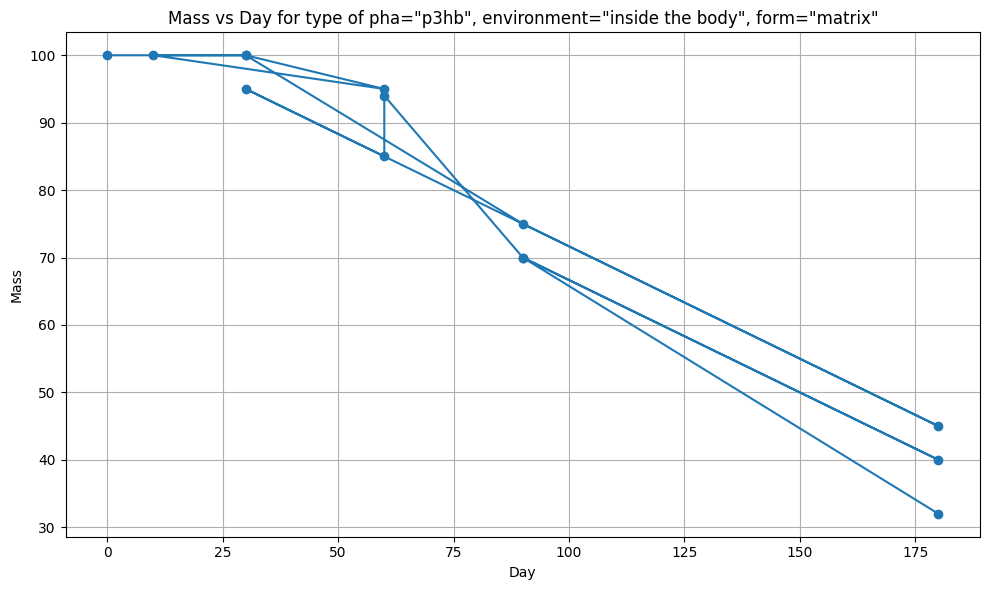

График сохранен как 'mass_vs_day_plot.png'


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns

# Загрузка Excel файла
file_path = '/content/cleaned_file_no_article_duplicates.xlsx'  # Укажите путь к вашему файлу
df = pd.read_excel(file_path)

# Проверка наличия всех необходимых столбцов
required_columns = ['type of pha', '% second component', 'day', 'environment', 'form',
                   'enzymatic', 'ph', 'in vivo', 'mass', 'porosity', 'dimensionality',
                   'article', 'environment_type', 'form_type']
if not all(col in df.columns for col in required_columns):
    raise ValueError("Файл не содержит всех необходимых столбцов")

# Проверка и преобразование столбца mass в float
if not pd.api.types.is_float_dtype(df['mass']):
    try:
        df['mass'] = df['mass'].astype(float)
    except ValueError:
        raise ValueError("Столбец 'mass' содержит значения, которые нельзя преобразовать в float")

# Задайте значения для фильтрации
type_of_pha = 'p3hb'  # Укажите нужное значение для type of pha
environment = 'inside the body'  # Укажите нужное значение для environment
form = 'matrix'  # Укажите нужное значение для form

# Фильтрация строк по заданным type of pha, environment и form
filtered_df = df[
    (df['type of pha'] == type_of_pha) &
    (df['environment'] == environment) &
    (df['form'] == form) &
    (df['ph'] == 7.4)
]

# Проверка, есть ли данные после фильтрации
if filtered_df.empty:
    print(f"Нет строк, соответствующих type of pha='{type_of_pha}', environment='{environment}', form='{form}'")
    exit()

# Список столбцов для группировки (все, кроме 'mass', 'day' и 'article')
group_cols = [col for col in required_columns if col not in ['mass', 'day', 'article']]

# Группировка данных
grouped = filtered_df.groupby(group_cols).agg({
    'day': list,
    'mass': list
}).reset_index()

# Построение графика
if not grouped.empty:
    plt.figure(figsize=(10, 6))

    # Проходим по каждой группе
    for idx, row in grouped.iterrows():
        days = row['day']
        masses = row['mass']

        # Формируем метку для легенды
        group_label = ', '.join([f"{col}={row[col]}" for col in group_cols])

        # Строим линию для группы
        plt.plot(days, masses, marker='o', linestyle='-', label=group_label)

    # Настройка графика
    plt.xlabel('Day')
    plt.ylabel('Mass')
    plt.title(f'Mass vs Day for type of pha="{type_of_pha}", environment="{environment}", form="{form}"')

    plt.grid(True)

    # Устанавливаем отступы, чтобы легенда не обрезалась
    plt.tight_layout()

    # Сохранение графика
    plt.show()

    print("График сохранен как 'mass_vs_day_plot.png'")
else:
    print("Нет данных для построения графика после группировки")


Нет групп для комбинации: type of pha='p3hb/4hb', environment='simulated body fluid', form='film', ph=7.4
[14.0, 28.0, 56.0, 84.0, 84.0] [84.0, 88.0, 76.0, 50.0, 76.18]
[14.0, 28.0, 56.0, 84.0, 84.0] [109.0, 94.0, 88.0, 64.0, 88.3]


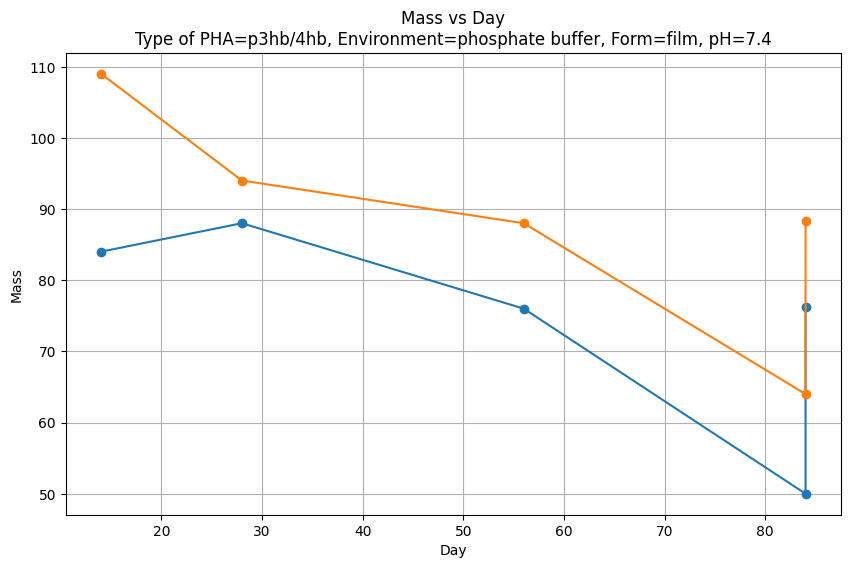

[30.0, 60.0, 90.0, 180.0] [90.0, 80.0, 70.0, 60.0]


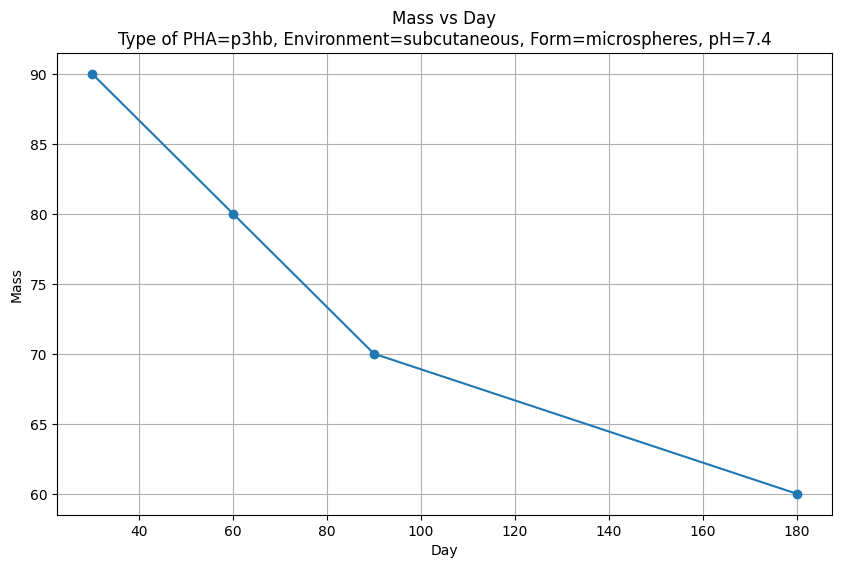

[30.0, 60.0, 90.0, 180.0, 2.0] [95.0, 85.0, 75.0, 65.0, 0.0]


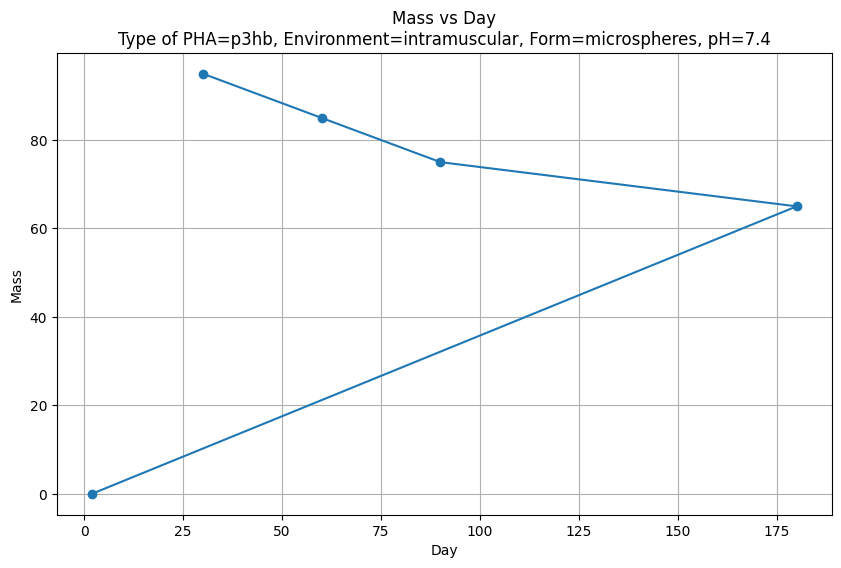

[30.0, 60.0, 90.0, 180.0] [98.0, 90.0, 80.0, 70.0]


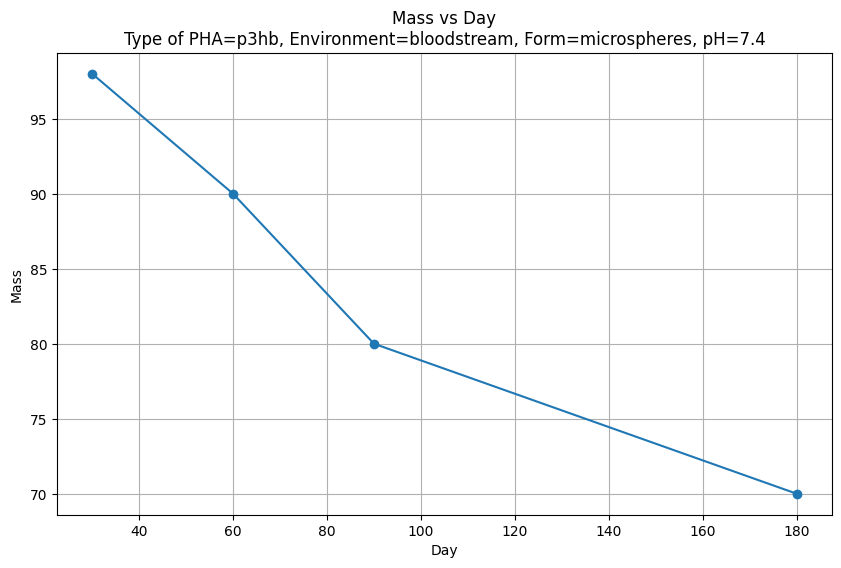

[30.0, 60.0, 90.0, 180.0, 6.0, 3.0, 2.0] [95.0, 85.0, 75.0, 65.0, 1.6, 100.0, 30.0]


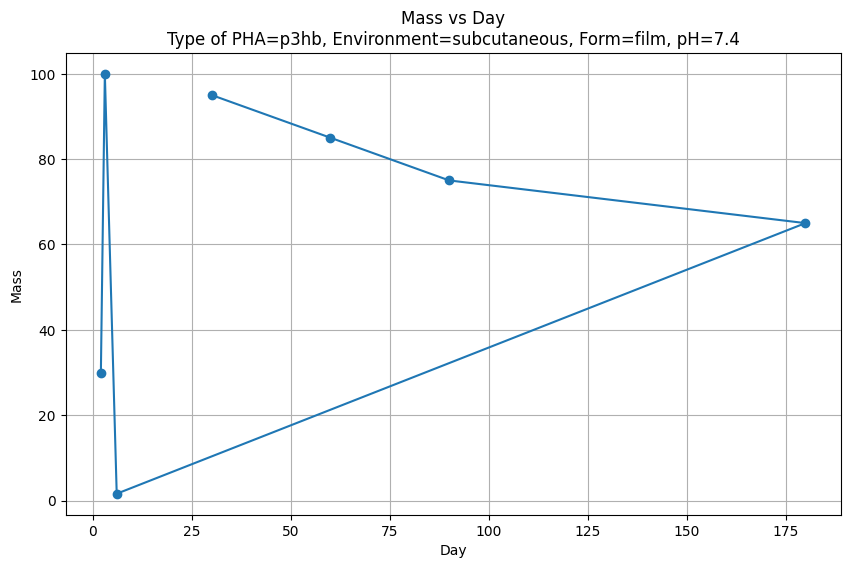

[30.0, 60.0, 90.0, 180.0, 2.0] [90.0, 80.0, 70.0, 60.0, 30.0]


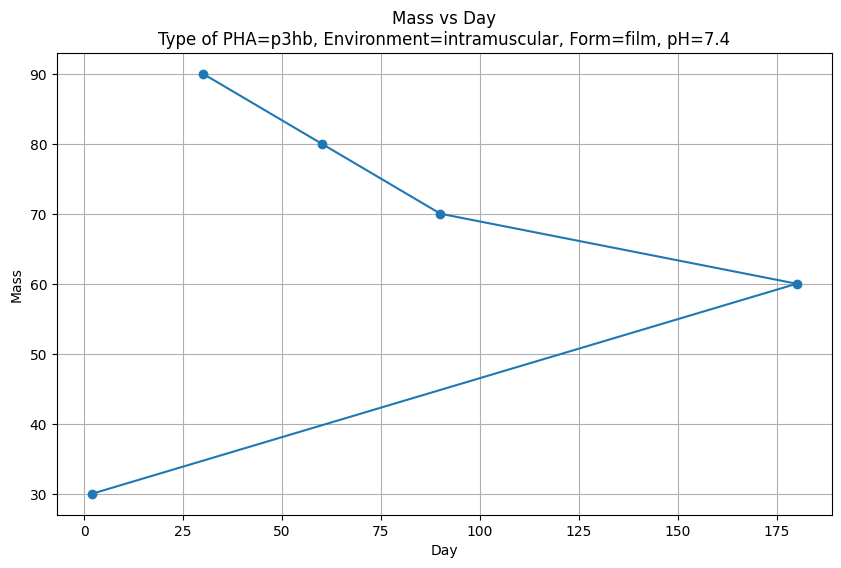

[30.0, 60.0, 90.0, 180.0] [95.0, 85.0, 75.0, 65.0]


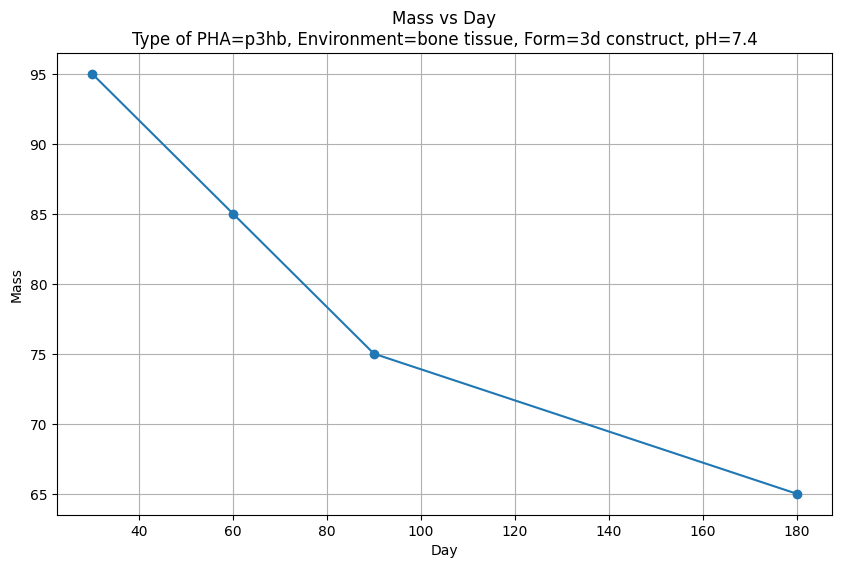

Нет групп для комбинации: type of pha='p3hb/3hv', environment='subcutaneous', form='film', ph=7.4
Нет групп для комбинации: type of pha='p3hb/4hb', environment='subcutaneous', form='film', ph=7.4
[0.0, 7.0, 14.0, 21.0, 28.0, 35.0, 42.0, 49.0, 56.0] [100.0, 97.0, 94.0, 91.0, 88.0, 85.0, 82.0, 79.0, 76.0]


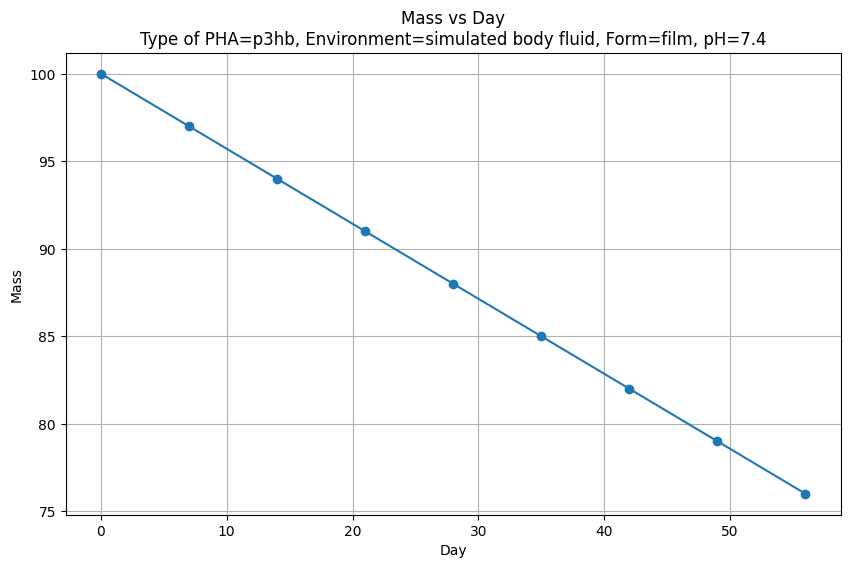

[0.0, 7.0, 14.0, 21.0, 28.0, 35.0, 42.0, 49.0, 56.0, 56.0, 84.0, 150.0, 730.0, 364.0, 360.0, 50.0, 279.0] [100.0, 99.0, 98.0, 97.0, 96.0, 95.0, 94.0, 93.0, 92.0, 82.0, 80.0, 100.0, 100.0, 100.0, 64.9, 92.5, 92.5]


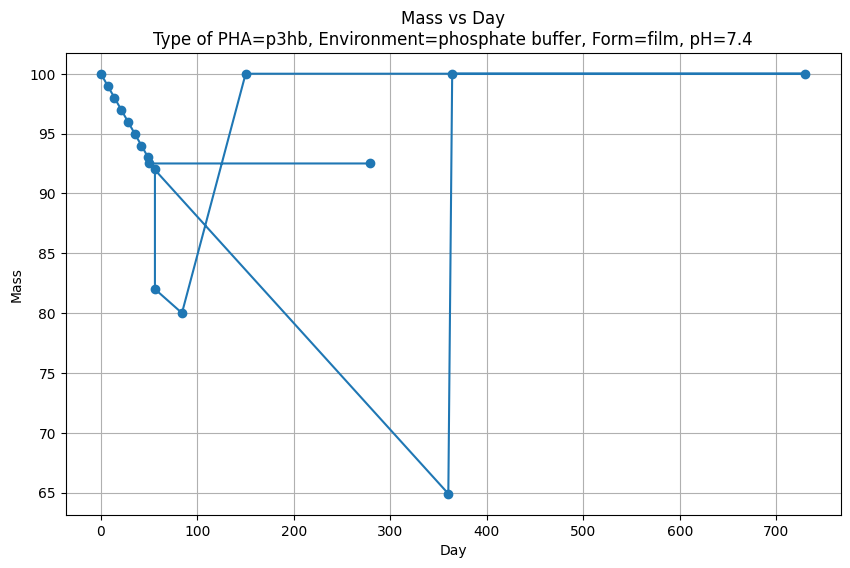

[30.0, 90.0, 180.0] [67.0, 54.0, 29.0]


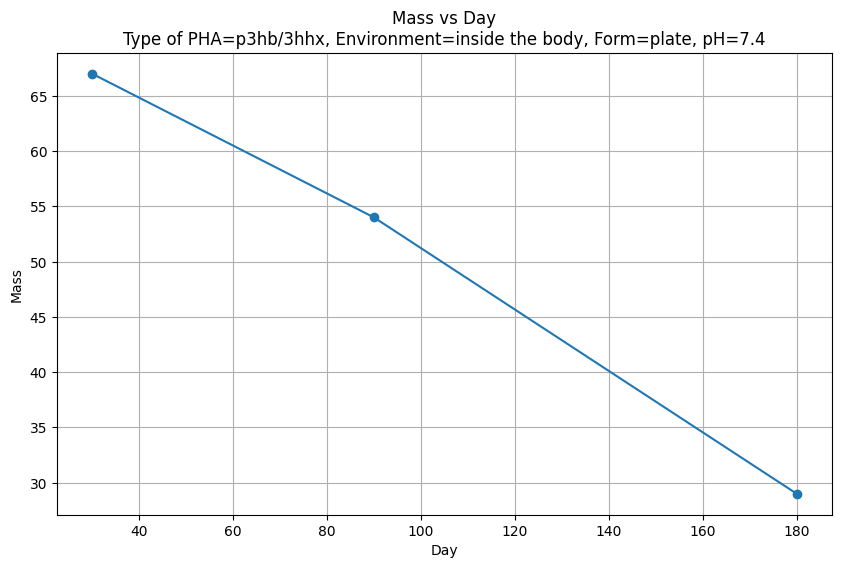

Нет групп для комбинации: type of pha='p3hb/4hb', environment='inside the body', form='plate', ph=7.4
[30.0, 90.0, 180.0] [63.0, 53.0, 27.0]
[30.0, 90.0, 180.0] [61.0, 53.0, 29.0]


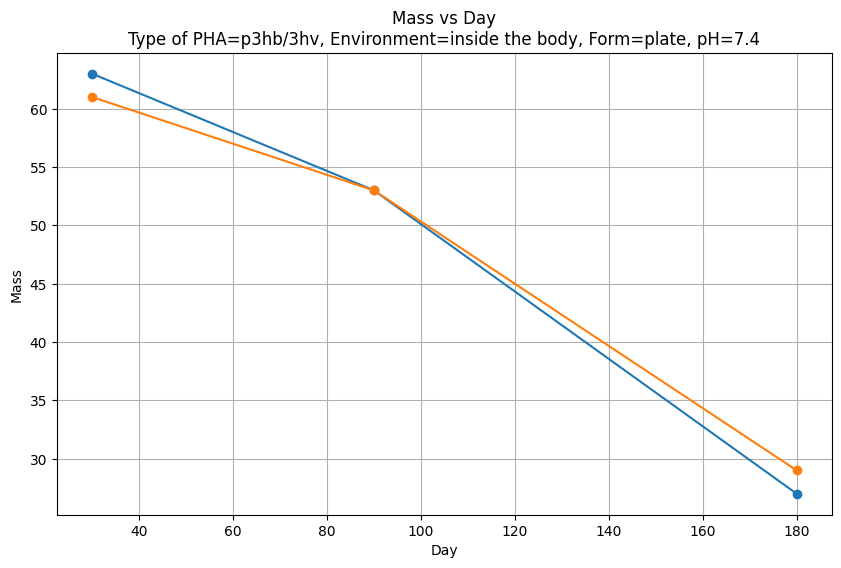

[30.0, 90.0] [60.0, 25.0]


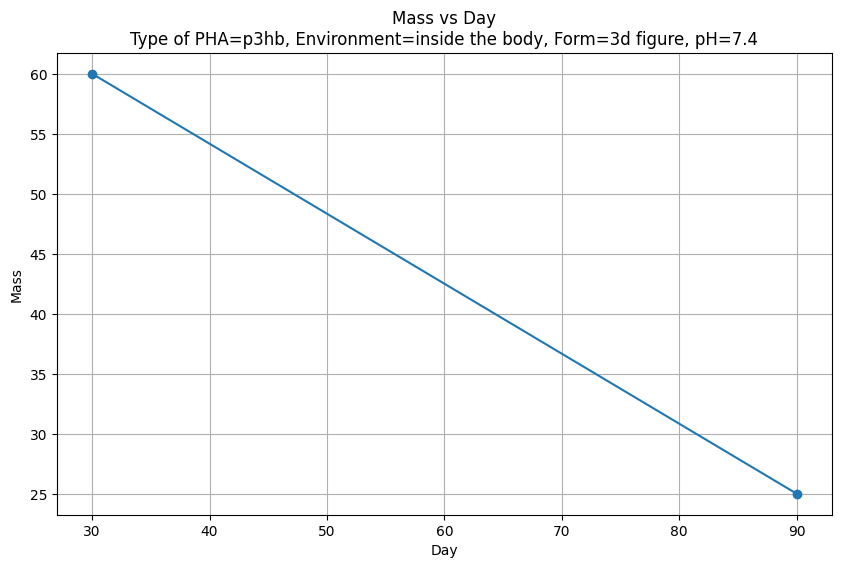

[30.0, 60.0, 90.0, 180.0, 0.0] [100.0, 100.0, 75.0, 45.0, 100.0]


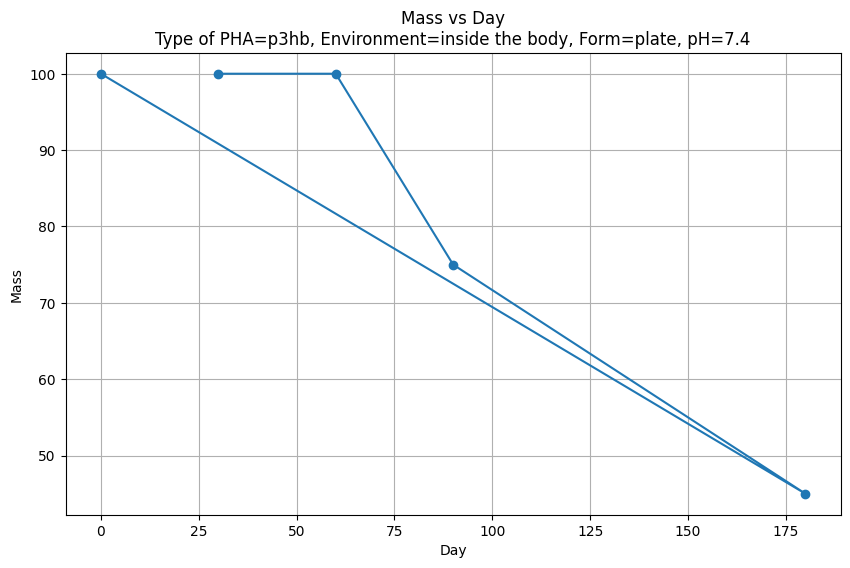

Нет групп для комбинации: type of pha='p3hb/4hb', environment='phosphate buffer', form='nanofiber membranes', ph=7.4
[14.0, 28.0, 56.0, 84.0] [66.0, 70.0, 37.0, 22.0]


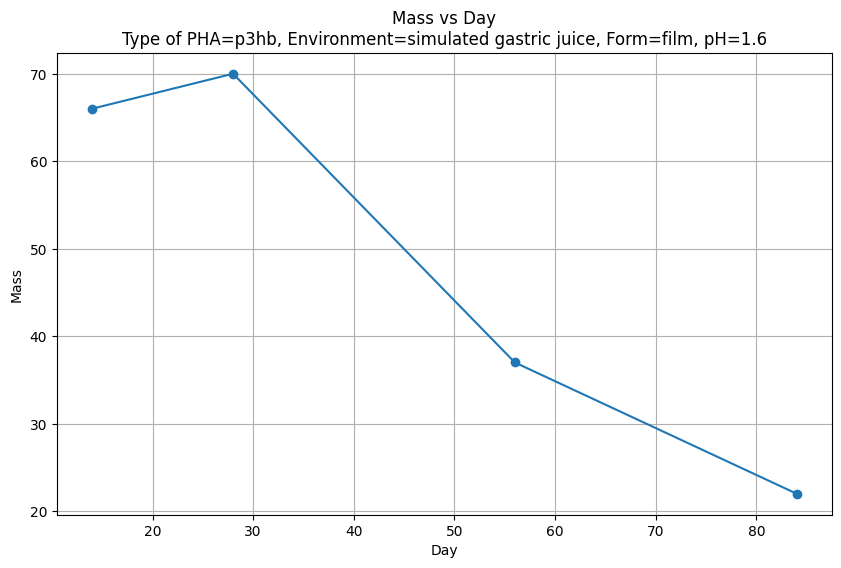

[14.0, 28.0, 56.0, 84.0, 84.0] [70.0, 45.0, 40.0, 21.0, 50.37]
[14.0, 28.0, 56.0, 84.0, 84.0] [64.0, 39.0, 29.0, 19.0, 36.48]


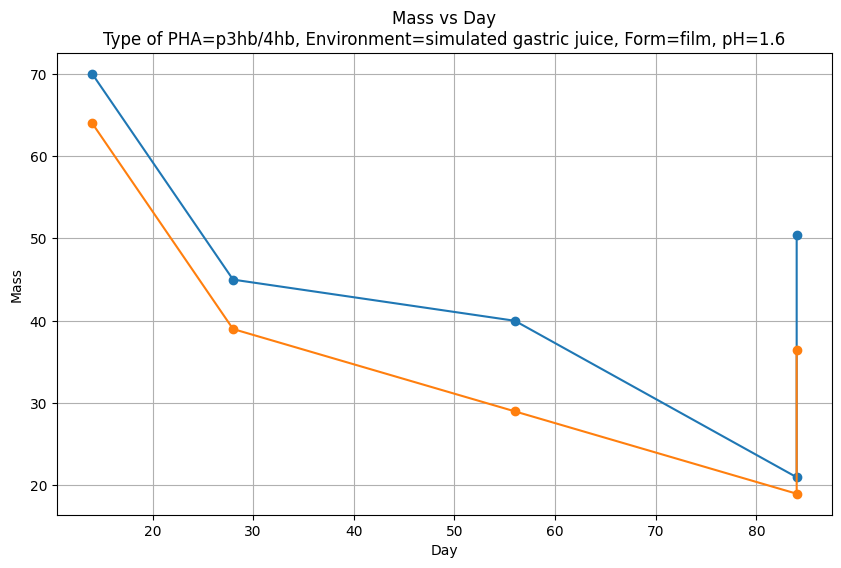

[14.0, 28.0, 56.0, 84.0] [96.0, 74.0, 47.0, 34.0]


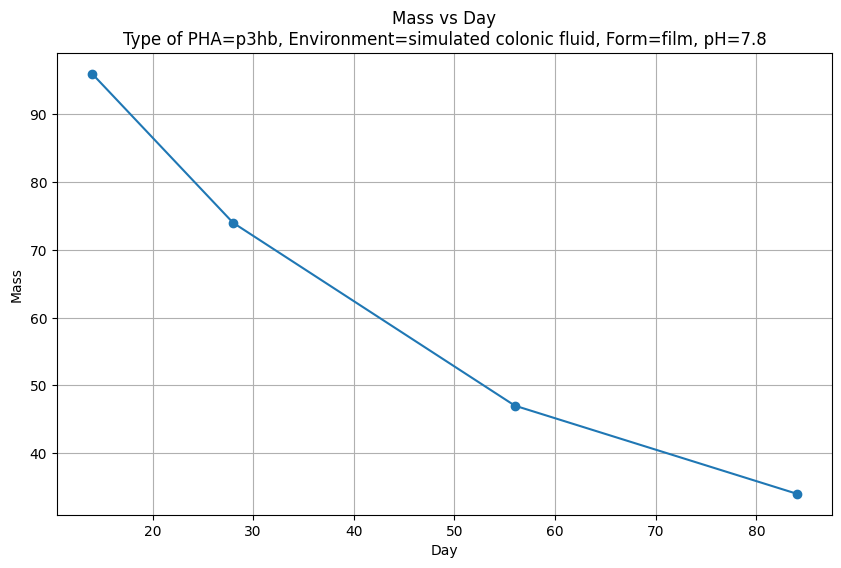

[14.0, 28.0, 56.0, 84.0] [77.0, 80.0, 62.0, 40.0]
[14.0, 28.0, 56.0, 84.0] [93.0, 75.0, 56.0, 40.0]


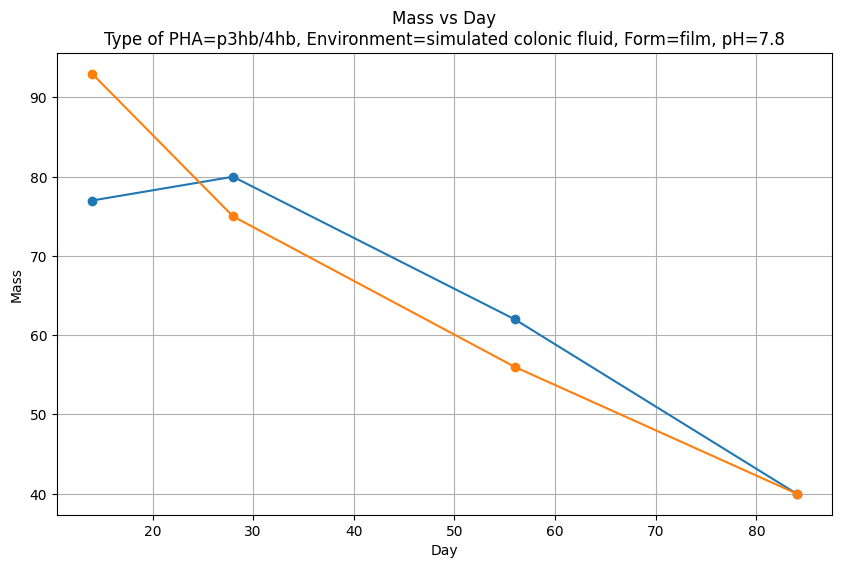

[0.0, 30.0, 60.0, 10.0, 30.0, 90.0, 180.0, 30.0, 60.0, 60.0, 90.0, 180.0, 90.0, 180.0] [100.0, 100.0, 95.0, 100.0, 100.0, 75.0, 45.0, 95.0, 85.0, 94.0, 70.0, 40.0, 70.0, 32.0]


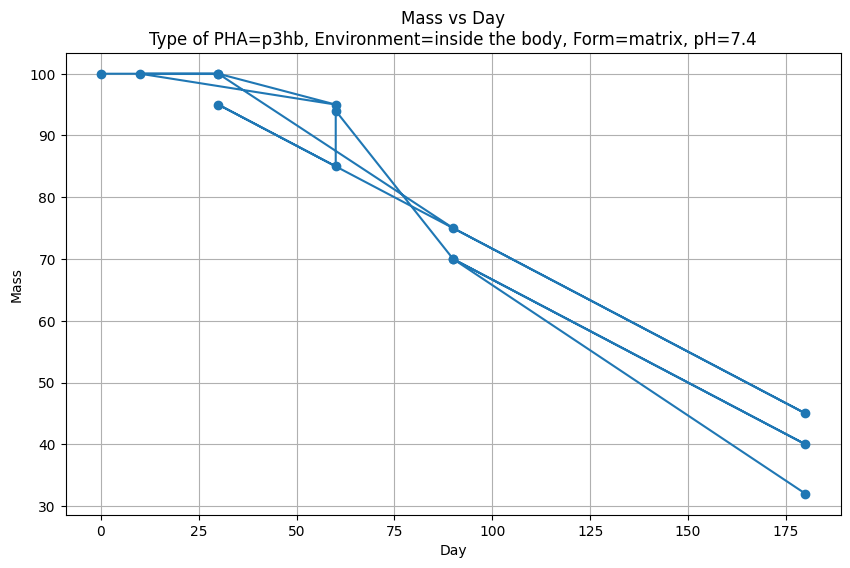

[0.0, 30.0, 10.0, 30.0, 90.0, 180.0, 30.0, 60.0, 180.0, 30.0, 60.0, 180.0, 90.0, 180.0] [100.0, 75.0, 100.0, 63.0, 40.0, 30.0, 85.0, 70.0, 35.0, 74.0, 60.0, 25.0, 53.0, 26.0]
[0.0, 30.0, 60.0, 10.0, 30.0, 90.0, 180.0, 60.0, 90.0, 180.0, 90.0, 180.0, 90.0, 180.0, 90.0] [100.0, 80.0, 75.0, 100.0, 61.0, 53.0, 29.0, 65.0, 35.0, 30.0, 35.0, 20.0, 40.0, 30.0, 52.0]


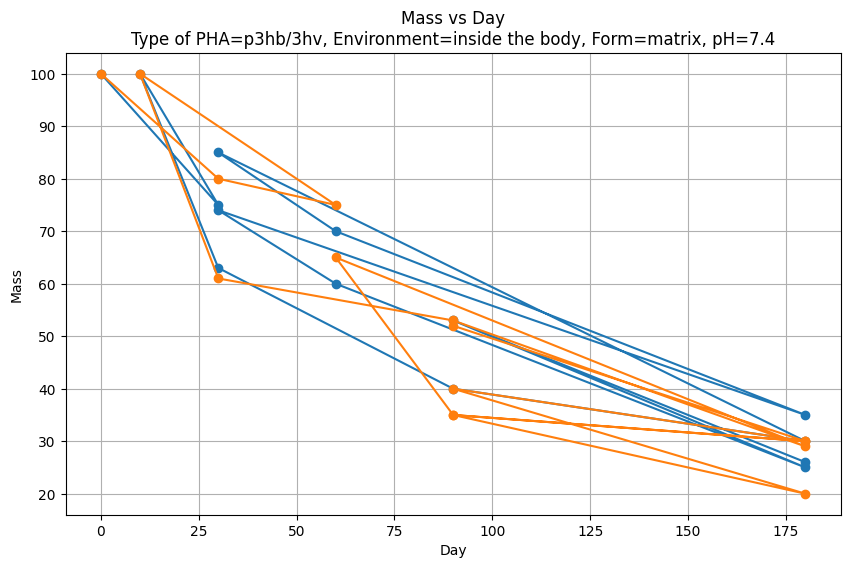

[0.0, 30.0, 90.0, 180.0] [100.0, 58.0, 46.0, 22.0]
[0.0, 60.0, 10.0, 30.0, 90.0, 180.0, 30.0, 60.0, 90.0, 180.0, 30.0, 90.0, 180.0, 30.0, 90.0, 180.0] [100.0, 65.0, 100.0, 57.99999999999999, 22.0, 20.0, 80.0, 50.0, 20.0, 10.0, 80.0, 30.0, 12.0, 75.0, 20.0, 10.0]


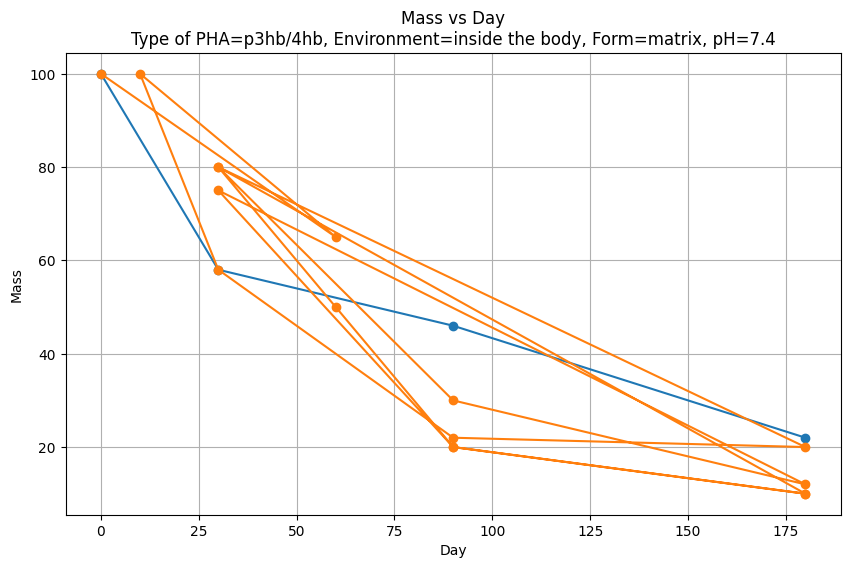

[0.0, 30.0, 10.0, 30.0, 90.0, 180.0, 30.0, 60.0, 90.0, 180.0, 60.0, 90.0, 180.0, 30.0, 90.0, 180.0, 90.0, 180.0] [100.0, 76.0, 100.0, 67.0, 29.0, 10.0, 80.0, 60.0, 33.0, 20.0, 55.0, 22.0, 5.0, 75.0, 33.0, 20.0, 54.0, 29.0]


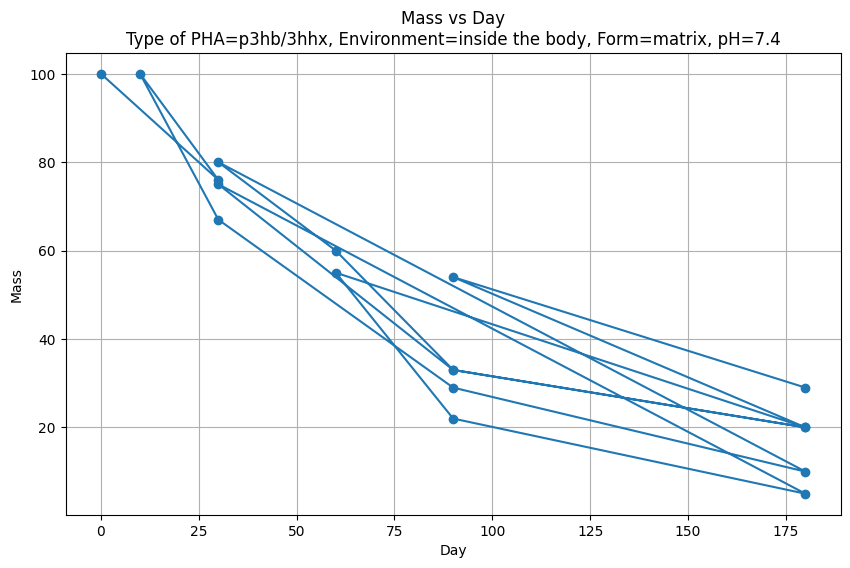

[98.0] [100.0]


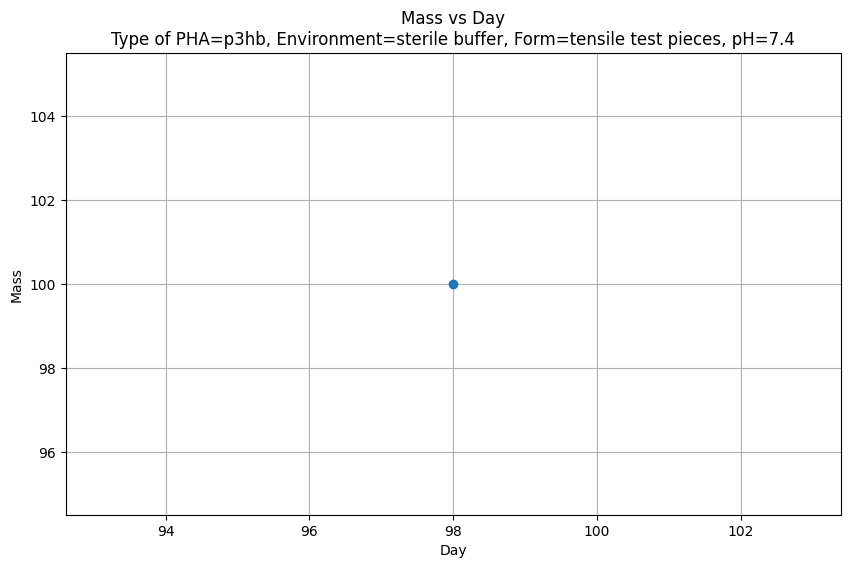

[98.0] [100.0]


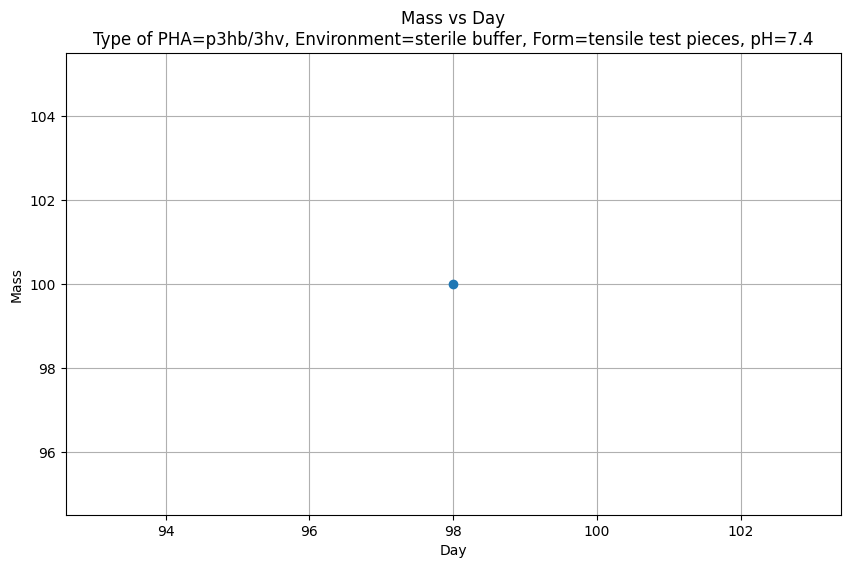

[40.0, 28.0, 98.0, 98.0] [97.0, 100.0, 100.0, 100.0]


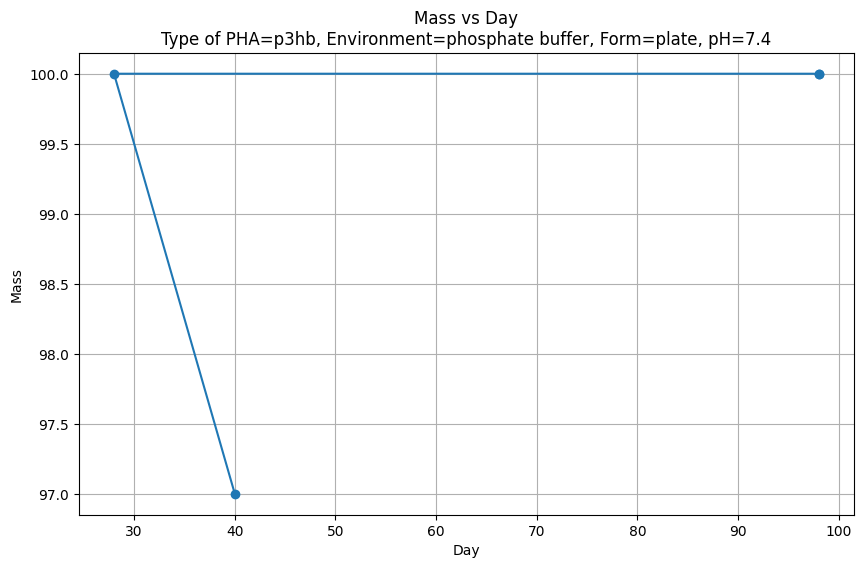

[180.0, 180.0] [100.0, 0.0]


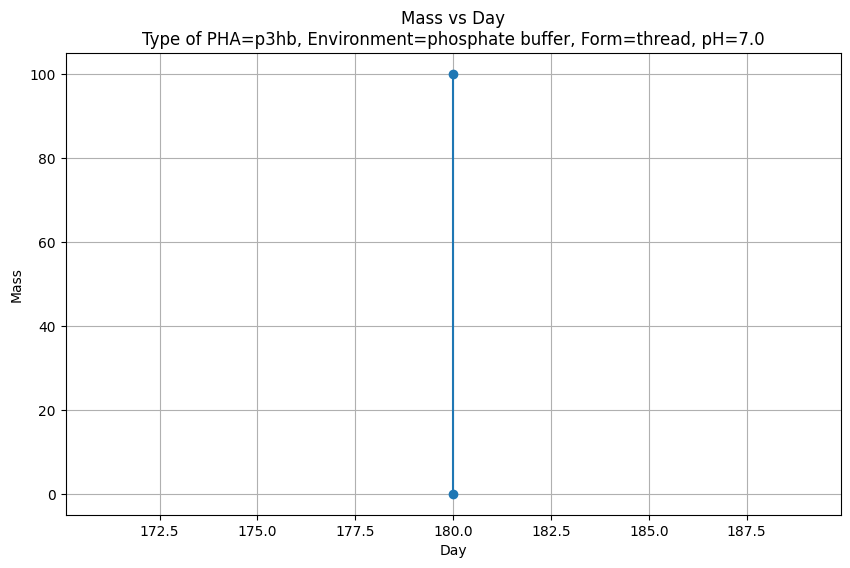

[182.0] [100.0]


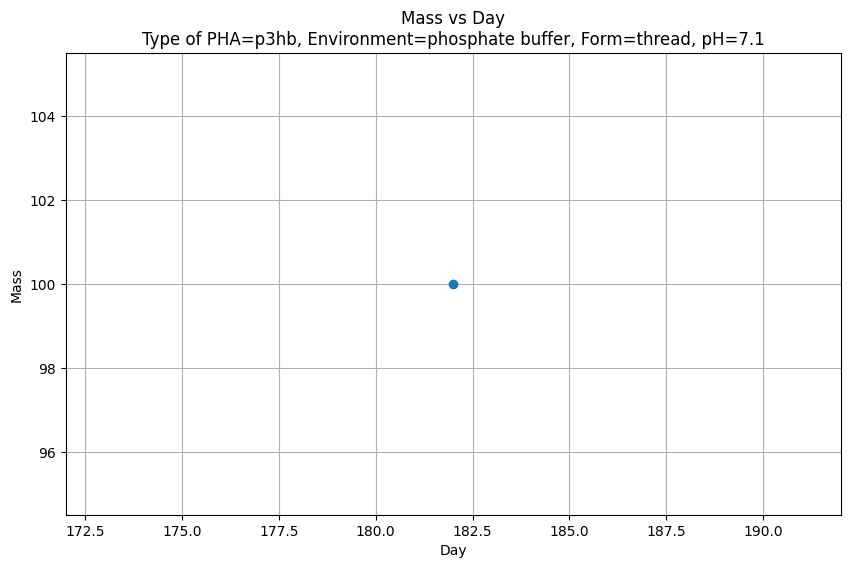

[150.0, 150.0, 150.0] [100.0, 50.0, 0.0]


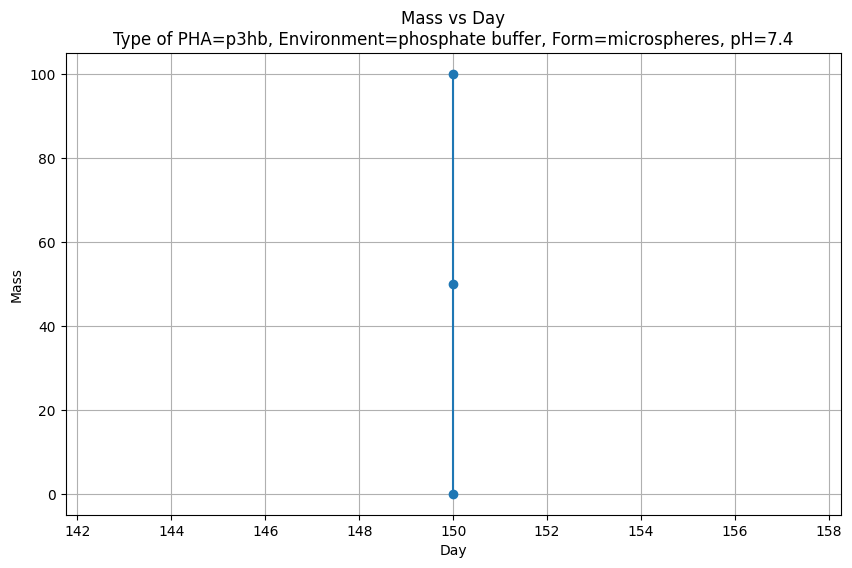

[180.0, 180.0] [100.0, 0.0]


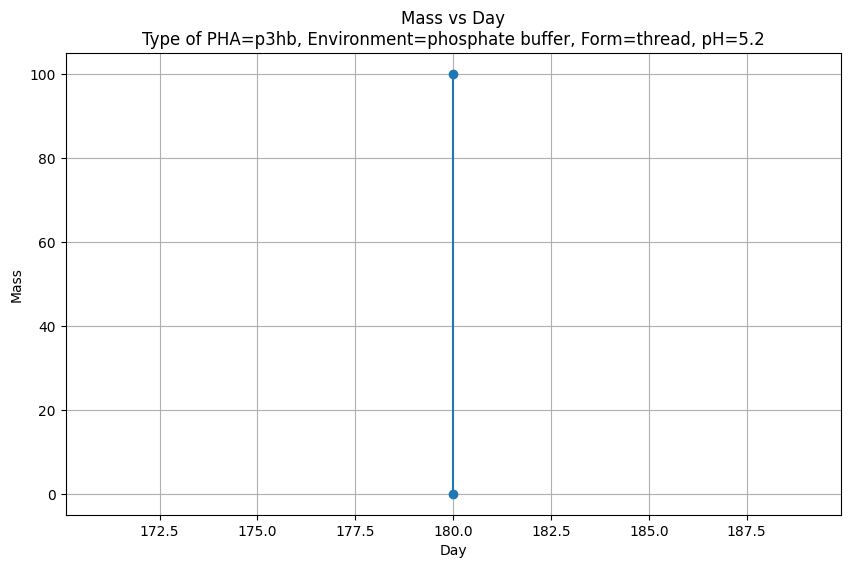

[28.0] [0.0]


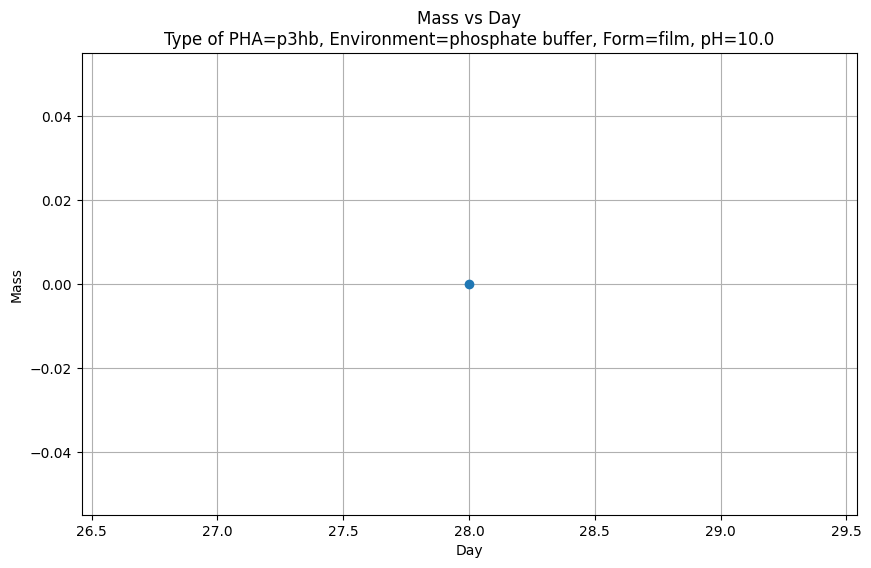

[19.0] [0.0]


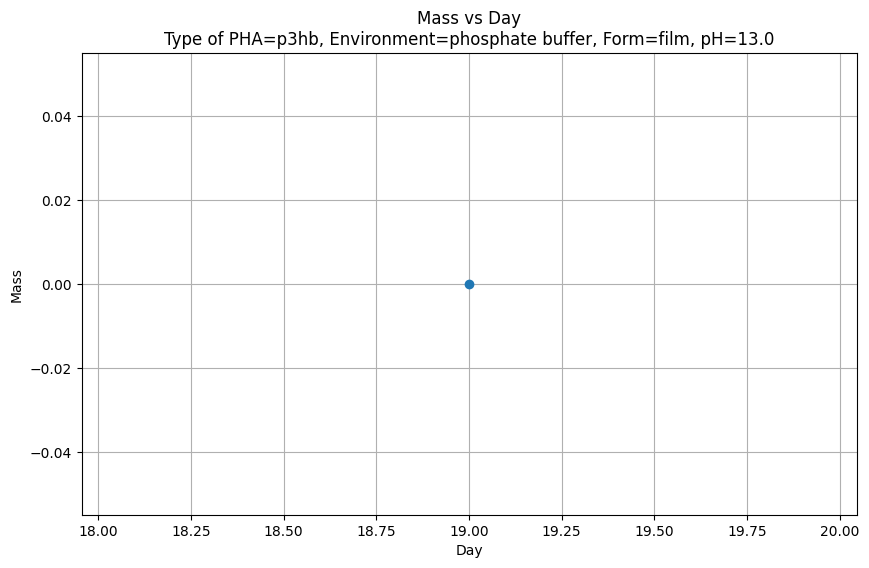

[84.0, 14.0, 28.0, 56.0] [97.5, 96.03, 74.06, 46.99]


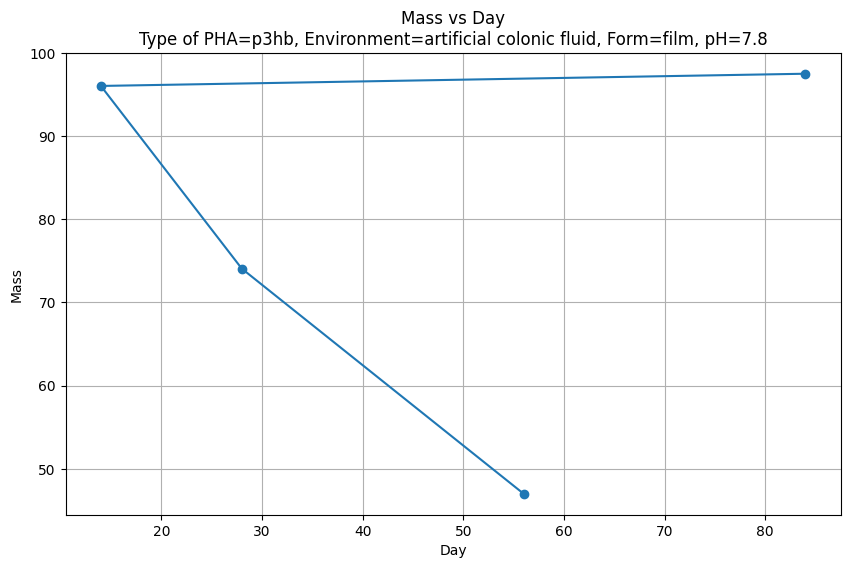

[84.0, 14.0, 28.0, 56.0] [59.97, 76.95, 80.02, 62.21]
[84.0, 14.0, 28.0, 56.0] [59.74, 93.35, 75.35, 56.18]


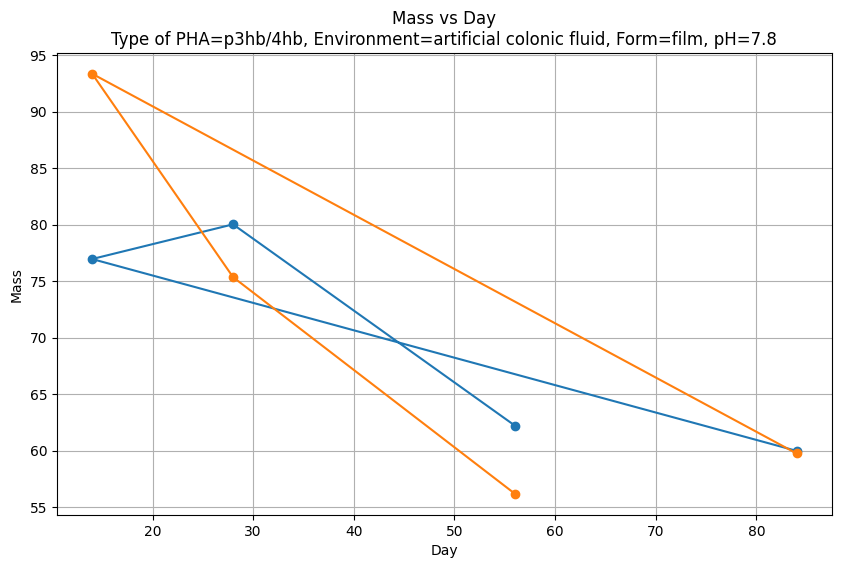

[182.0, 182.0] [100.0, 0.0]


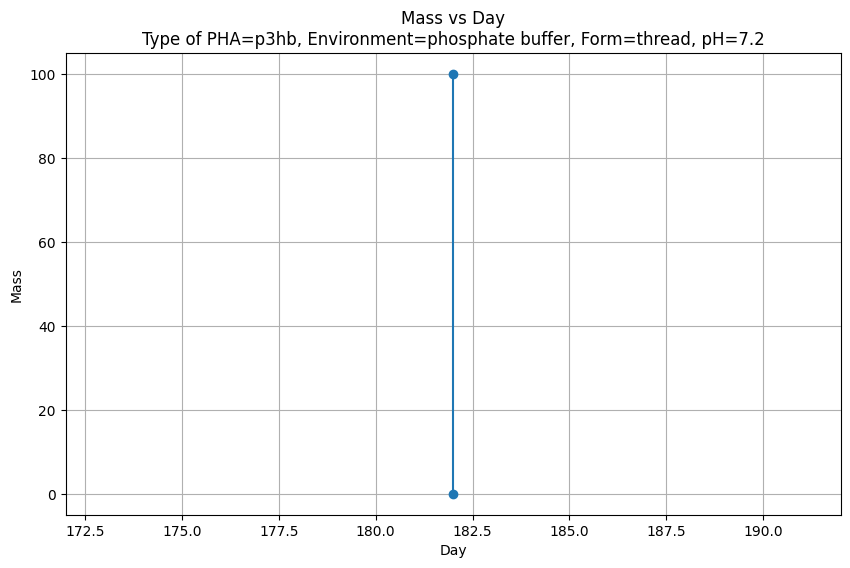

[14.0, 28.0, 56.0, 84.0] [66.24, 70.43, 36.66, 22.23]


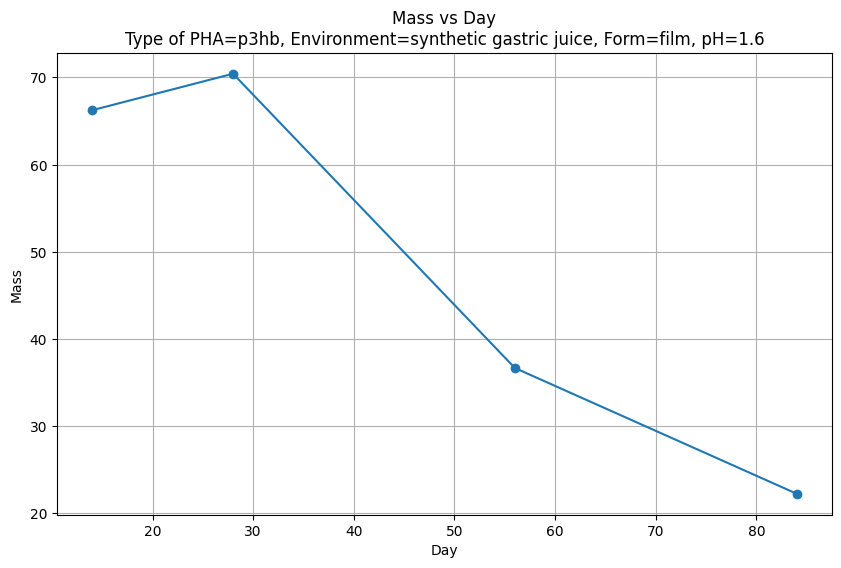

[14.0, 28.0, 56.0, 84.0] [69.73, 45.09, 39.93, 20.69]
[14.0, 28.0, 56.0, 84.0] [63.68, 39.27, 28.87, 18.89]


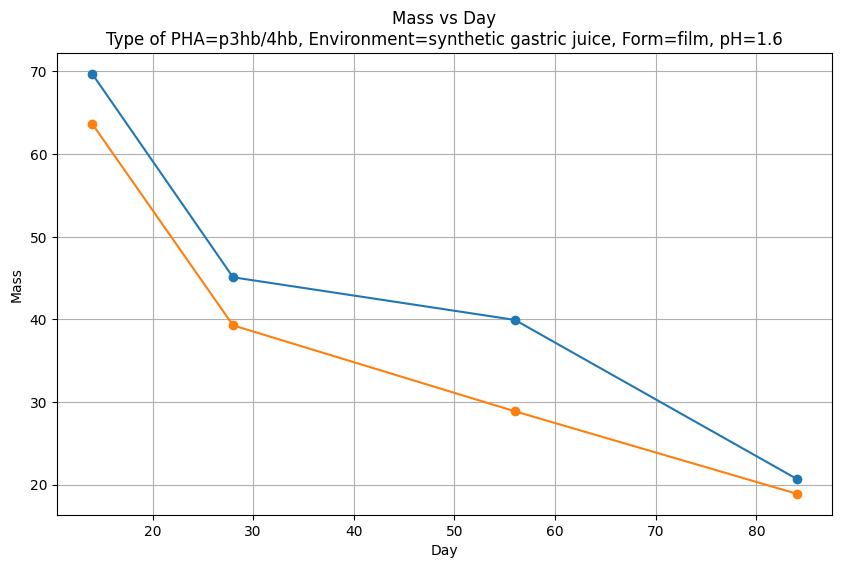

[0.0, 21.0, 40.0, 81.0] [100.0, 71.7, 59.4, 48.3]


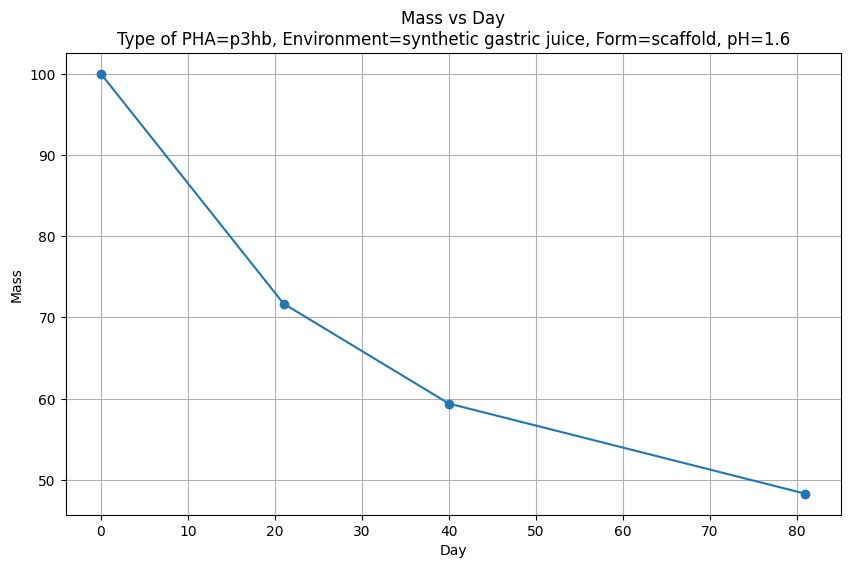

[0.0, 21.0, 40.0, 81.0] [100.0, 82.6, 72.4, 66.0]
[0.0, 21.0, 40.0, 81.0] [100.0, 87.6, 71.8, 62.9]


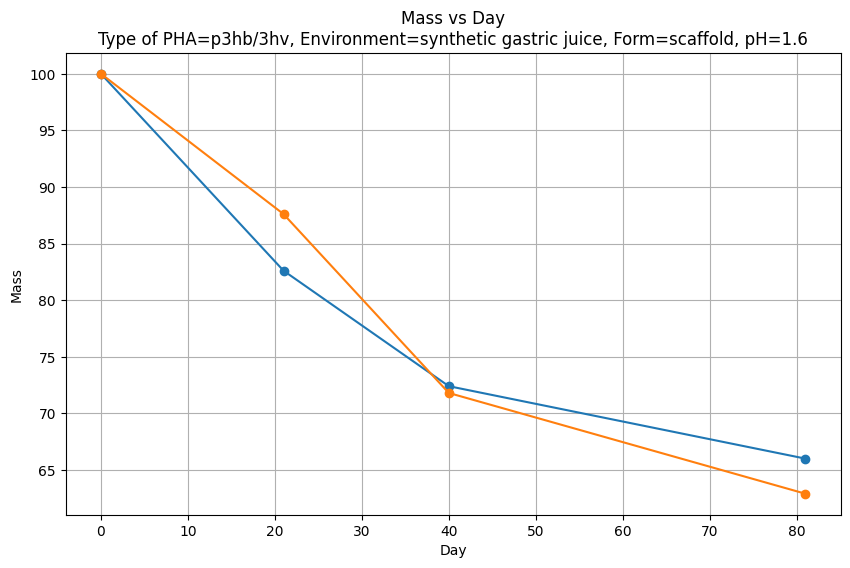

[0.0, 21.0, 40.0, 81.0] [100.0, 76.1, 67.3, 56.3]


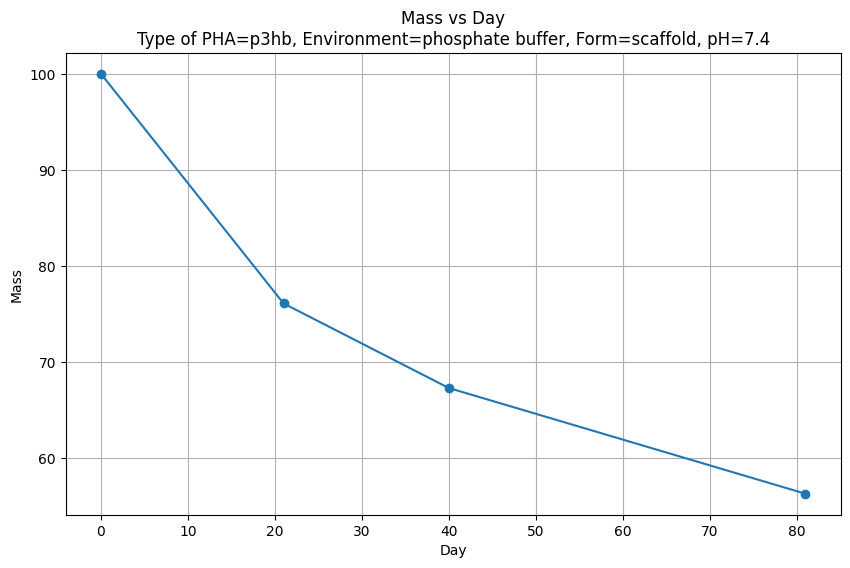

[0.0, 21.0, 40.0, 81.0] [100.0, 89.4, 76.2, 66.4]
[0.0, 21.0, 40.0, 81.0] [100.0, 90.9, 77.2, 65.6]


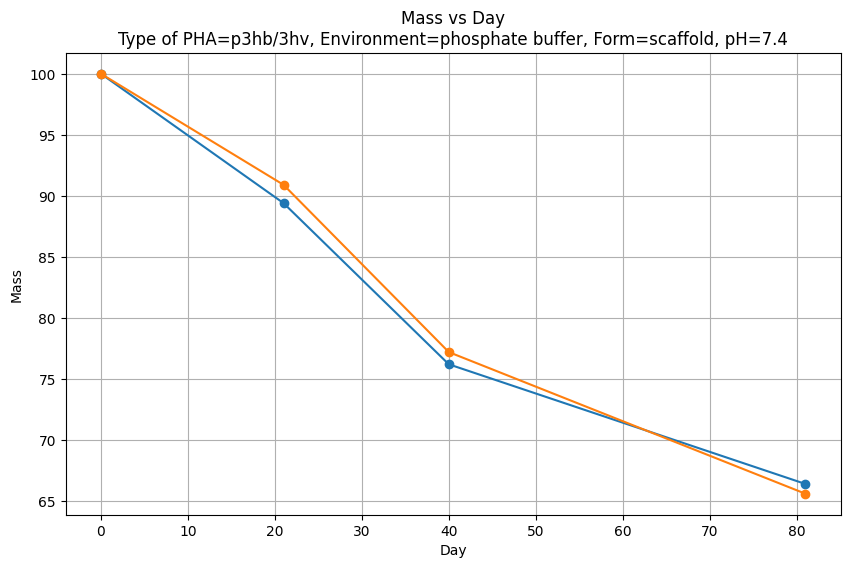

[28.0] [100.0]


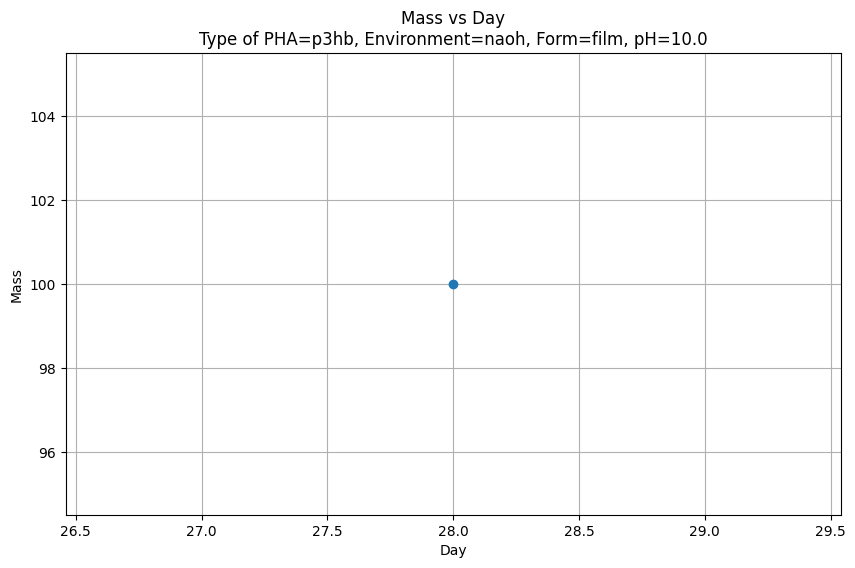

[19.0] [100.0]


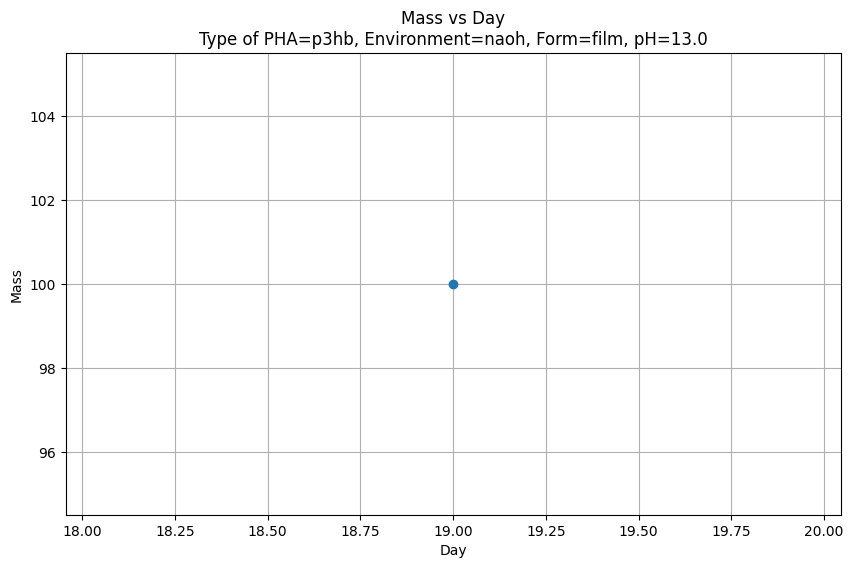

[6.5] [90.0]


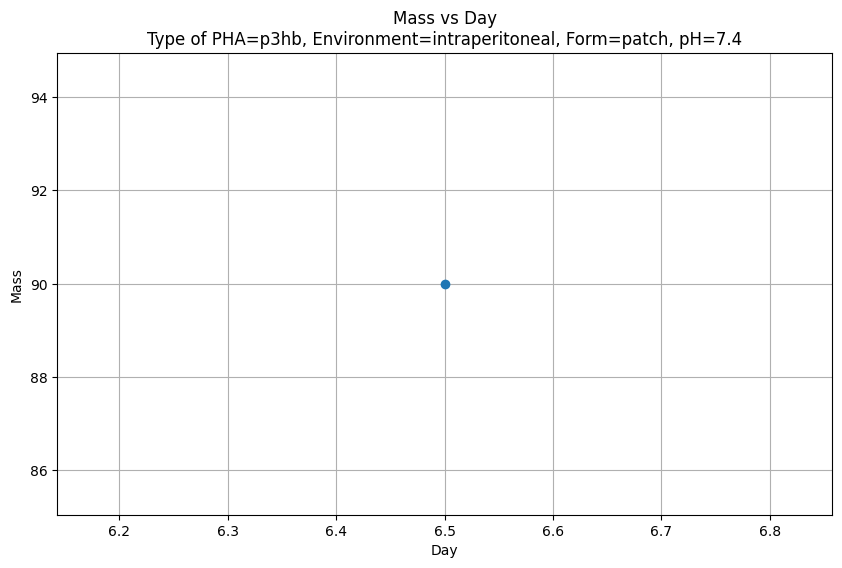

[6.5] [50.0]


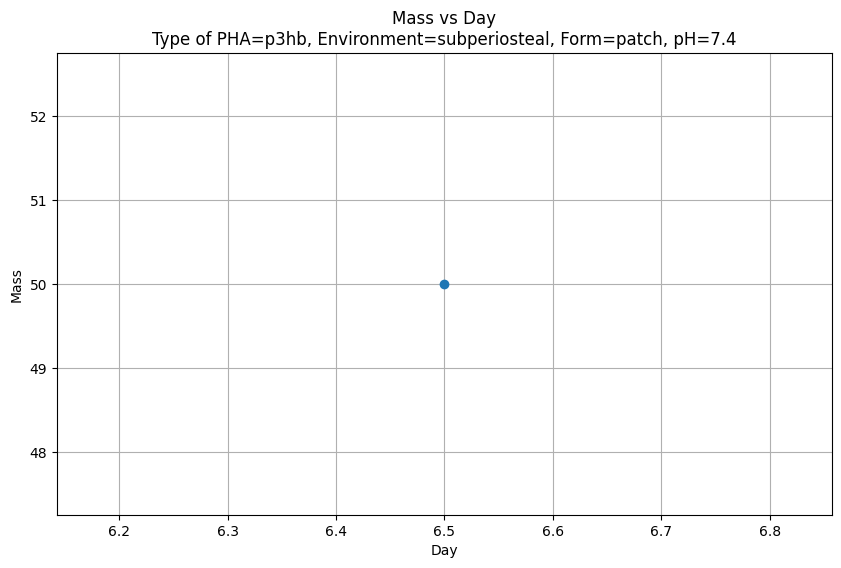

[25.0] [10.0]


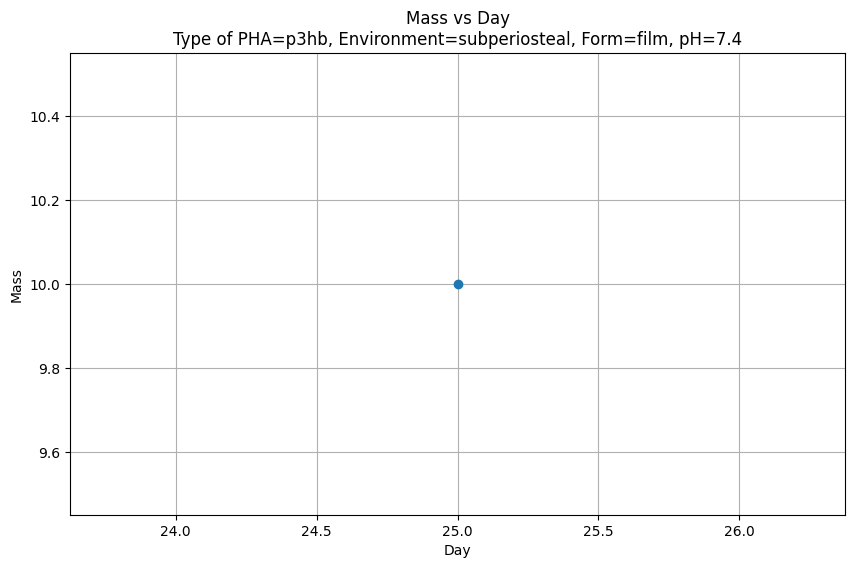

[25.0, 12.0] [10.0, 0.0]


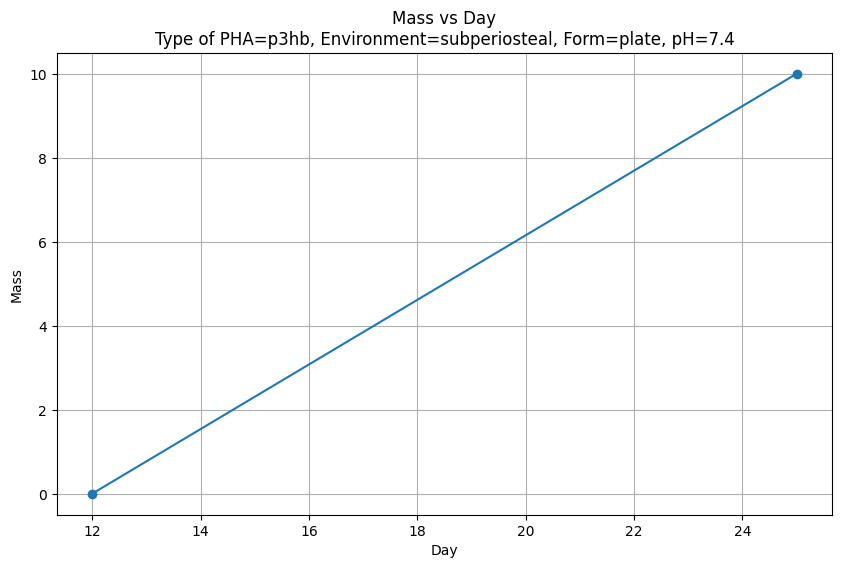

[12.0] [0.0]


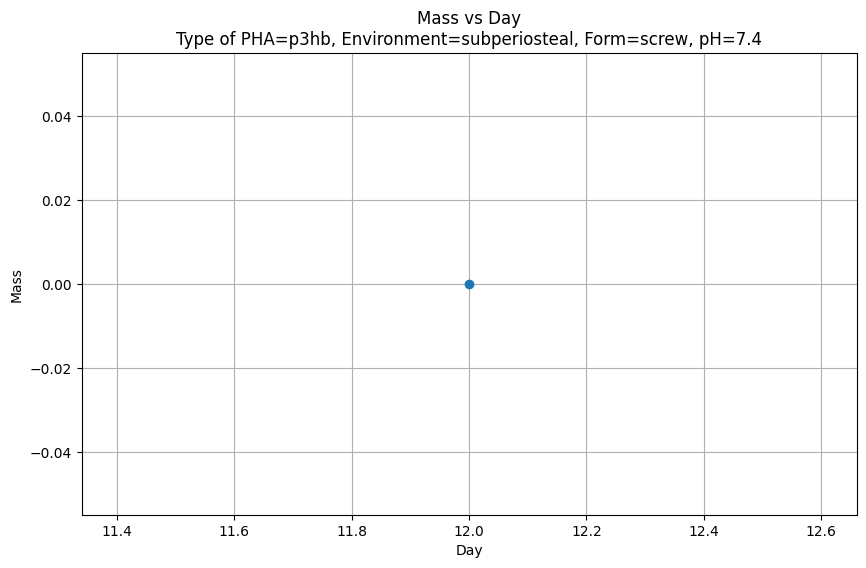

[1.0, 12.0] [0.0, 25.0]


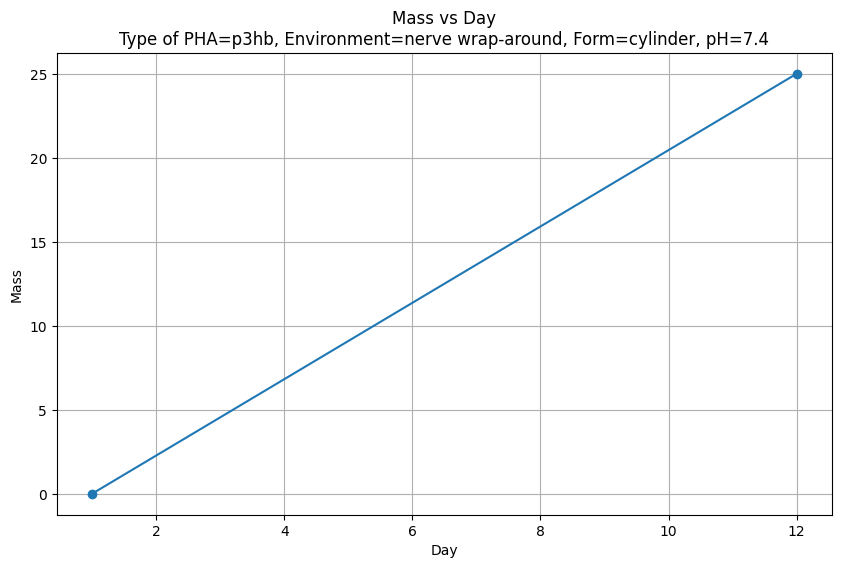

[6.0] [0.0]


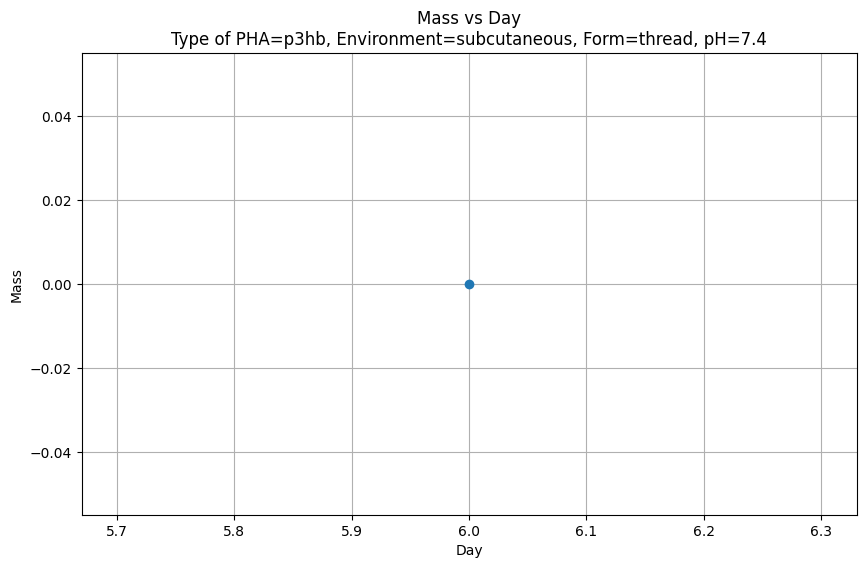

[2.0] [30.0]


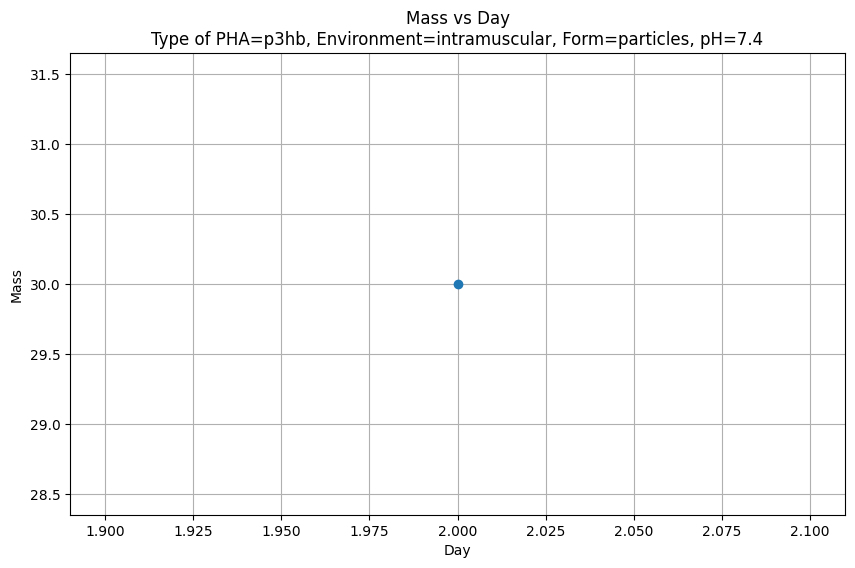

[2.0] [30.0]


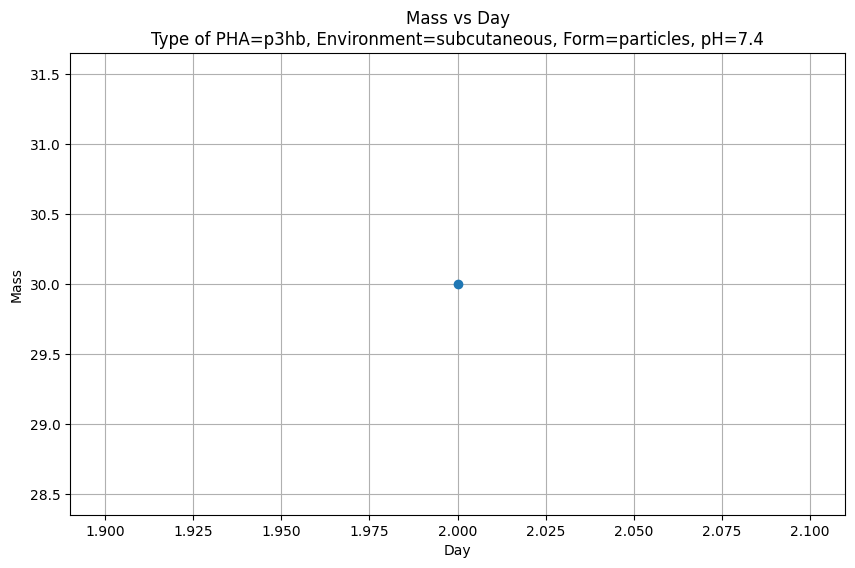

[24.0] [90.0]


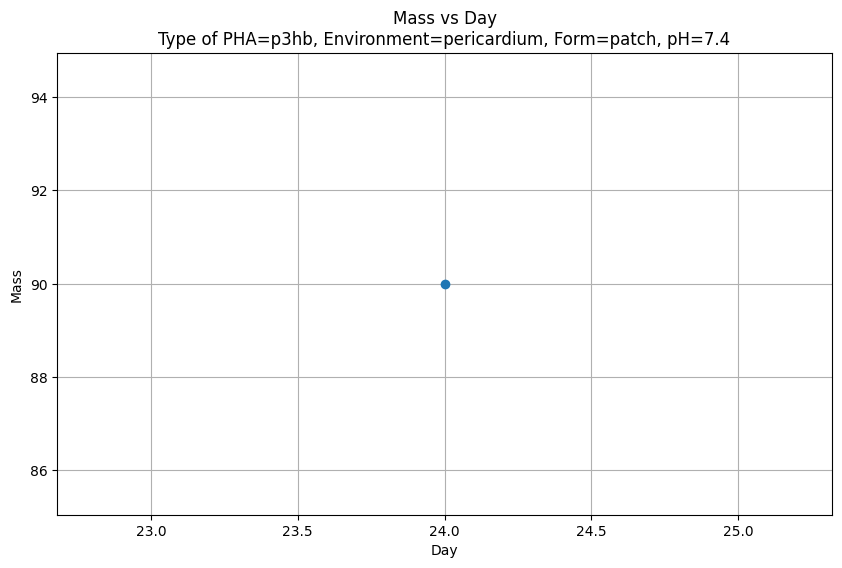

[12.0] [99.0]


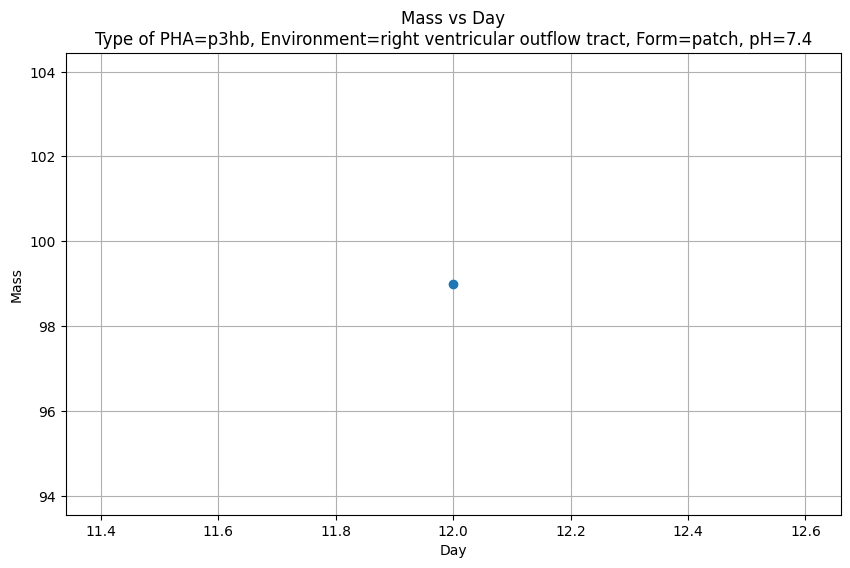

[12.0] [99.0]


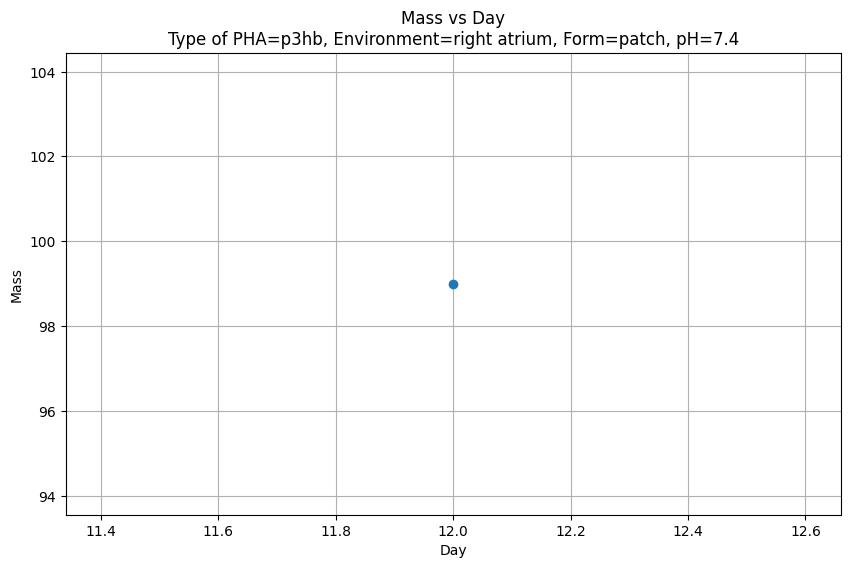

[2.0] [8.0]


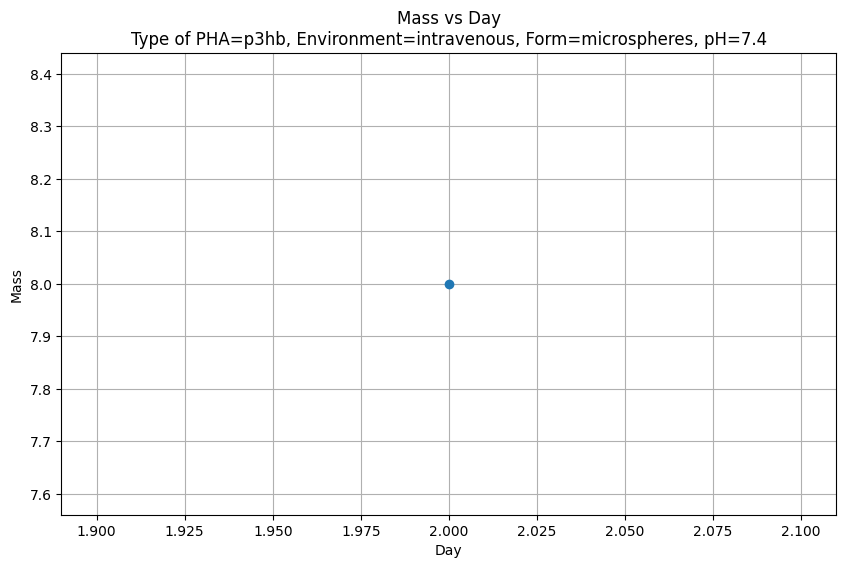

[6.0] [10.0]


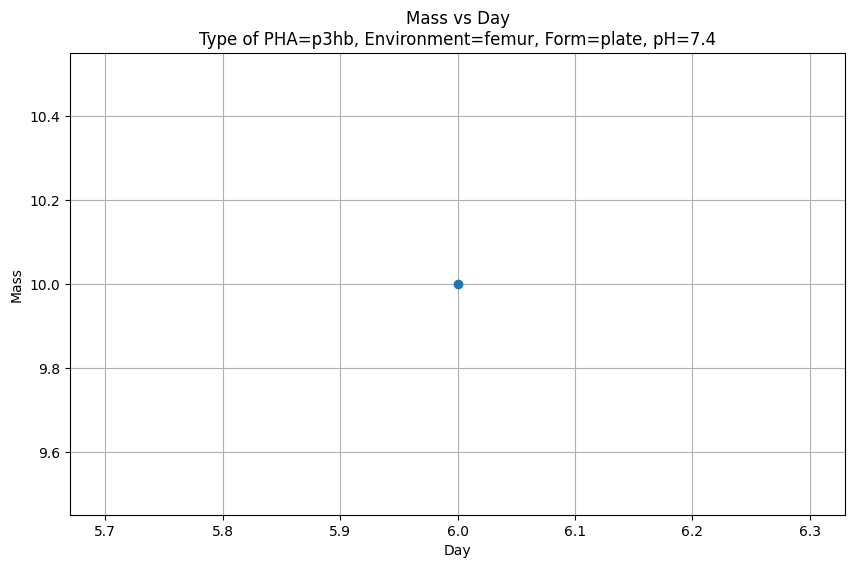

Нет групп для комбинации: type of pha='p3hb/3hhx', environment='inside the body', form='disc', ph=7.4
[0.0, 30.0, 90.0, 180.0] [100.0, 100.0, 99.0, 94.0]


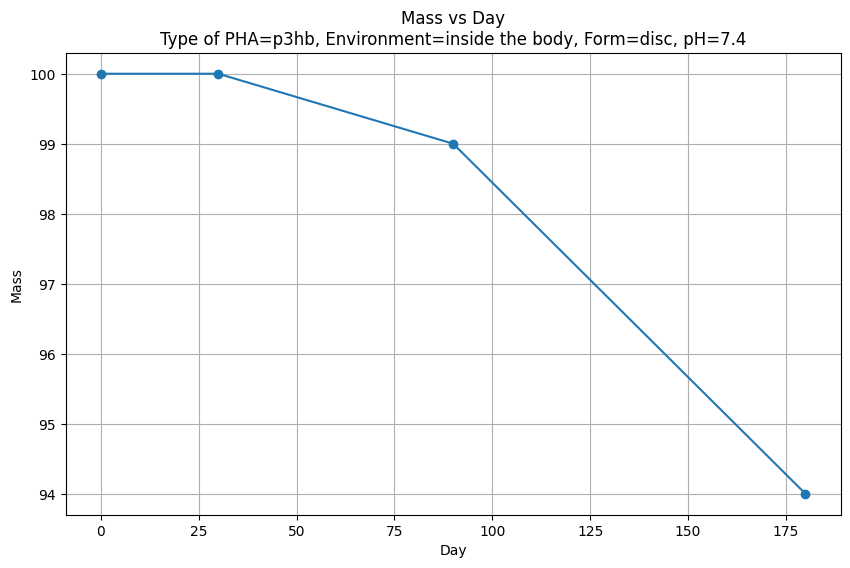

[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]
[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]


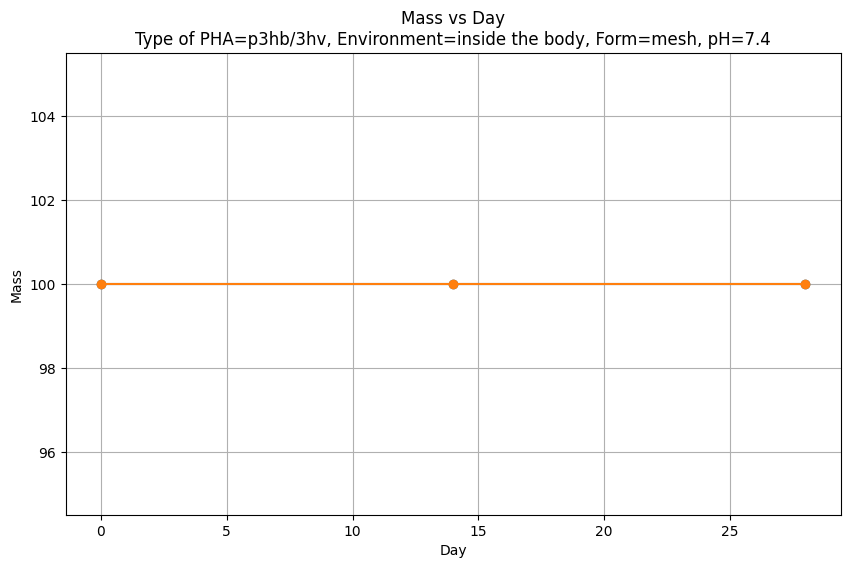

[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]


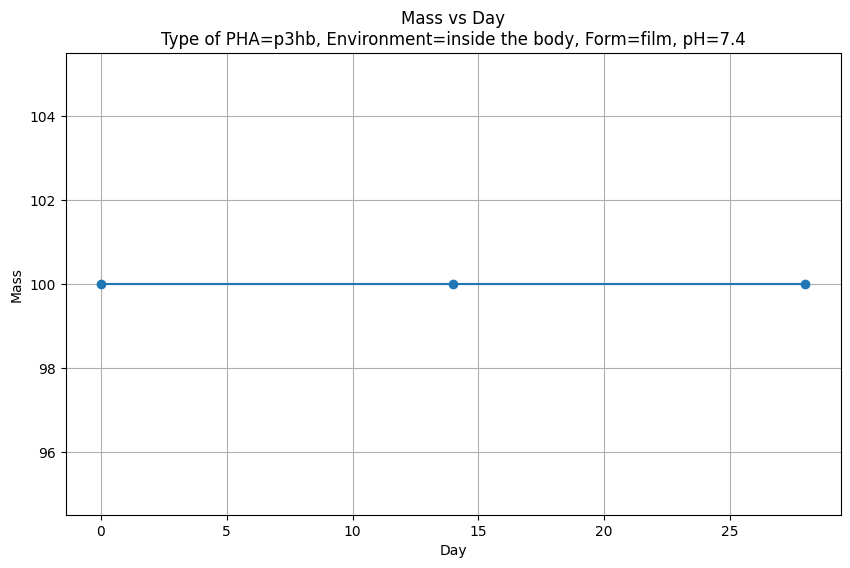

[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]
[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]


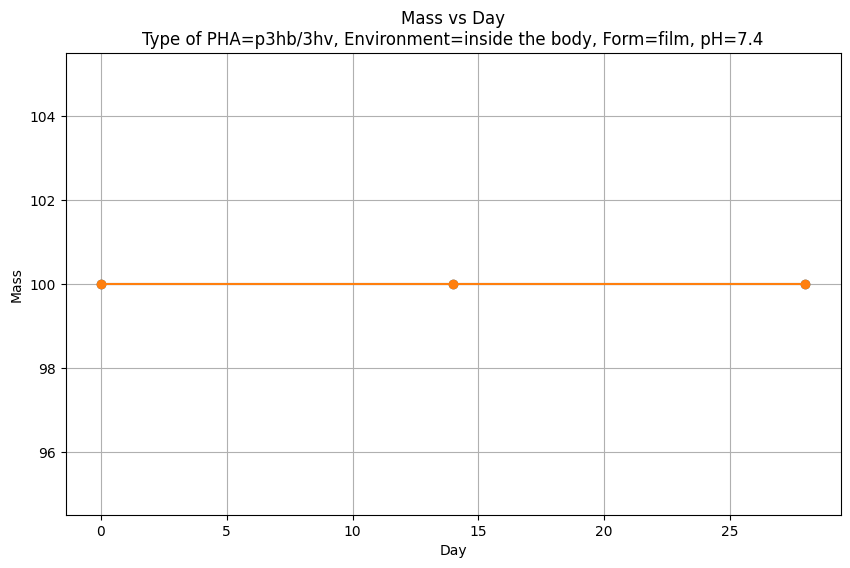

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Загрузка данных
df = pd.read_excel('cleaned_file_no_article_duplicates.xlsx')

# Проверка наличия всех необходимых столбцов
required_columns = ['type of pha', '% second component', 'day', 'environment', 'form',
                   'enzymatic', 'ph', 'in vivo', 'mass', 'porosity', 'dimensionality',
                   'article', 'environment_type', 'form_type']
if not all(col in df.columns for col in required_columns):
    raise ValueError("Файл не содержит всех необходимых столбцов")

# Проверка и преобразование столбца mass в float
if not pd.api.types.is_float_dtype(df['mass']):
    try:
        df['mass'] = df['mass'].astype(float)
    except ValueError:
        raise ValueError("Столбец 'mass' содержит значения, которые нельзя преобразовать в float")

# Создание директории для сохранения графиков
output_dir = 'plots'
os.makedirs(output_dir, exist_ok=True)

# Получение уникальных комбинаций type of pha, environment, form и ph
combinations = df[['type of pha', 'environment', 'form', 'ph']].drop_duplicates().reset_index(drop=True)

# Список столбцов для группировки (все, кроме 'mass', 'day' и 'article')
group_cols = [col for col in required_columns if col not in ['mass', 'day', 'article']]

# Проход по всем комбинациям
for _, comb in combinations.iterrows():
    type_of_pha = comb['type of pha']
    environment = comb['environment']
    form = comb['form']
    ph = comb['ph']

    # Фильтрация данных по текущей комбинации
    filtered_df = df[
        (df['type of pha'] == type_of_pha) &
        (df['environment'] == environment) &
        (df['form'] == form) &
        (df['ph'] == ph)
    ]

    if filtered_df.empty:
        print(f"Нет данных для комбинации: type of pha='{type_of_pha}', environment='{environment}', form='{form}', ph={ph}")
        continue

    # Группировка данных
    grouped = filtered_df.groupby(group_cols).agg({
        'day': list,
        'mass': list
    }).reset_index()

    if grouped.empty:
        print(f"Нет групп для комбинации: type of pha='{type_of_pha}', environment='{environment}', form='{form}', ph={ph}")
        continue



    # Построение графика
    plt.figure(figsize=(10, 6))

    for idx, row in grouped.iterrows():
        days = row['day']
        masses = row['mass']
        print(days, masses)

        # Формируем метку для легенды
        group_label = ', '.join([f"{col}={row[col]}" for col in group_cols if col not in ['type of pha', 'environment', 'form', 'ph']])
        if not group_label:
            group_label = f"Group {idx + 1}"

        # Строим линию для группы
        plt.plot(days, masses, marker='o', linestyle='-', label=group_label)

    # Настройка графика
    plt.xlabel('Day')
    plt.ylabel('Mass')
    plt.title(f'Mass vs Day\nType of PHA={type_of_pha}, Environment={environment}, Form={form}, pH={ph}')
    plt.grid(True)

    # Сохранение графика
    plt.show()

# после зачистки


Нет групп для комбинации: type of pha='p3hb/4hb', environment='simulated body fluid', form='film', ph=7.4
[14.0, 28.0, 56.0, 84.0] [84.0, 88.0, 76.0, 50.0]
[14.0, 28.0, 56.0, 84.0] [109.0, 94.0, 88.0, 64.0]


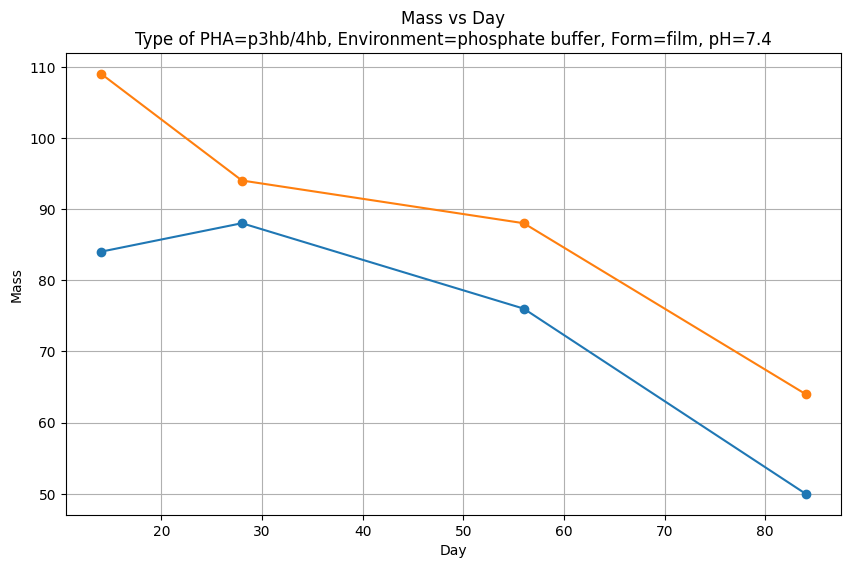

[30.0, 60.0, 90.0, 180.0] [90.0, 80.0, 70.0, 60.0]


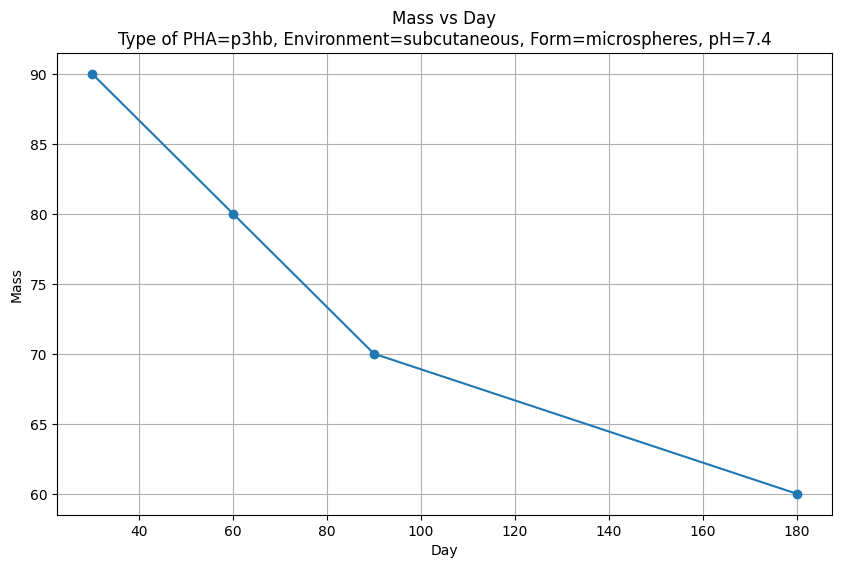

[30.0, 60.0, 90.0, 180.0] [95.0, 85.0, 75.0, 65.0]


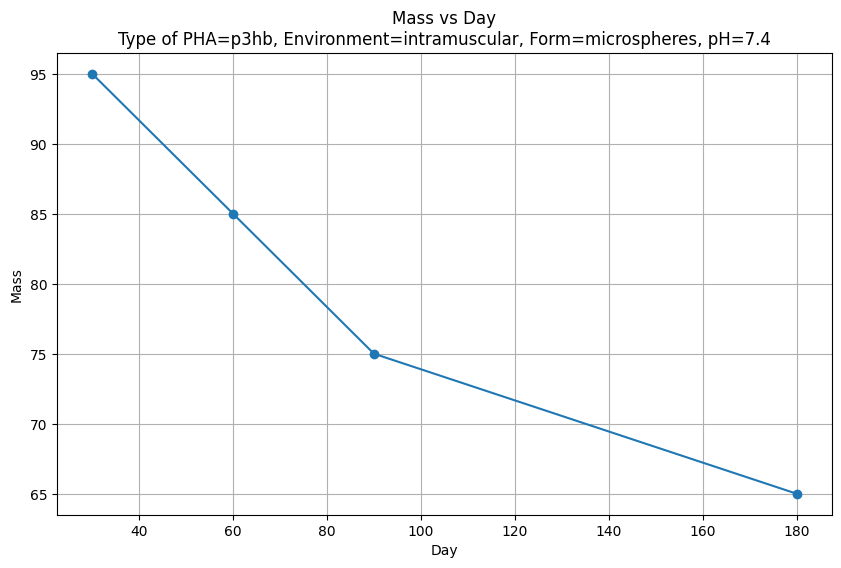

[30.0, 60.0, 90.0, 180.0] [98.0, 90.0, 80.0, 70.0]


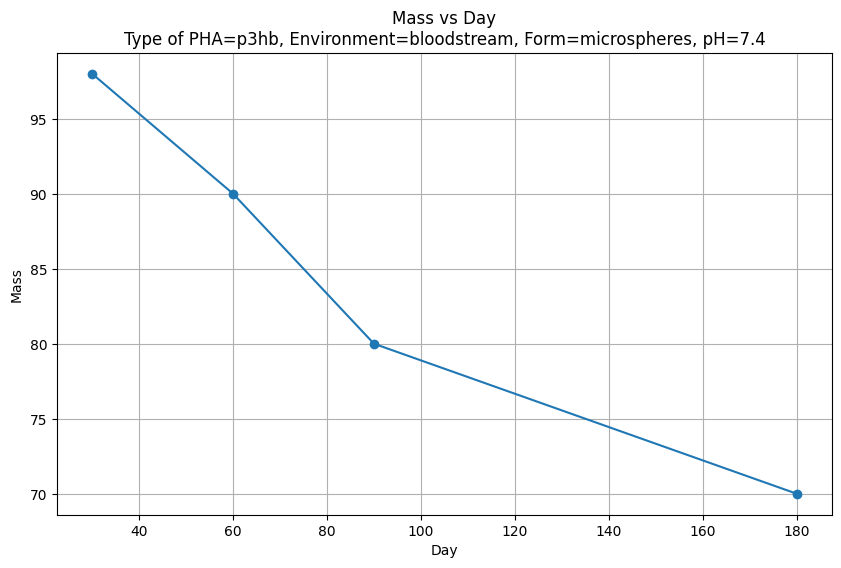

[30.0, 60.0, 90.0, 180.0] [95.0, 85.0, 75.0, 65.0]


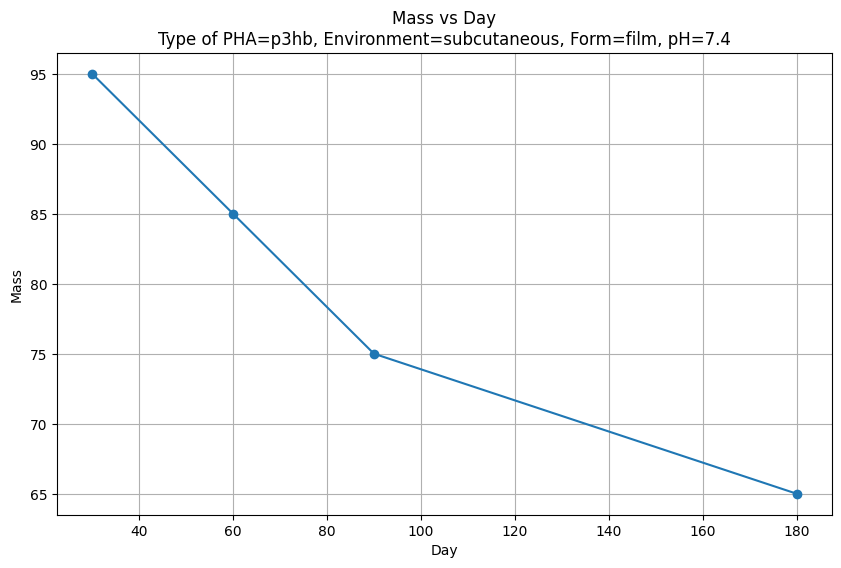

[30.0, 60.0, 90.0, 180.0] [90.0, 80.0, 70.0, 60.0]


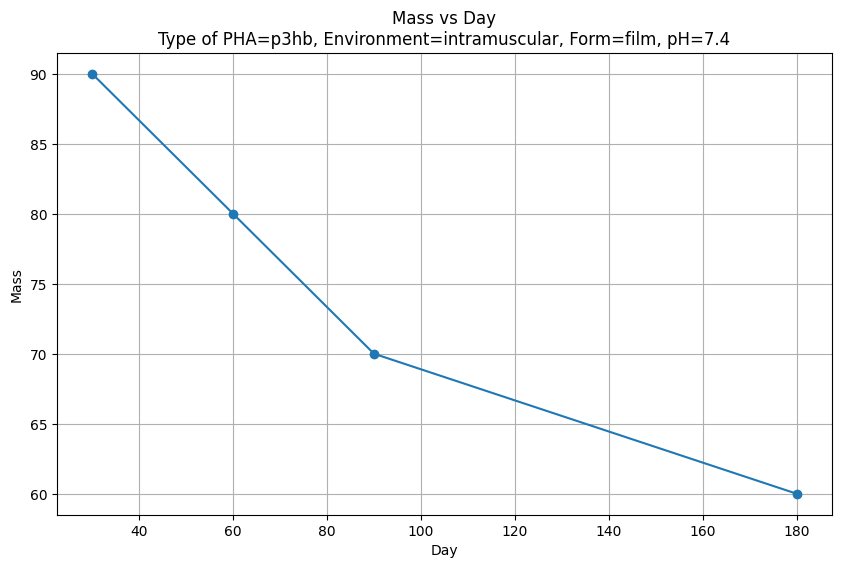

[30.0, 60.0, 90.0, 180.0] [95.0, 85.0, 75.0, 65.0]


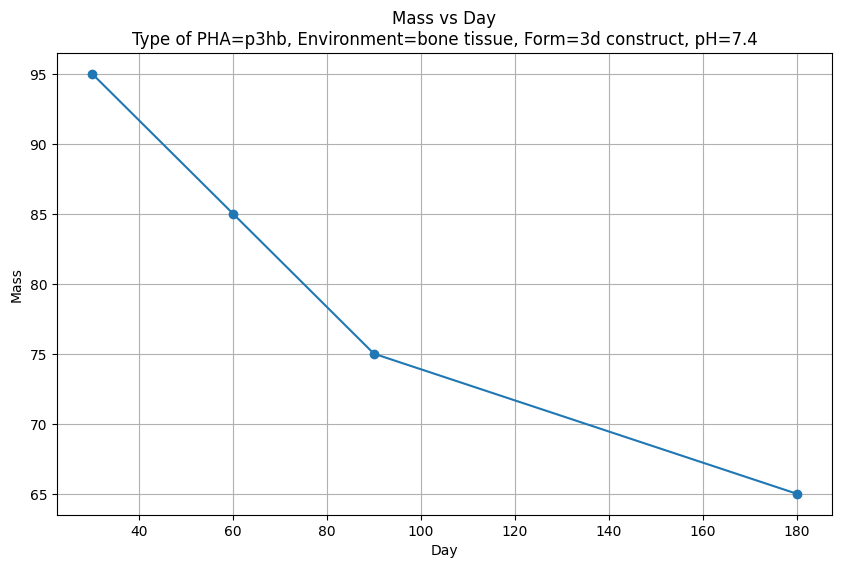

Нет групп для комбинации: type of pha='p3hb/3hv', environment='subcutaneous', form='film', ph=7.4
Нет групп для комбинации: type of pha='p3hb/4hb', environment='subcutaneous', form='film', ph=7.4
[0.0, 7.0, 14.0, 21.0, 28.0, 35.0, 42.0, 49.0, 56.0] [100.0, 97.0, 94.0, 91.0, 88.0, 85.0, 82.0, 79.0, 76.0]


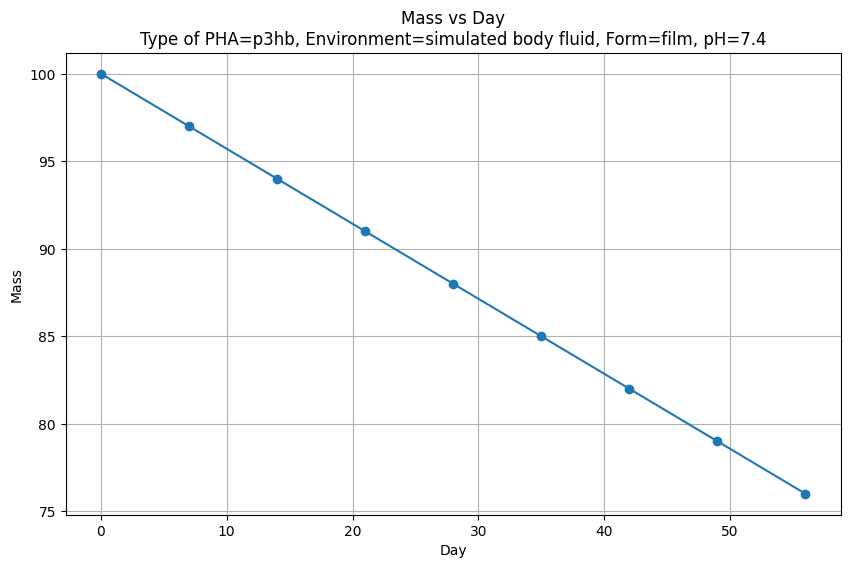

[0.0, 7.0, 14.0, 21.0, 28.0, 35.0, 42.0, 49.0, 56.0, 360.0, 50.0] [100.0, 99.0, 98.0, 97.0, 96.0, 95.0, 94.0, 93.0, 92.0, 64.9, 92.5]


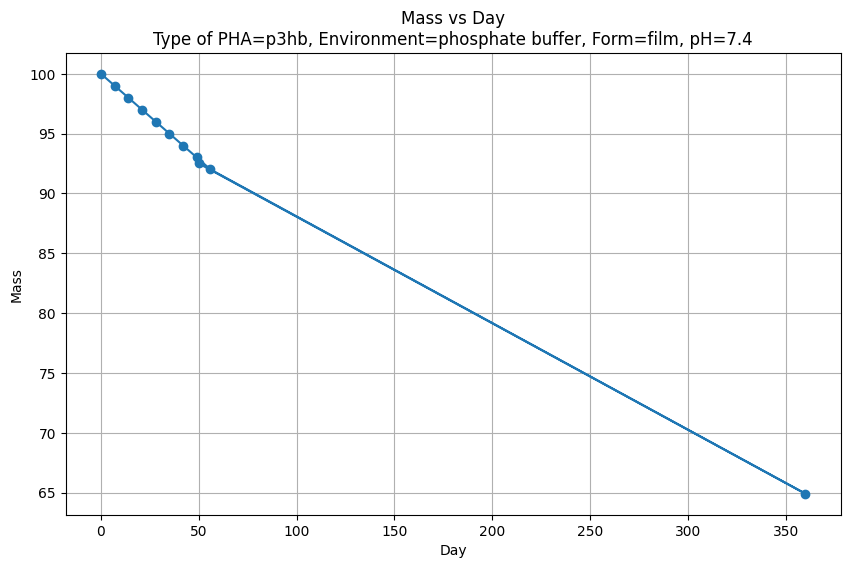

[30.0, 90.0, 180.0] [67.0, 54.0, 29.0]


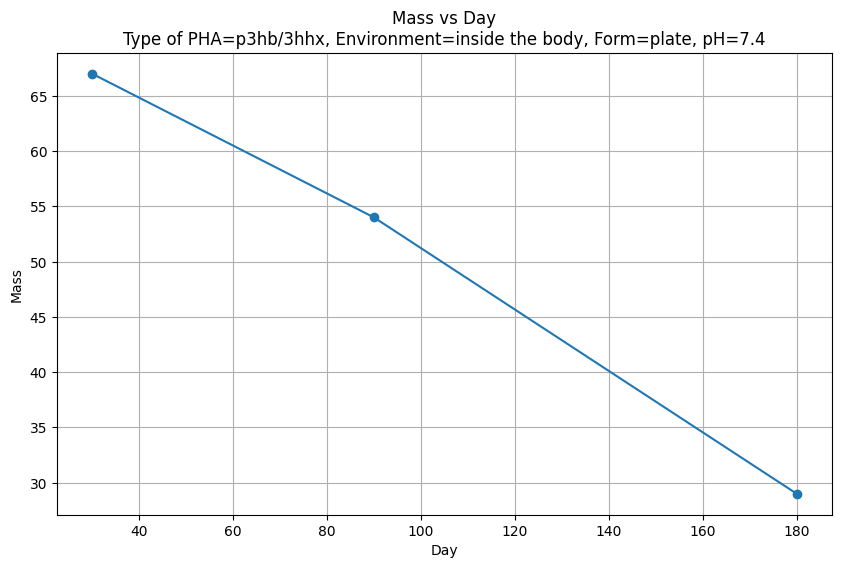

Нет групп для комбинации: type of pha='p3hb/4hb', environment='inside the body', form='plate', ph=7.4
[30.0, 90.0, 180.0] [63.0, 53.0, 27.0]
[30.0, 90.0, 180.0] [61.0, 53.0, 29.0]


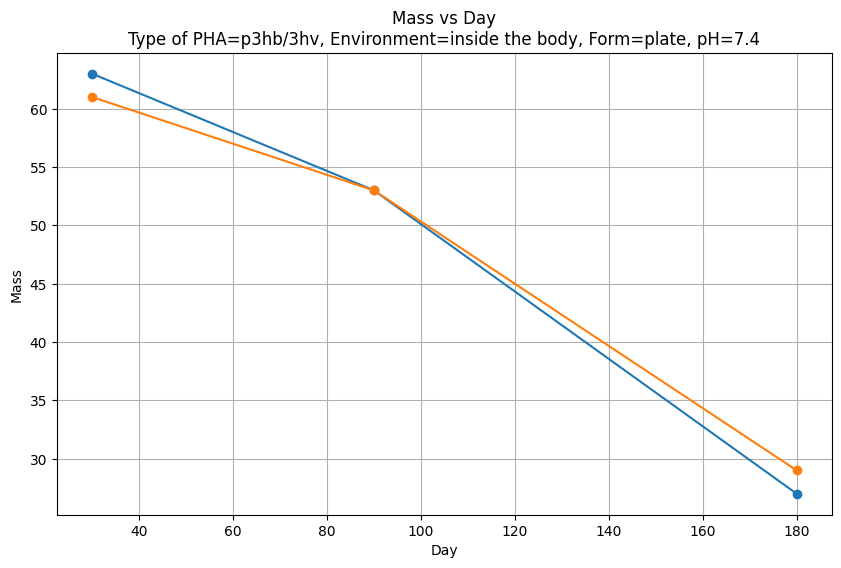

[30.0, 90.0] [60.0, 25.0]


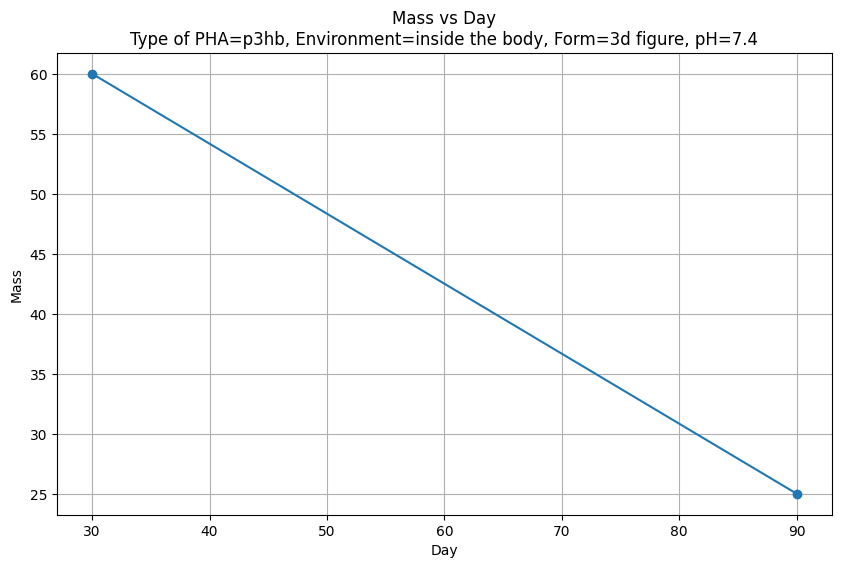

[30.0, 60.0, 90.0, 180.0, 0.0] [100.0, 100.0, 75.0, 45.0, 100.0]


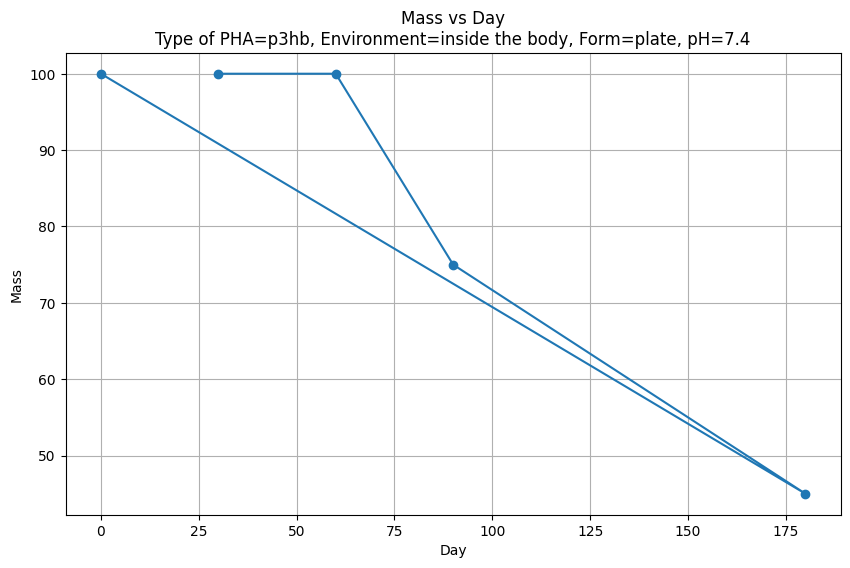

Нет групп для комбинации: type of pha='p3hb/4hb', environment='phosphate buffer', form='nanofiber membranes', ph=7.4
[14.0, 28.0, 56.0, 84.0] [66.0, 70.0, 37.0, 22.0]


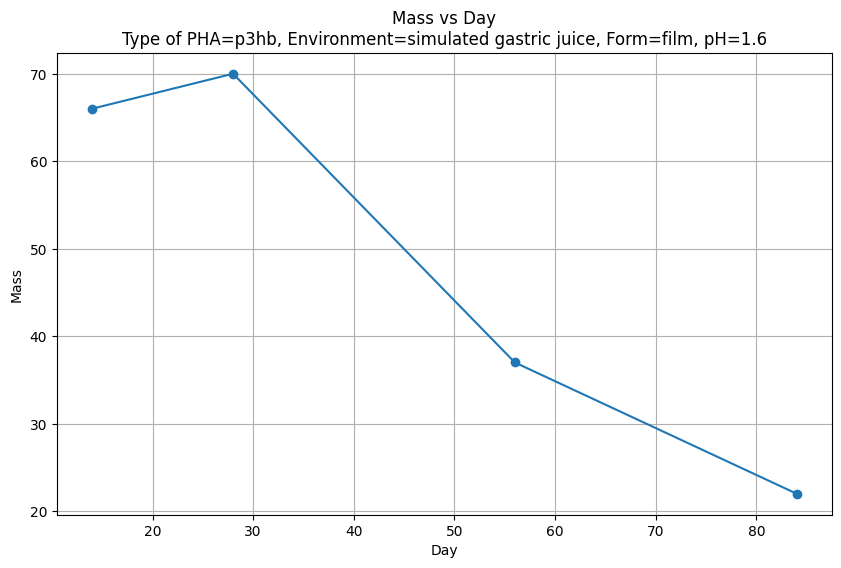

[14.0, 28.0, 56.0, 84.0] [70.0, 45.0, 40.0, 21.0]
[14.0, 28.0, 56.0, 84.0] [64.0, 39.0, 29.0, 19.0]


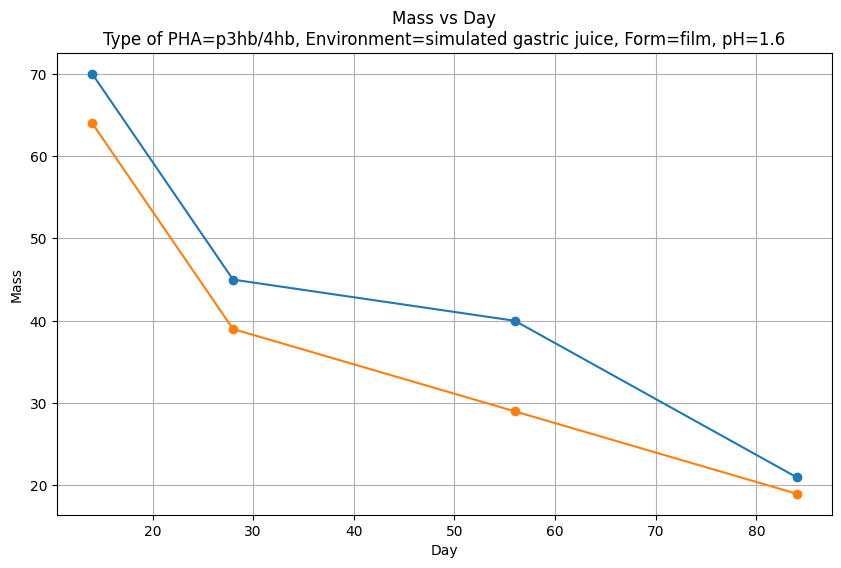

[14.0, 28.0, 56.0, 84.0] [96.0, 74.0, 47.0, 34.0]


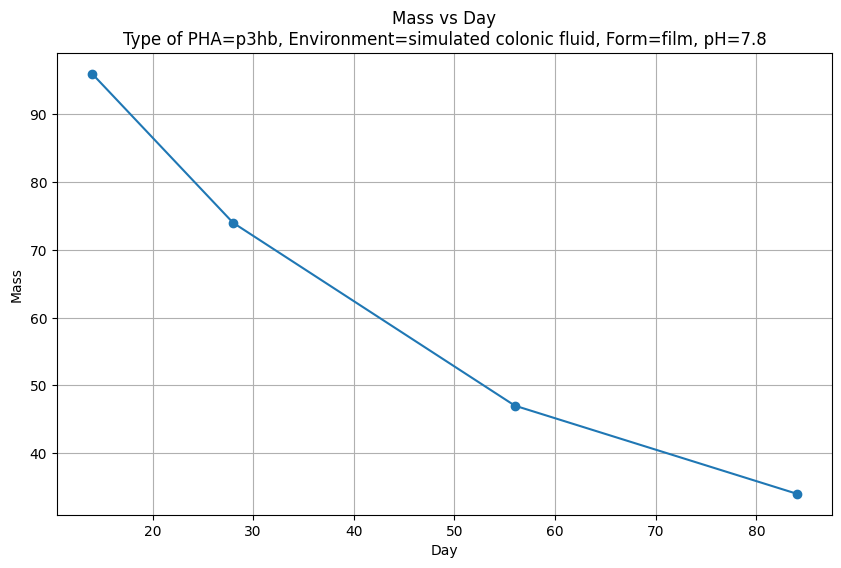

[14.0, 28.0, 56.0, 84.0] [77.0, 80.0, 62.0, 40.0]
[14.0, 28.0, 56.0, 84.0] [93.0, 75.0, 56.0, 40.0]


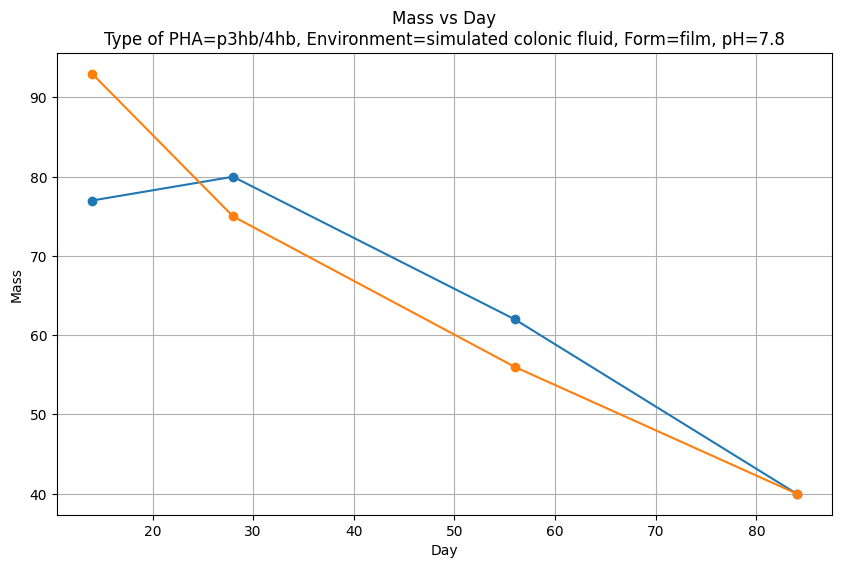

[0.0, 30.0, 60.0, 10.0, 30.0, 90.0, 180.0, 30.0, 60.0, 60.0, 90.0, 180.0, 90.0, 180.0] [100.0, 100.0, 95.0, 100.0, 100.0, 75.0, 45.0, 95.0, 85.0, 94.0, 70.0, 40.0, 70.0, 32.0]


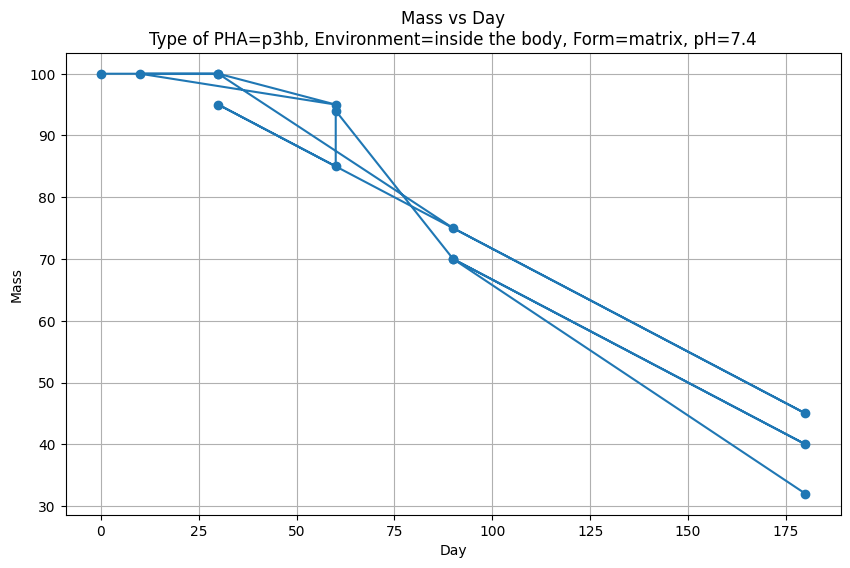

[0.0, 30.0, 10.0, 30.0, 90.0, 180.0, 30.0, 60.0, 180.0, 30.0, 60.0, 180.0, 90.0, 180.0] [100.0, 75.0, 100.0, 63.0, 40.0, 30.0, 85.0, 70.0, 35.0, 74.0, 60.0, 25.0, 53.0, 26.0]
[0.0, 30.0, 60.0, 10.0, 30.0, 90.0, 180.0, 60.0, 90.0, 180.0, 90.0, 180.0, 90.0, 180.0, 90.0] [100.0, 80.0, 75.0, 100.0, 61.0, 53.0, 29.0, 65.0, 35.0, 30.0, 35.0, 20.0, 40.0, 30.0, 52.0]


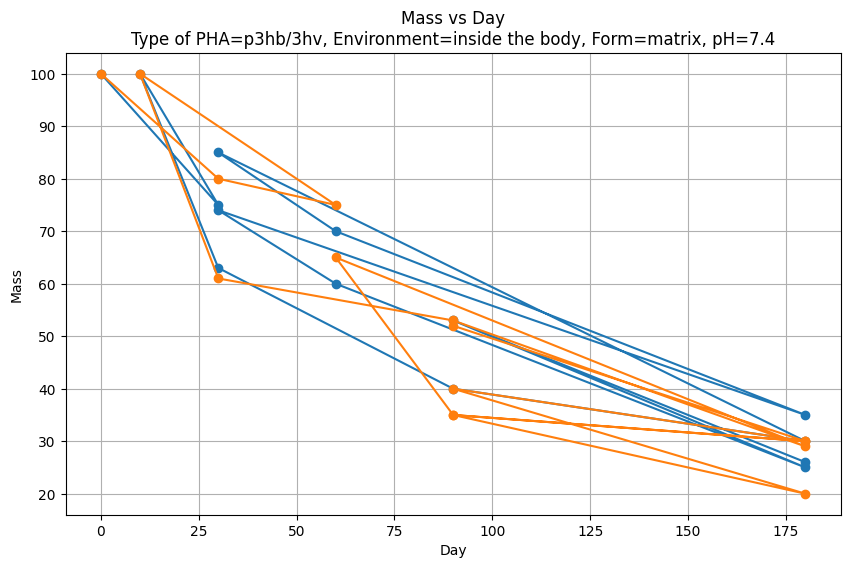

[0.0, 30.0, 90.0, 180.0] [100.0, 58.0, 46.0, 22.0]
[0.0, 60.0, 10.0, 30.0, 90.0, 180.0, 30.0, 60.0, 90.0, 180.0, 30.0, 90.0, 180.0, 30.0, 90.0, 180.0] [100.0, 65.0, 100.0, 57.99999999999999, 22.0, 20.0, 80.0, 50.0, 20.0, 10.0, 80.0, 30.0, 12.0, 75.0, 20.0, 10.0]


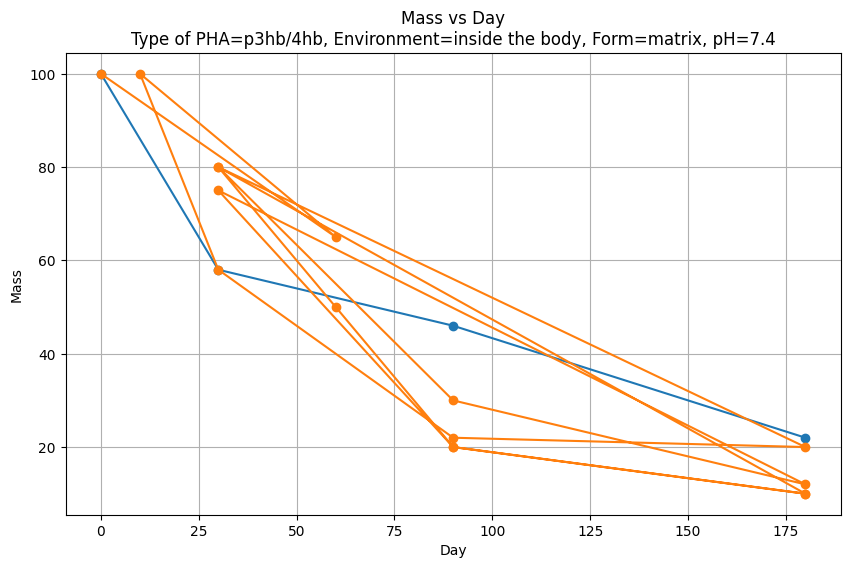

[0.0, 30.0, 10.0, 30.0, 90.0, 180.0, 30.0, 60.0, 90.0, 180.0, 60.0, 90.0, 180.0, 30.0, 90.0, 180.0, 90.0, 180.0] [100.0, 76.0, 100.0, 67.0, 29.0, 10.0, 80.0, 60.0, 33.0, 20.0, 55.0, 22.0, 5.0, 75.0, 33.0, 20.0, 54.0, 29.0]


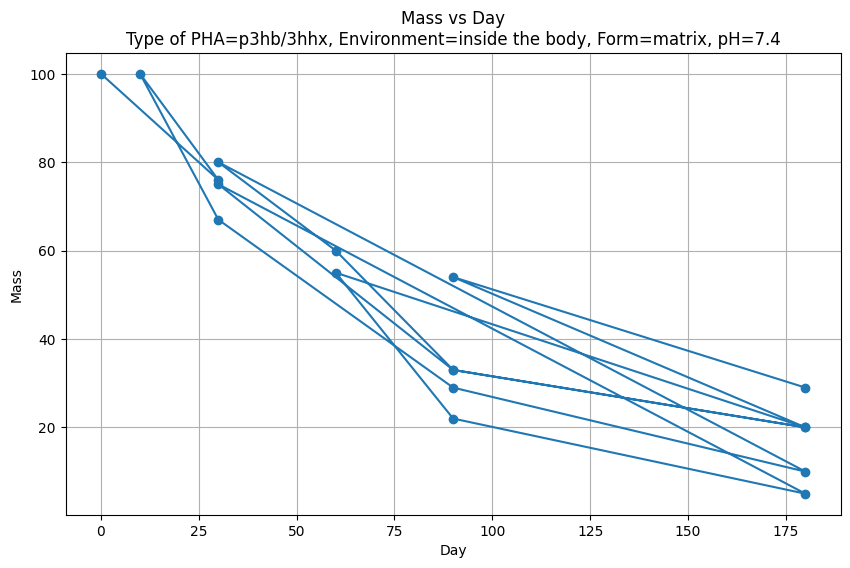

[98.0] [100.0]


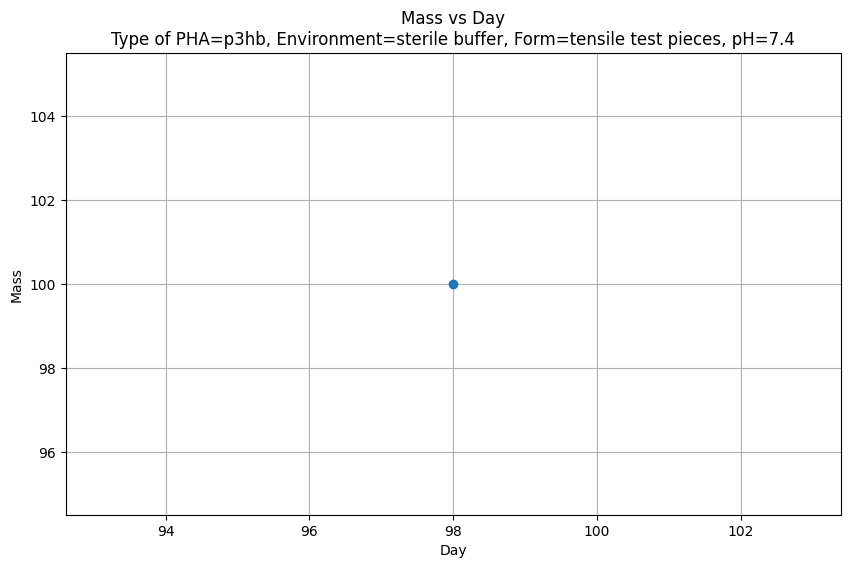

[98.0] [100.0]


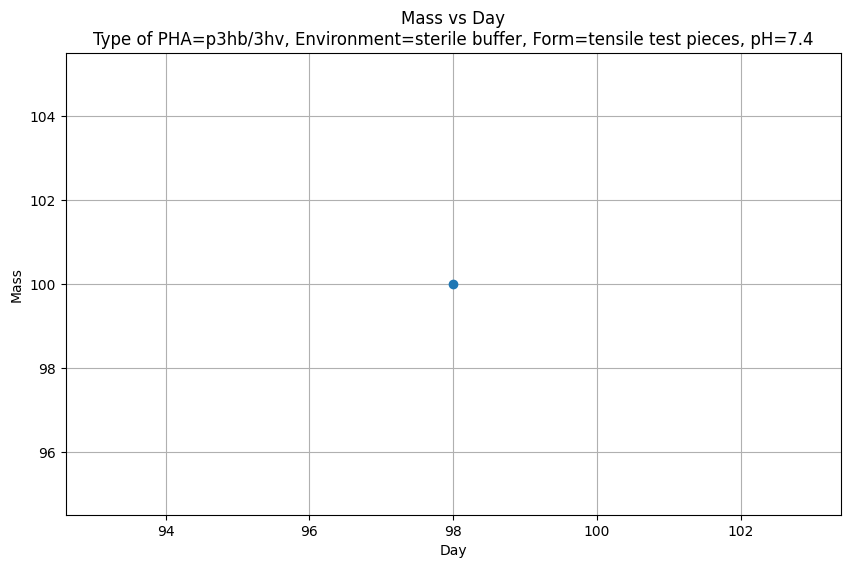

[40.0, 28.0] [97.0, 100.0]


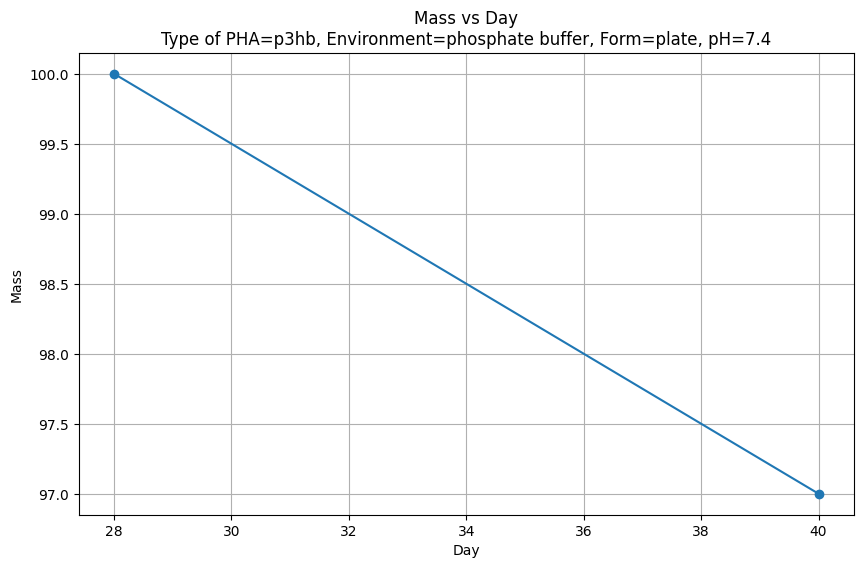

[28.0] [0.0]


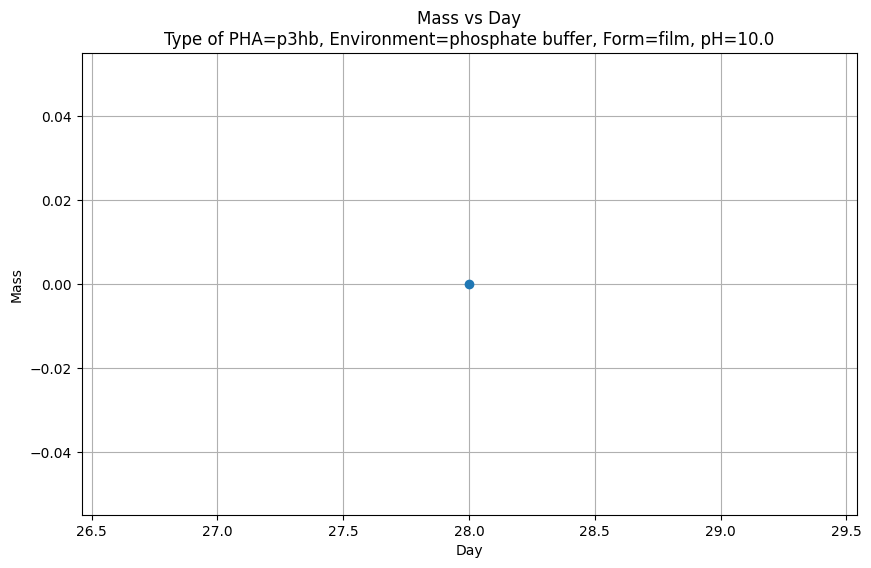

[19.0] [0.0]


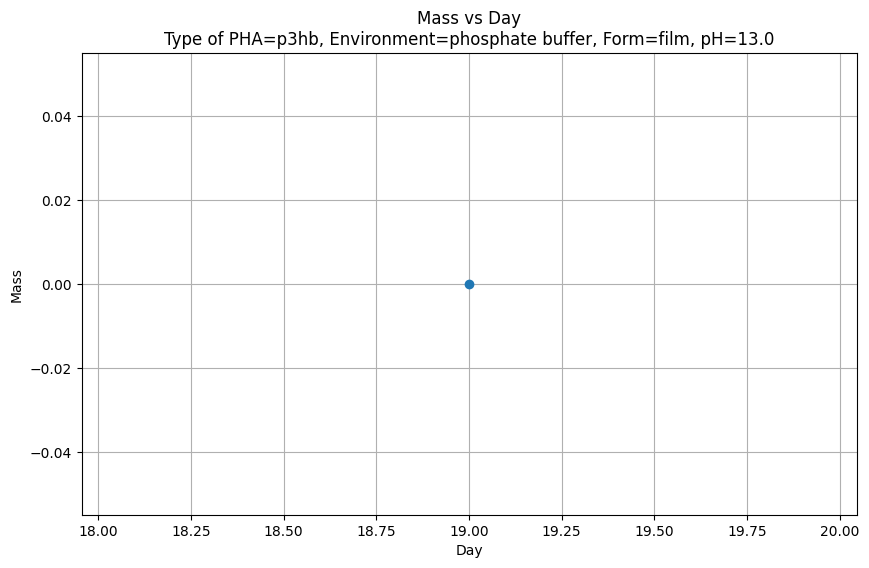

[150.0] [50.0]


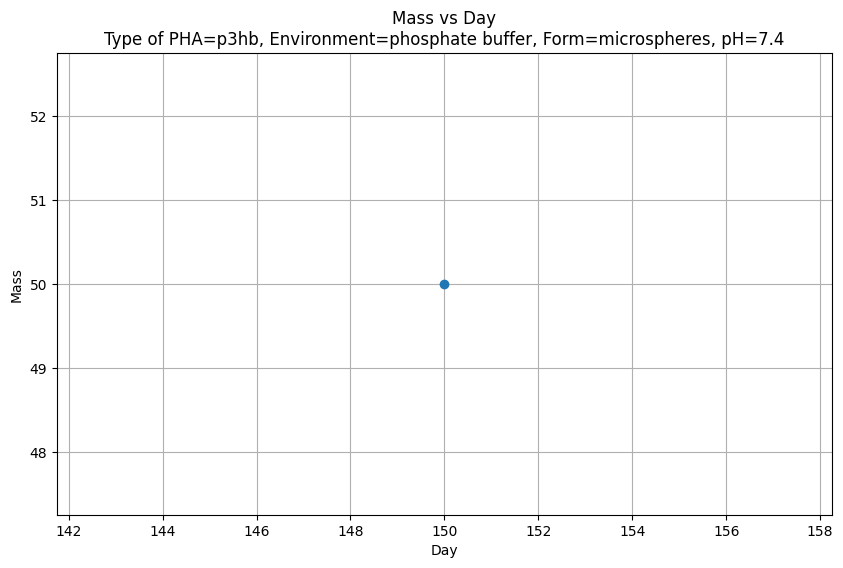

[84.0, 14.0, 28.0, 56.0] [59.97, 76.95, 80.02, 62.21]
[84.0, 14.0, 28.0, 56.0] [59.74, 93.35, 75.35, 56.18]


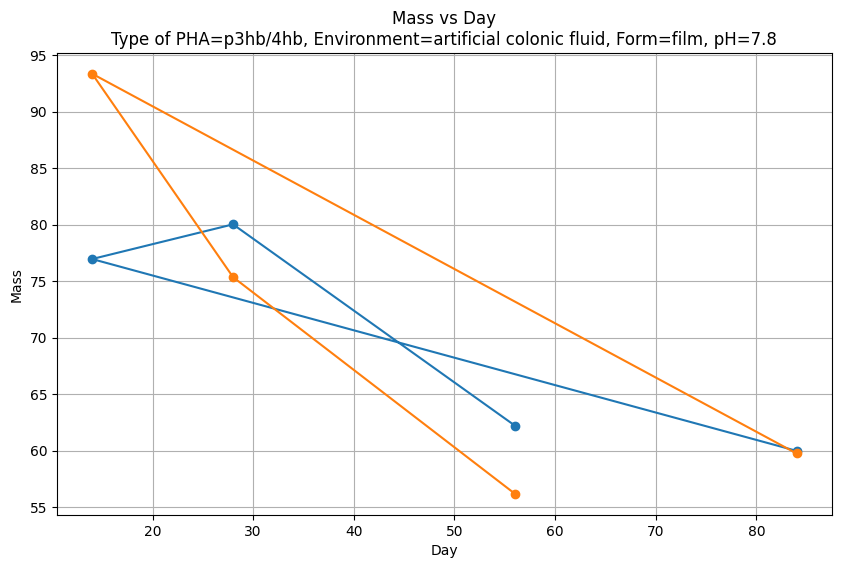

[14.0, 28.0, 56.0, 84.0] [66.24, 70.43, 36.66, 22.23]


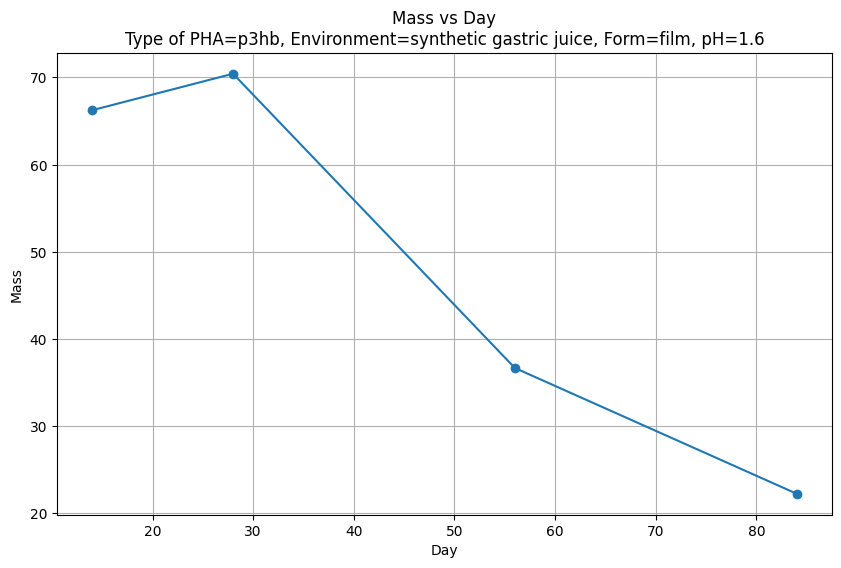

[14.0, 28.0, 56.0, 84.0] [69.73, 45.09, 39.93, 20.69]
[14.0, 28.0, 56.0, 84.0] [63.68, 39.27, 28.87, 18.89]


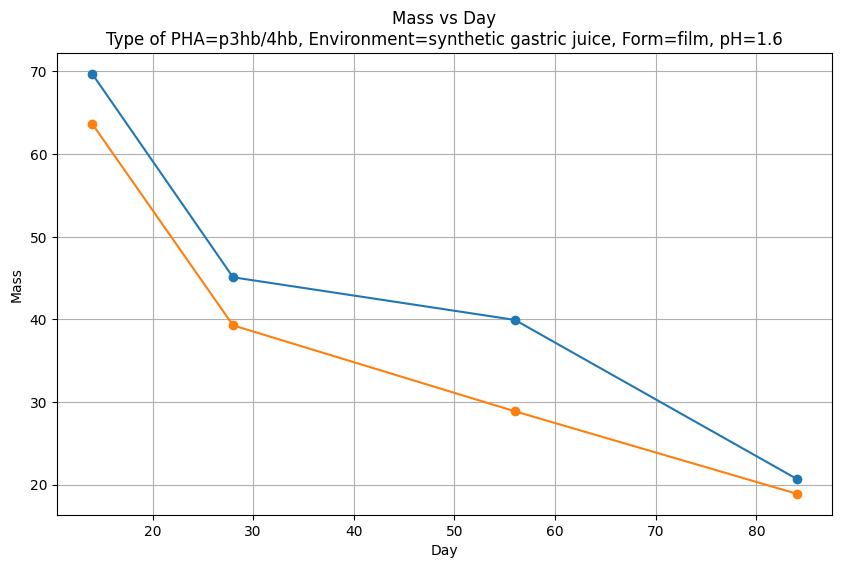

[14.0, 28.0, 56.0] [96.03, 74.06, 46.99]


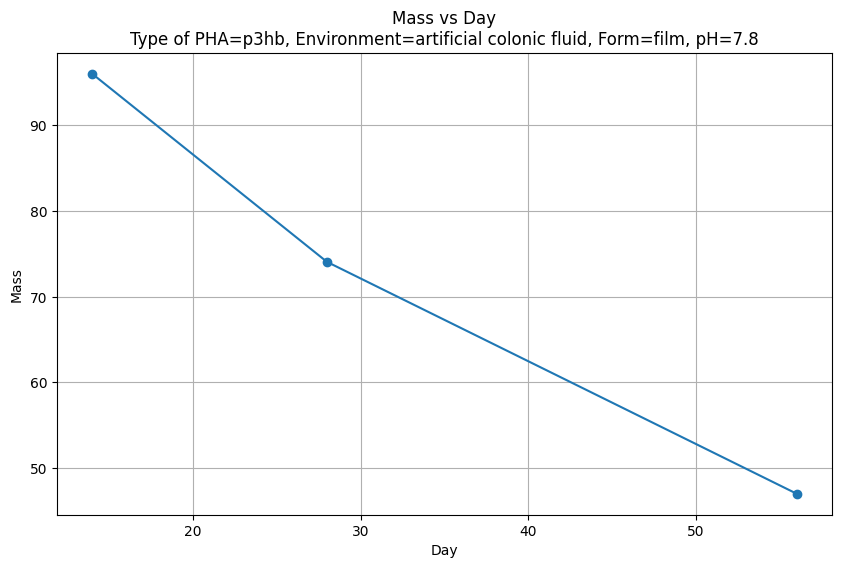

[0.0, 21.0, 40.0, 81.0] [100.0, 71.7, 59.4, 48.3]


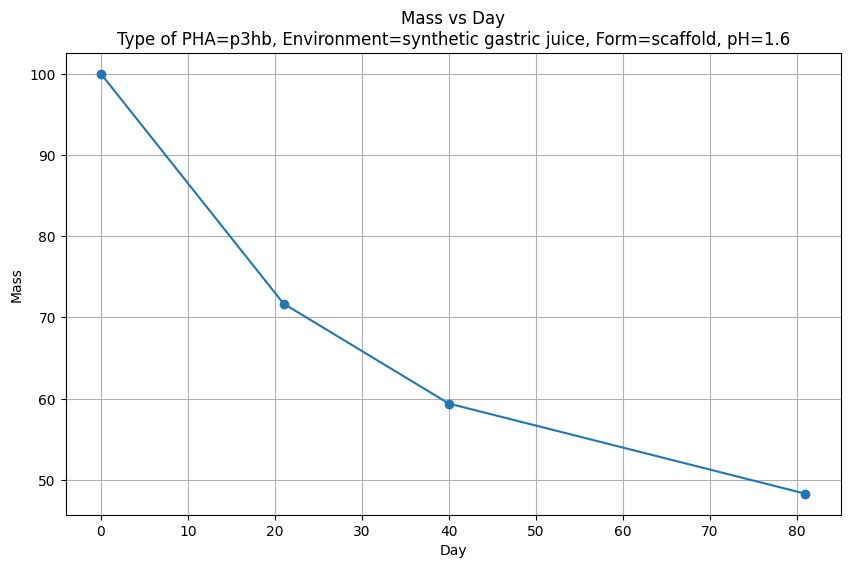

[0.0, 21.0, 40.0, 81.0] [100.0, 82.6, 72.4, 66.0]
[0.0, 21.0, 40.0, 81.0] [100.0, 87.6, 71.8, 62.9]


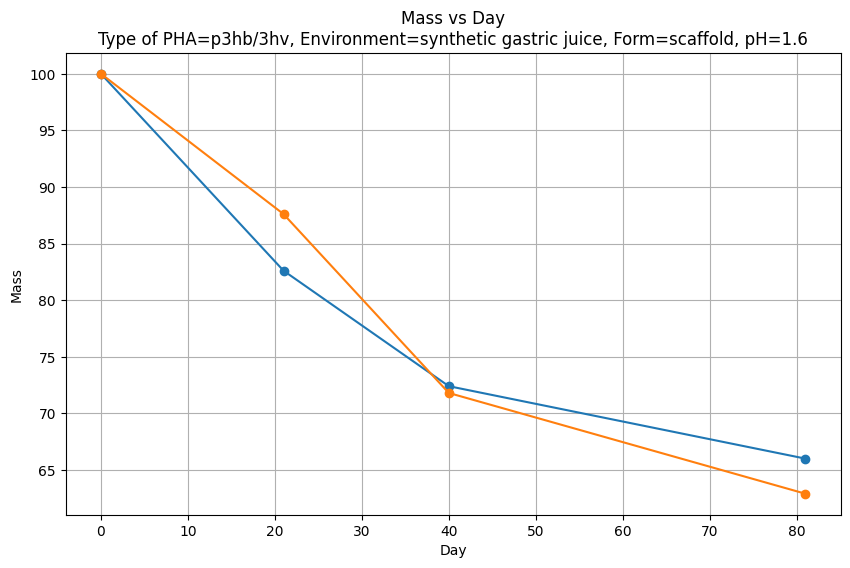

[0.0, 21.0, 40.0, 81.0] [100.0, 76.1, 67.3, 56.3]


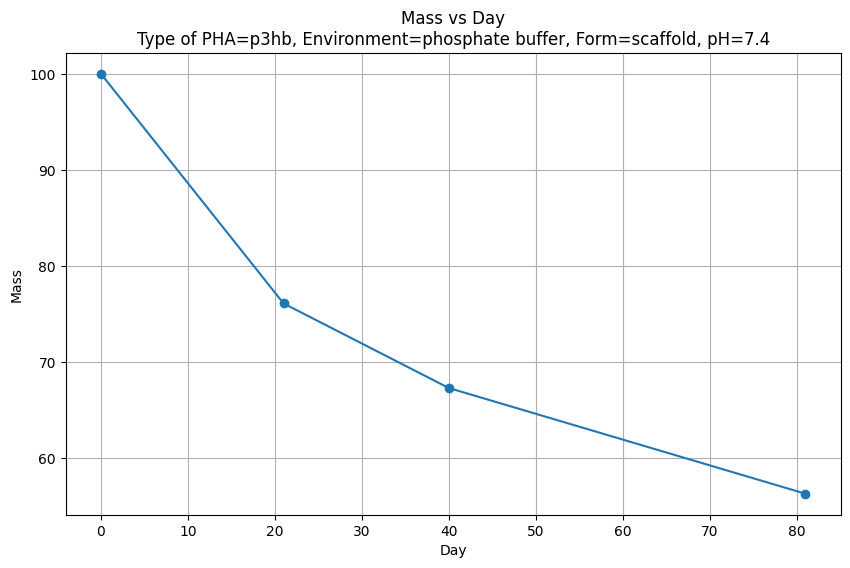

[0.0, 21.0, 40.0, 81.0] [100.0, 89.4, 76.2, 66.4]
[0.0, 21.0, 40.0, 81.0] [100.0, 90.9, 77.2, 65.6]


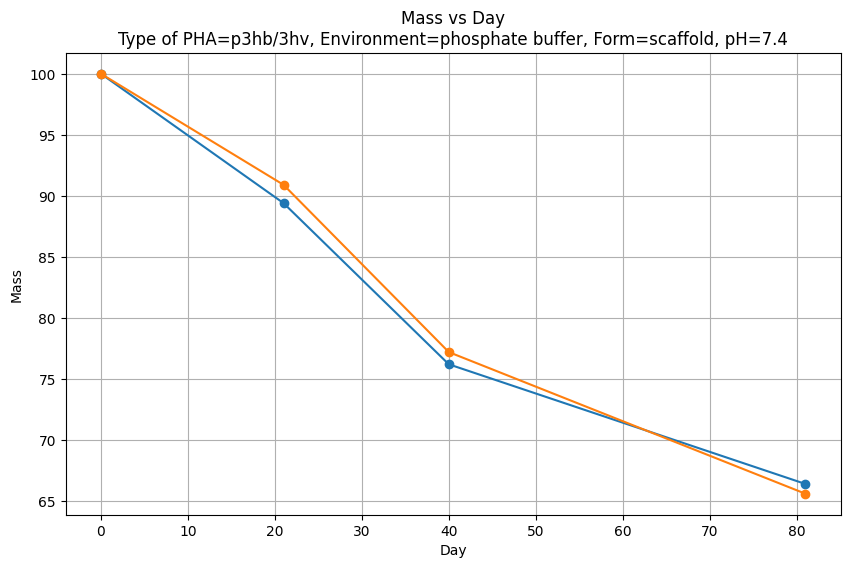

[180.0] [0.0]


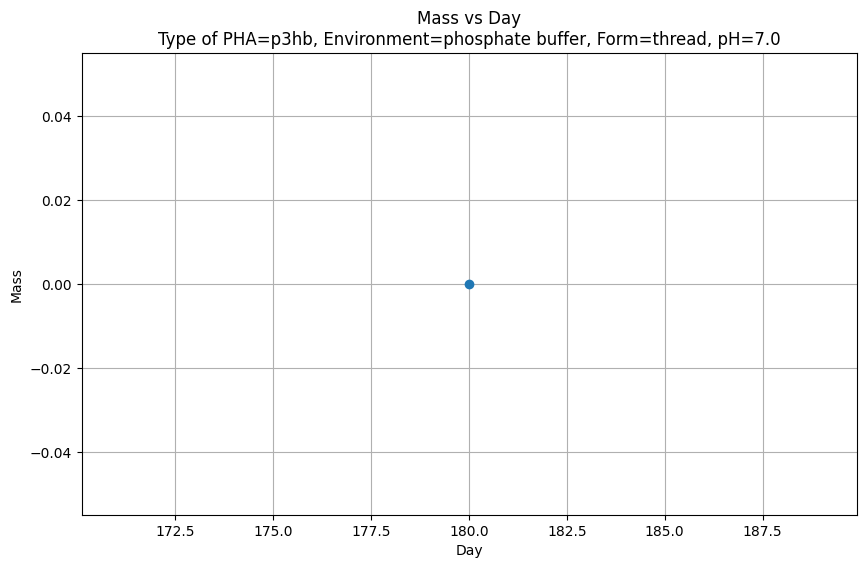

[182.0] [0.0]


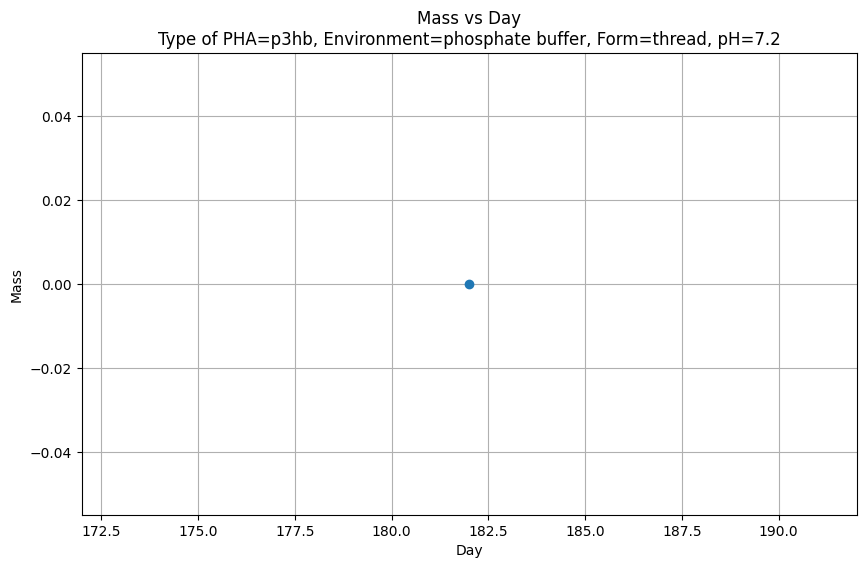

[180.0] [0.0]


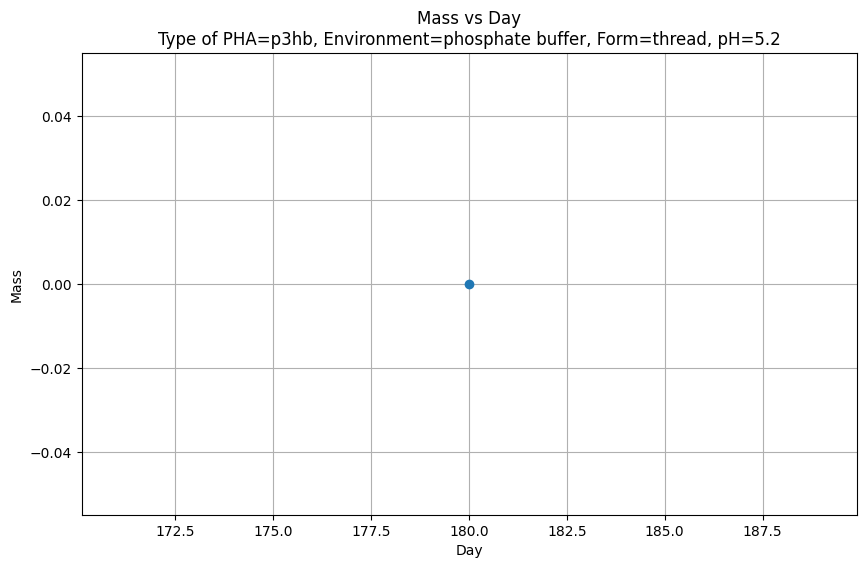

[28.0] [100.0]


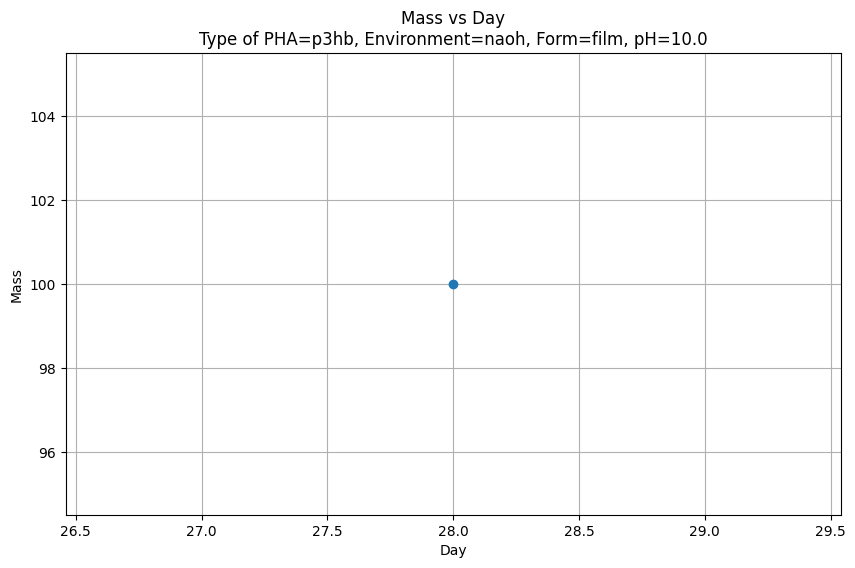

[19.0] [100.0]


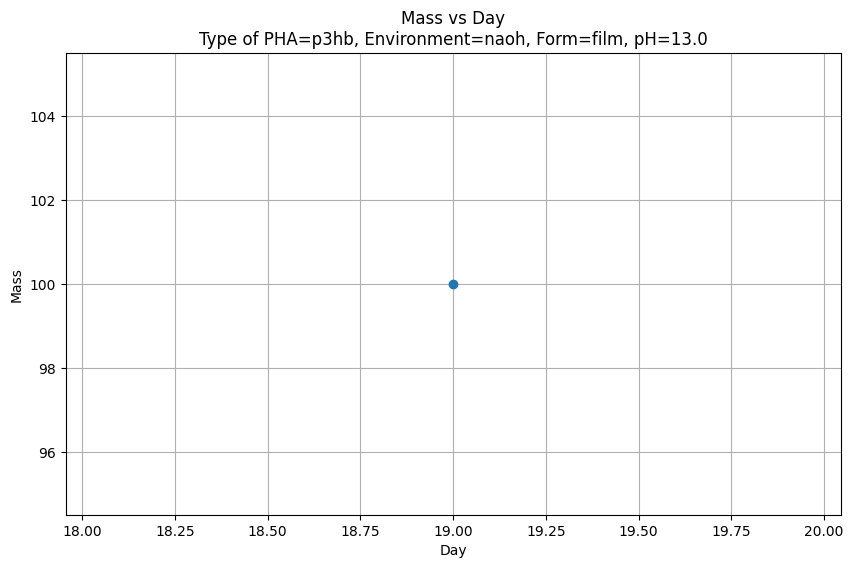

[6.5] [90.0]


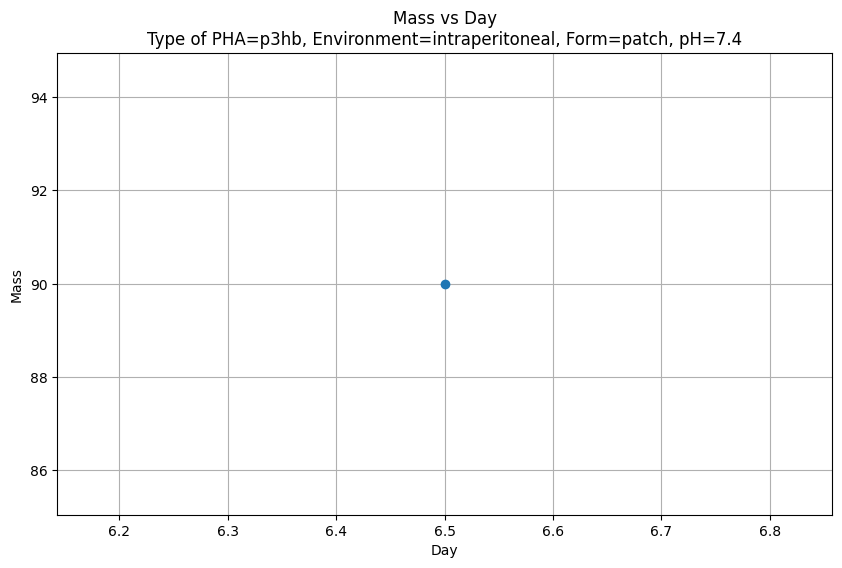

[6.5] [50.0]


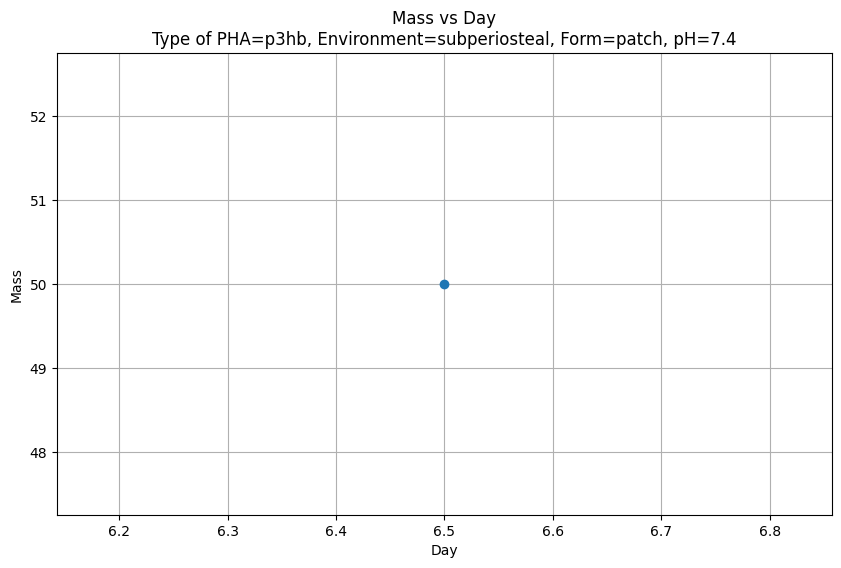

[25.0] [10.0]


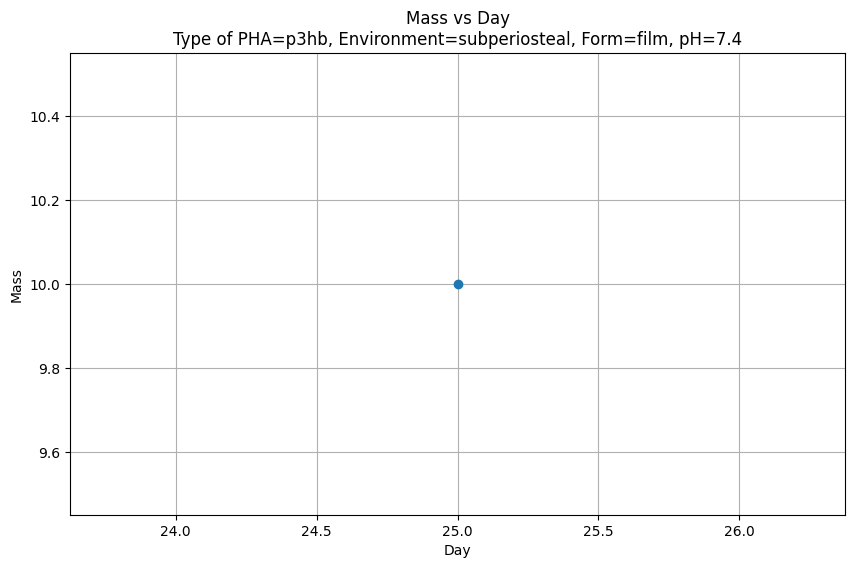

[25.0] [10.0]


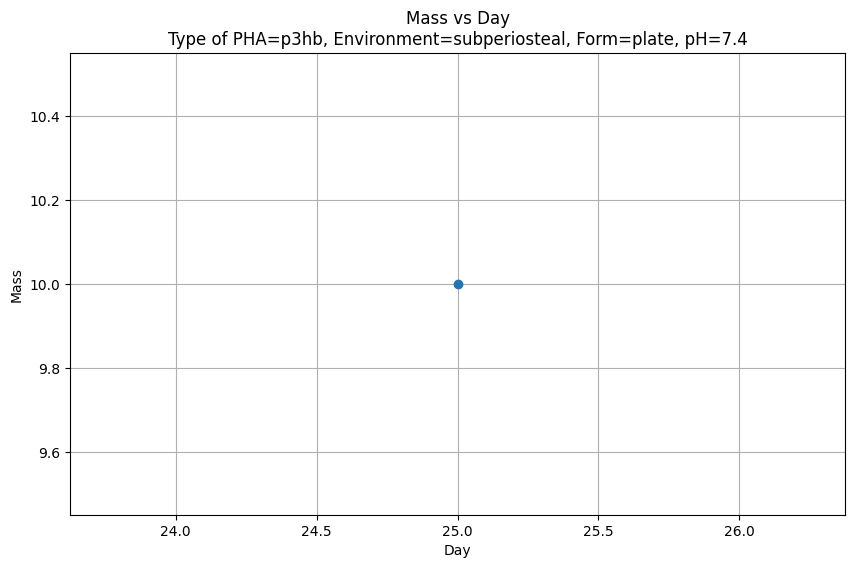

[12.0] [0.0]


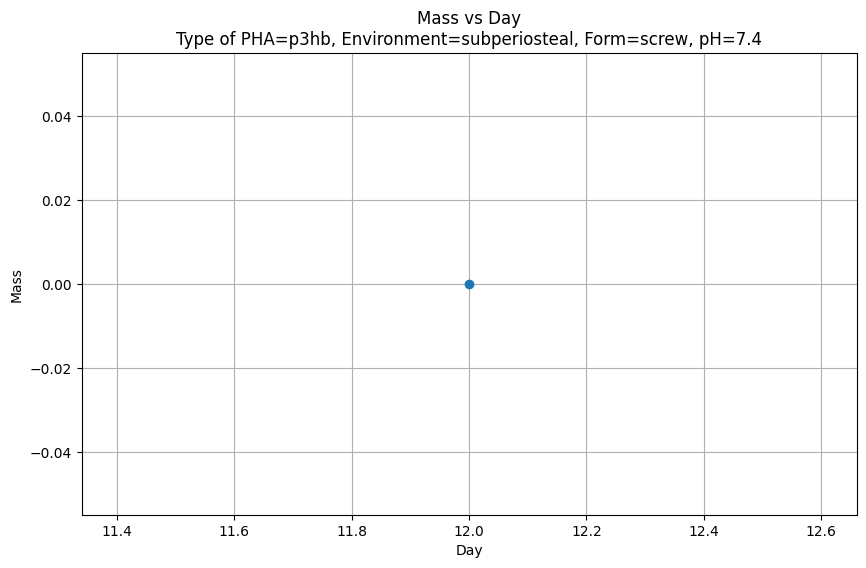

[1.0, 12.0] [0.0, 25.0]


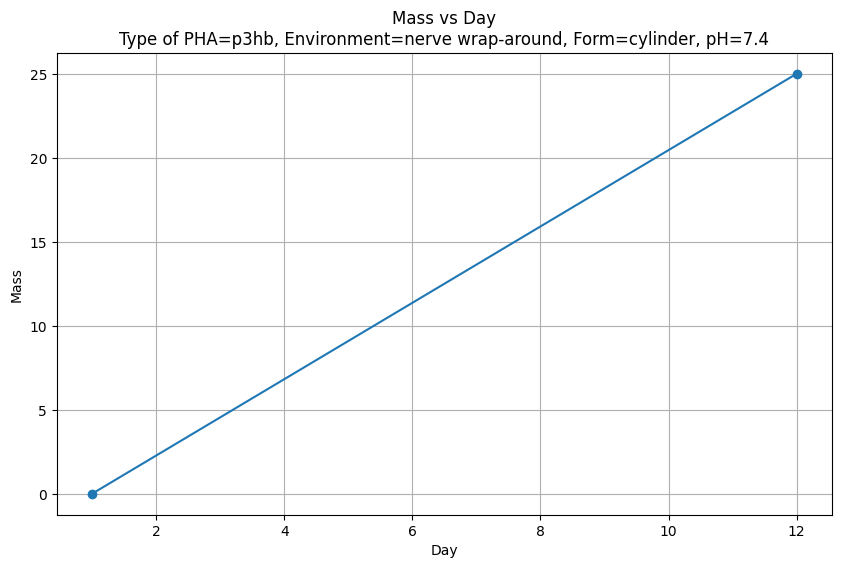

[6.0] [0.0]


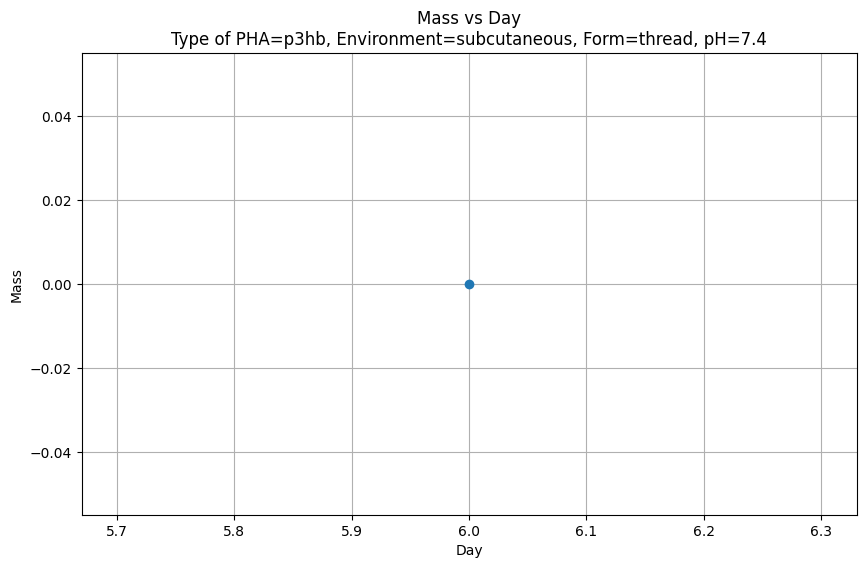

[2.0] [30.0]


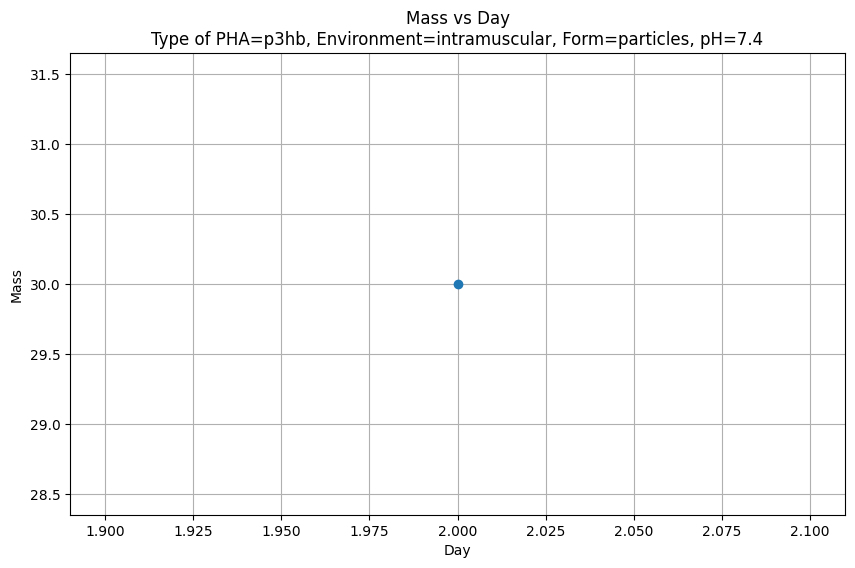

[2.0] [30.0]


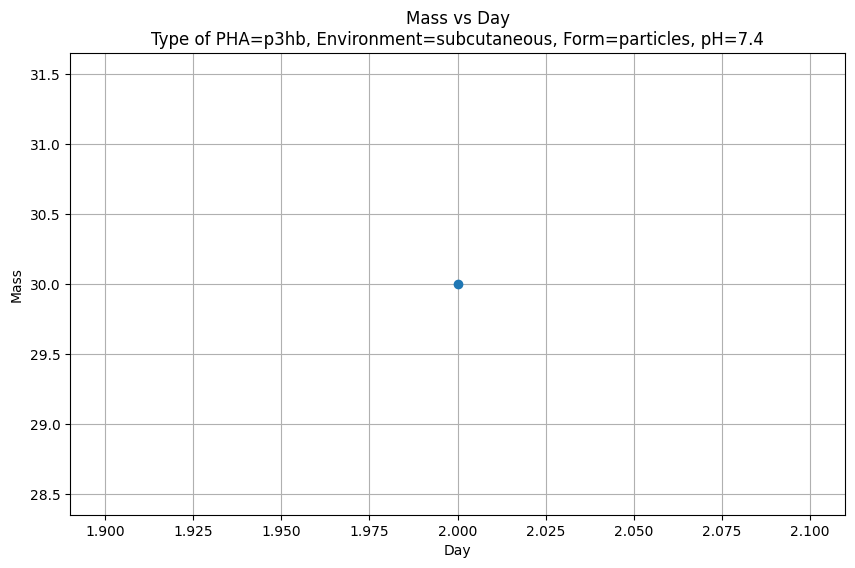

[24.0] [90.0]


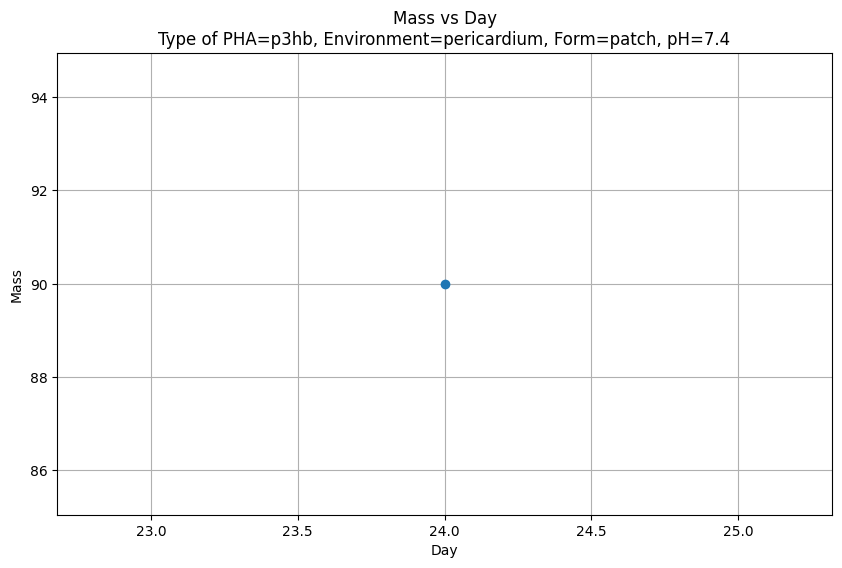

[12.0] [99.0]


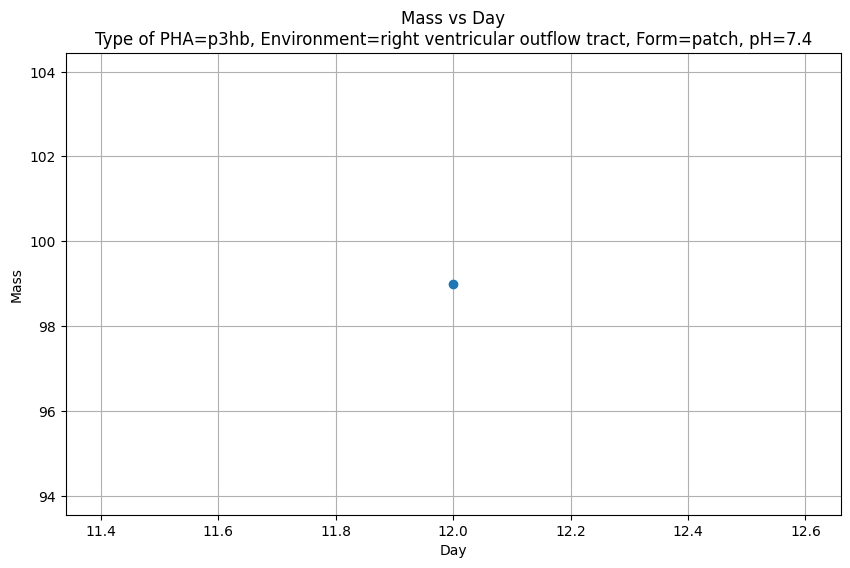

[12.0] [99.0]


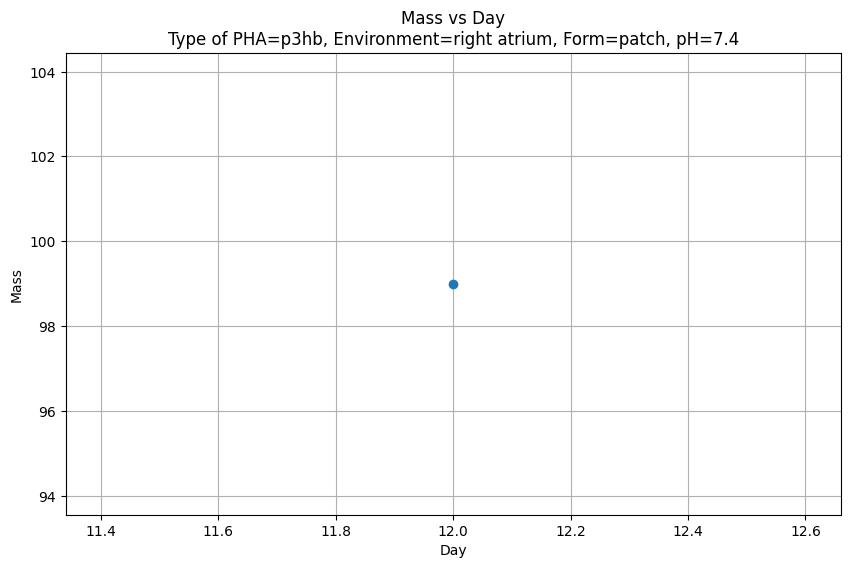

[2.0] [8.0]


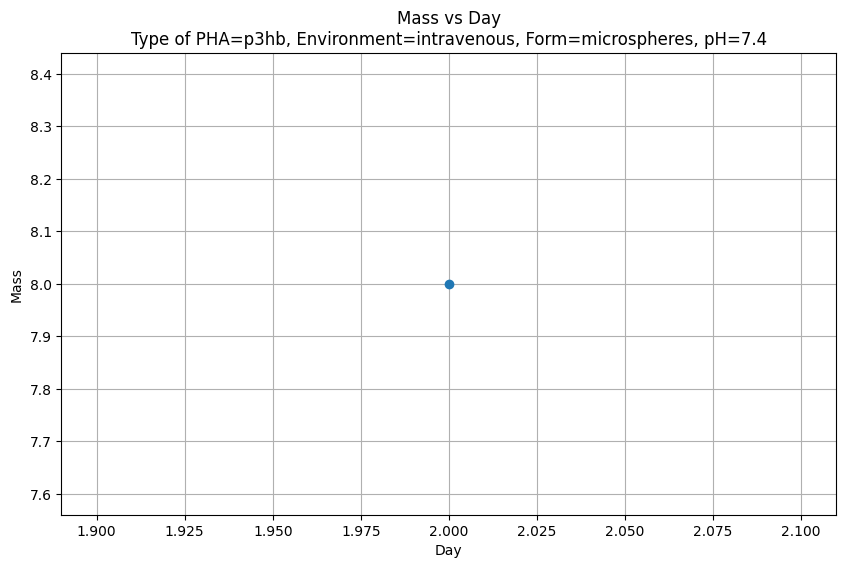

[6.0] [10.0]


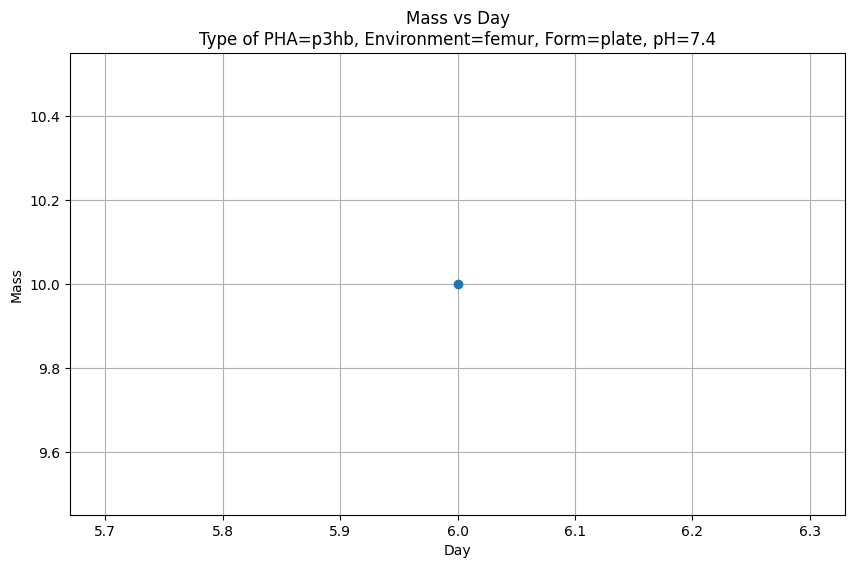

Нет групп для комбинации: type of pha='p3hb/3hhx', environment='inside the body', form='disc', ph=7.4
[0.0, 30.0, 90.0, 180.0] [100.0, 100.0, 99.0, 94.0]


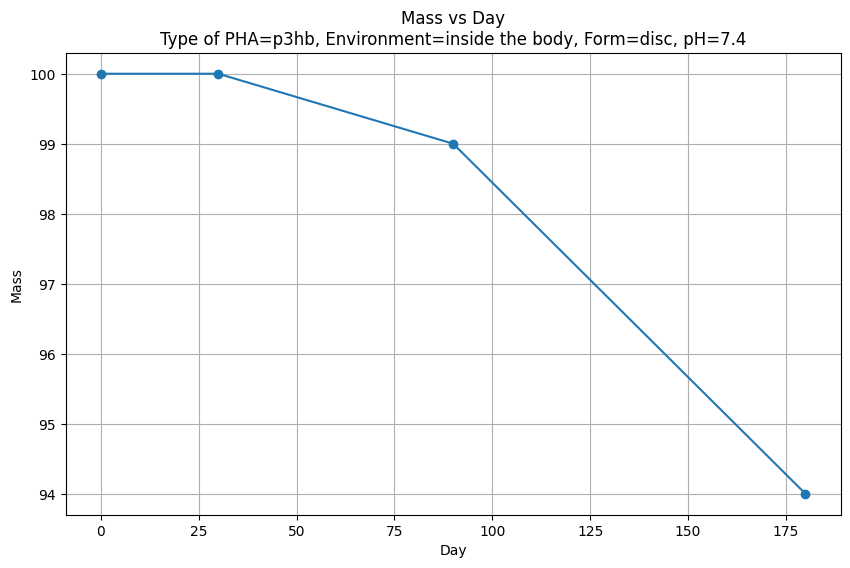

[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]
[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]


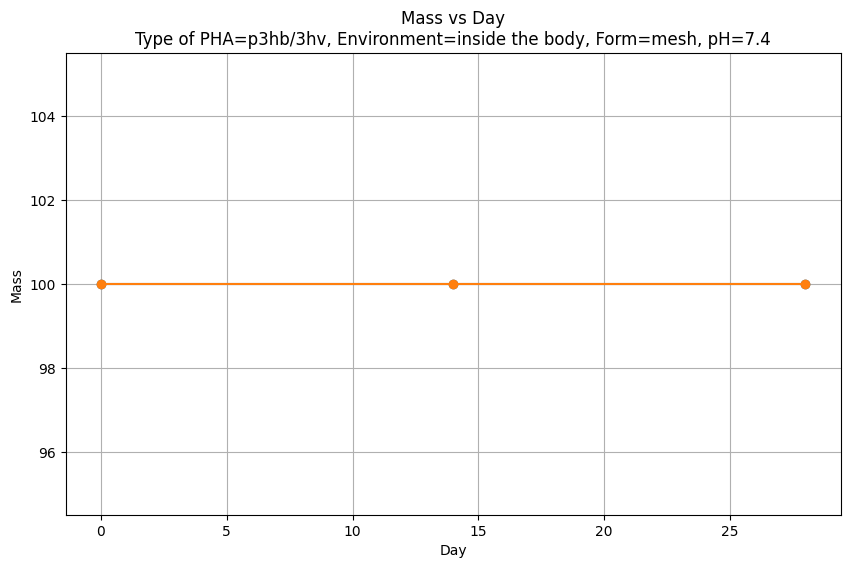

[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]


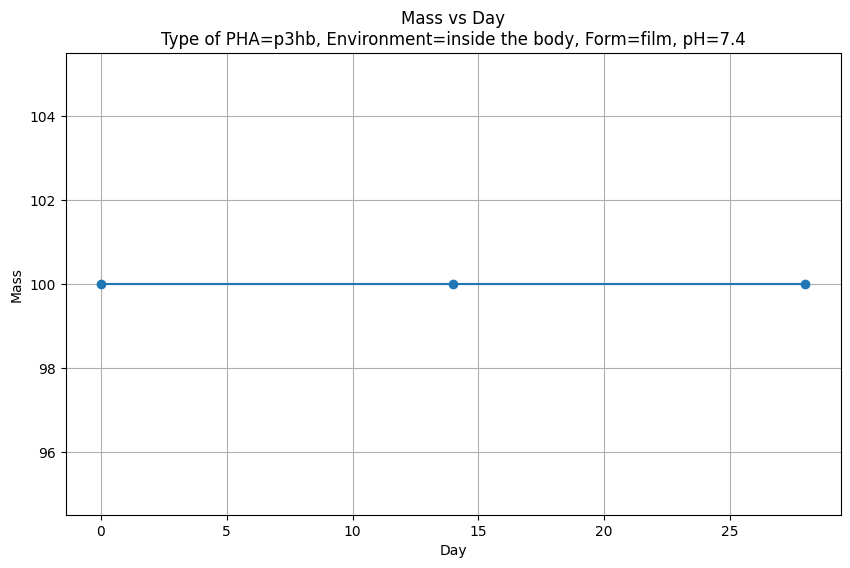

[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]
[0.0, 14.0, 28.0] [100.0, 100.0, 100.0]


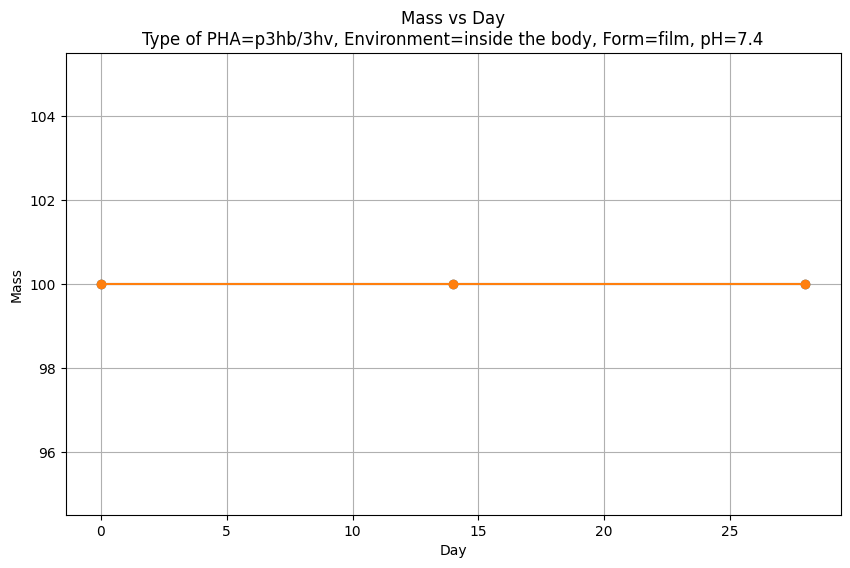

In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os

# Загрузка данных
df = pd.read_excel('cleaned_file_no_article_duplicates.xlsx')

# Проверка наличия всех необходимых столбцов
required_columns = ['type of pha', '% second component', 'day', 'environment', 'form',
                   'enzymatic', 'ph', 'in vivo', 'mass', 'porosity', 'dimensionality',
                   'article', 'environment_type', 'form_type']
if not all(col in df.columns for col in required_columns):
    raise ValueError("Файл не содержит всех необходимых столбцов")

# Проверка и преобразование столбца mass в float
if not pd.api.types.is_float_dtype(df['mass']):
    try:
        df['mass'] = df['mass'].astype(float)
    except ValueError:
        raise ValueError("Столбец 'mass' содержит значения, которые нельзя преобразовать в float")

# Создание директории для сохранения графиков
output_dir = 'plots'
os.makedirs(output_dir, exist_ok=True)

# Получение уникальных комбинаций type of pha, environment, form и ph
combinations = df[['type of pha', 'environment', 'form', 'ph']].drop_duplicates().reset_index(drop=True)

# Список столбцов для группировки (все, кроме 'mass', 'day' и 'article')
group_cols = [col for col in required_columns if col not in ['mass', 'day', 'article']]

# Проход по всем комбинациям
for _, comb in combinations.iterrows():
    type_of_pha = comb['type of pha']
    environment = comb['environment']
    form = comb['form']
    ph = comb['ph']

    # Фильтрация данных по текущей комбинации
    filtered_df = df[
        (df['type of pha'] == type_of_pha) &
        (df['environment'] == environment) &
        (df['form'] == form) &
        (df['ph'] == ph)
    ]

    if filtered_df.empty:
        print(f"Нет данных для комбинации: type of pha='{type_of_pha}', environment='{environment}', form='{form}', ph={ph}")
        continue

    # Группировка данных
    grouped = filtered_df.groupby(group_cols).agg({
        'day': list,
        'mass': list
    }).reset_index()

    if grouped.empty:
        print(f"Нет групп для комбинации: type of pha='{type_of_pha}', environment='{environment}', form='{form}', ph={ph}")
        continue



    # Построение графика
    plt.figure(figsize=(10, 6))

    for idx, row in grouped.iterrows():
        days = row['day']
        masses = row['mass']
        print(days, masses)

        # Формируем метку для легенды
        group_label = ', '.join([f"{col}={row[col]}" for col in group_cols if col not in ['type of pha', 'environment', 'form', 'ph']])
        if not group_label:
            group_label = f"Group {idx + 1}"

        # Строим линию для группы
        plt.plot(days, masses, marker='o', linestyle='-', label=group_label)

    # Настройка графика
    plt.xlabel('Day')
    plt.ylabel('Mass')
    plt.title(f'Mass vs Day\nType of PHA={type_of_pha}, Environment={environment}, Form={form}, pH={ph}')
    plt.grid(True)

    # Сохранение графика
    plt.show()

In [ ]:
import pandas as pd
import numpy as np

# Загрузка Excel файла
df = pd.read_excel('/content/cleaned_file_no_article_duplicates.xlsx')

# Проверка наличия всех необходимых столбцов
required_columns = ['type of pha', '% second component', 'day', 'environment', 'form',
                   'enzymatic', 'ph', 'in vivo', 'mass', 'porosity', 'dimensionality',
                   'article', 'environment_type', 'form_type']
if not all(col in df.columns for col in required_columns):
    raise ValueError("Файл не содержит всех необходимых столбцов")

# Проверка и преобразование столбца mass в float
if not pd.api.types.is_float_dtype(df['mass']):
    try:
        df['mass'] = df['mass'].astype(float)
    except ValueError:
        raise ValueError("Столбец 'mass' содержит значения, которые нельзя преобразовать в float")

# Список столбцов для сравнения (все, кроме 'mass' и 'article')
cols_no_mass_article = [col for col in required_columns if col not in ['mass', 'article']]

# Погрешность для сравнения float
epsilon = 1e-6

# Функция для сравнения значений mass с учетом погрешности
def are_mass_different(mass1, mass2):
    # Если оба NaN, считаем их одинаковыми
    if pd.isna(mass1) and pd.isna(mass2):
        return False
    # Если один NaN, а другой нет, считаем разными
    if pd.isna(mass1) != pd.isna(mass2):
        return True
    # Сравниваем с погрешностью
    return abs(mass1 - mass2) > epsilon

# Поиск пар строк, где совпадают все значения, кроме 'mass' и 'article'
pairs = []
row_indices = set()  # Множество индексов строк, участвующих в парах
for i in range(len(df)):
    for j in range(i + 1, len(df)):
        if df.loc[i, cols_no_mass_article].equals(df.loc[j, cols_no_mass_article]):
            # Проверяем, что 'mass' или 'article' различаются
            mass_differs = are_mass_different(df.loc[i, 'mass'], df.loc[j, 'mass'])
            article_differs = df.loc[i, 'article'] != df.loc[j, 'article']
            if mass_differs or article_differs:
                pairs.append((i, j))
                row_indices.add(i)
                row_indices.add(j)

# Подсчет количества каждого значения article среди строк, участвующих в парах
if row_indices:
    articles_counts = df.loc[list(row_indices), 'article'].value_counts()
    print("\nКоличество каждого значения article в совпадающих строках:")
    for article, count in articles_counts.items():
        print(f"Article {article}: {count} строк")
    print(f"\nВсего уникальных значений article: {len(articles_counts)}")
else:
    print("\nНет строк, участвующих в парах, для подсчета article")

# Сохранение результатов в Excel
if pairs:
    result = []
    for idx1, idx2 in pairs:
        mass_diff = (df.loc[idx1, 'mass'] - df.loc[idx2, 'mass']
                     if not (pd.isna(df.loc[idx1, 'mass']) or pd.isna(df.loc[idx2, 'mass']))
                     else np.nan)
        result.append({
            'row1_index': idx1,
            'row2_index': idx2,
            'mass_difference': mass_diff,
            **{f'row1_{k}': v for k, v in df.loc[idx1].to_dict().items()},
            **{f'row2_{k}': v for k, v in df.loc[idx2].to_dict().items()}
        })
    result_df = pd.DataFrame(result)
    result_df.to_excel('mass_article_pairs.xlsx', index=False)
    print("\nРезультаты пар сохранены в 'mass_article_pairs.xlsx'")


Количество каждого значения article в совпадающих строках:
Article 16: 43 строк
Article 10: 22 строк
Article 5: 2 строк
Article 6: 2 строк
Article 15: 2 строк

Всего уникальных значений article: 5

Результаты пар сохранены в 'mass_article_pairs.xlsx'


In [ ]:
import pandas as pd
import numpy as np

# Загрузка Excel файла
df = pd.read_excel('cleaned_file_no_article_duplicates.xlsx')

# Проверка наличия всех необходимых столбцов
required_columns = ['type of pha', '% second component', 'day', 'environment', 'form',
                   'enzymatic', 'ph', 'in vivo', 'mass', 'porosity', 'dimensionality',
                   'article', 'environment_type', 'form_type']
if not all(col in df.columns for col in required_columns):
    raise ValueError("Файл не содержит всех необходимых столбцов")

# Проверка и преобразование столбца mass в float
if not pd.api.types.is_float_dtype(df['mass']):
    try:
        df['mass'] = df['mass'].astype(float)
    except ValueError:
        raise ValueError("Столбец 'mass' содержит значения, которые нельзя преобразовать в float")

# Список столбцов для сравнения (все, кроме 'mass' и 'article')
cols_no_mass_article = [col for col in required_columns if col not in ['mass', 'article']]

# Погрешность для сравнения float
epsilon = 1e-6

# Функция для сравнения значений mass с учетом погрешности
def are_mass_different(mass1, mass2):
    # Если оба NaN, считаем их одинаковыми
    if pd.isna(mass1) and pd.isna(mass2):
        return False
    # Если один NaN, а другой нет, считаем разными
    if pd.isna(mass1) != pd.isna(mass2):
        return True
    # Сравниваем с погрешностью
    return abs(mass1 - mass2) > epsilon

# Поиск пар строк, где совпадают все значения, кроме 'mass' и 'article'
pairs = []
indices_to_remove = set()  # Множество индексов строк для удаления
for i in range(len(df)):
    for j in range(i + 1, len(df)):
        if df.loc[i, cols_no_mass_article].equals(df.loc[j, cols_no_mass_article]):
            # Проверяем, что 'mass' или 'article' различаются
            mass_differs = are_mass_different(df.loc[i, 'mass'], df.loc[j, 'mass'])
            article_differs = df.loc[i, 'article'] != df.loc[j, 'article']
            if mass_differs or article_differs:
                pairs.append((i, j))
                # Добавляем строку с большим индексом для удаления
                indices_to_remove.add(j)

# Вывод найденных пар
if pairs:
    print("Найдены пары строк, где совпадают все значения, кроме 'mass' и 'article':")
    for idx1, idx2 in pairs:
        print(f"\nПара строк (индексы {idx1}, {idx2}):")
        print("Строка 1:")
        print(df.loc[idx1].to_dict())
        print("Строка 2 (будет удалена, если индекс больше):")
        print(df.loc[idx2].to_dict())
else:
    print("Таких пар не найдено")

# Удаление строк с большими индексами
if indices_to_remove:
    df_cleaned = df.drop(list(indices_to_remove)).reset_index(drop=True)
    print(f"\nУдалено {len(indices_to_remove)} строк с большими индексами")
else:
    df_cleaned = df.copy()
    print("\nНечего удалять")

# Сохранение результата в новый Excel файл
output_file = 'cleaned_file_no_mass_article_duplicates.xlsx'
df_cleaned.to_excel(output_file, index=False)
print(f"Обновленный файл сохранен как '{output_file}'")

Найдены пары строк, где совпадают все значения, кроме 'mass' и 'article':

Пара строк (индексы 137, 239):
Строка 1:
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 30.0, 'environment': 'inside the body', 'form': 'matrix', 'enzymatic': 'Yes', 'ph': 7.4, 'in vivo': 1, 'mass': 100.0, 'porosity': 0, 'dimensionality': '2D', 'article': 10, 'environment_type': 'in vivo (unspecified)', 'form_type': 'film'}
Строка 2 (будет удалена, если индекс больше):
{'type of pha': 'p3hb', '% second component': 0.0, 'day': 30.0, 'environment': 'inside the body', 'form': 'matrix', 'enzymatic': 'Yes', 'ph': 7.4, 'in vivo': 1, 'mass': 95.0, 'porosity': 0, 'dimensionality': '2D', 'article': 15, 'environment_type': 'in vivo (unspecified)', 'form_type': 'film'}

Пара строк (индексы 138, 157):
Строка 1:
{'type of pha': 'p3hb/3hv', '% second component': 27.6, 'day': 30.0, 'environment': 'inside the body', 'form': 'matrix', 'enzymatic': 'Yes', 'ph': 7.4, 'in vivo': 1, 'mass': 80.0, 'porosity': 0, 'dimension

Saved plot: plots/ph_distribution.png


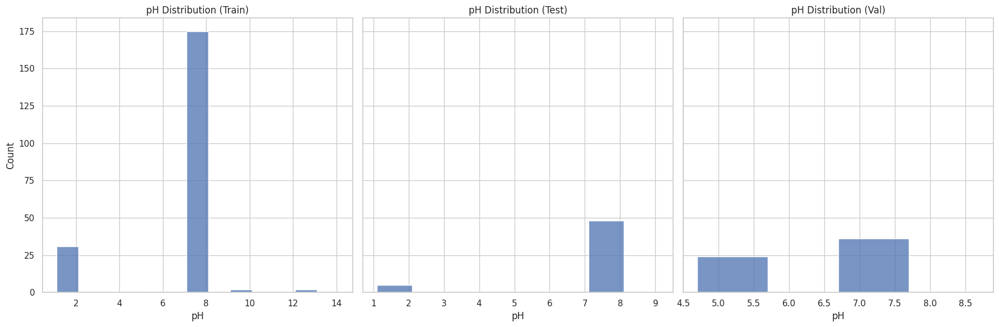

Saved plot: plots/environment_pha_distribution.png


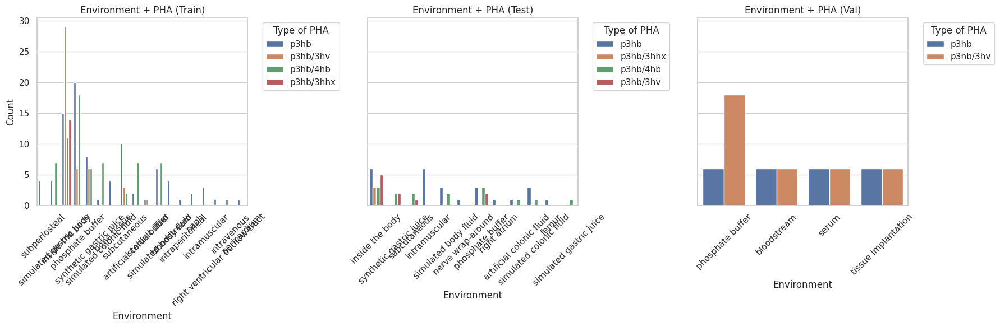

Saved plot: plots/pha_form_distribution.png


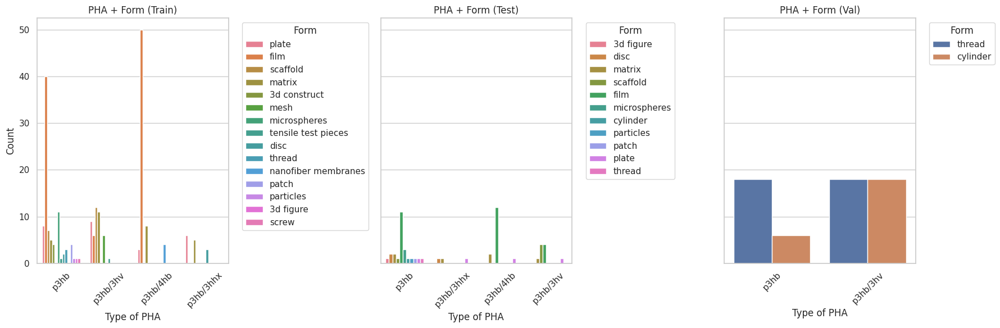

Saved plot: plots/environment_type_pha_distribution.png


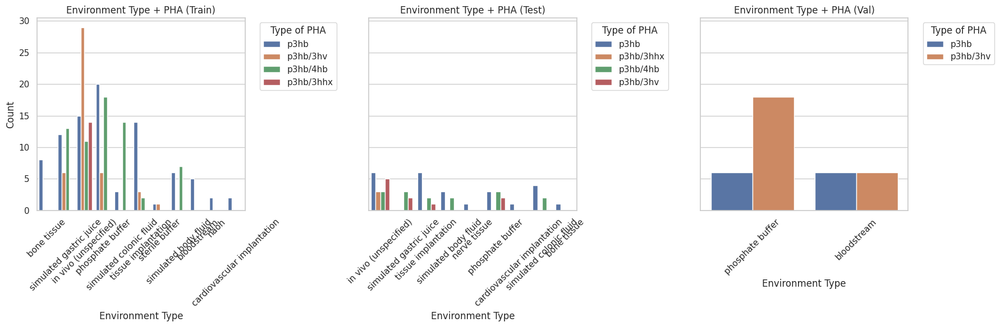

Saved plot: plots/form_type_pha_distribution.png


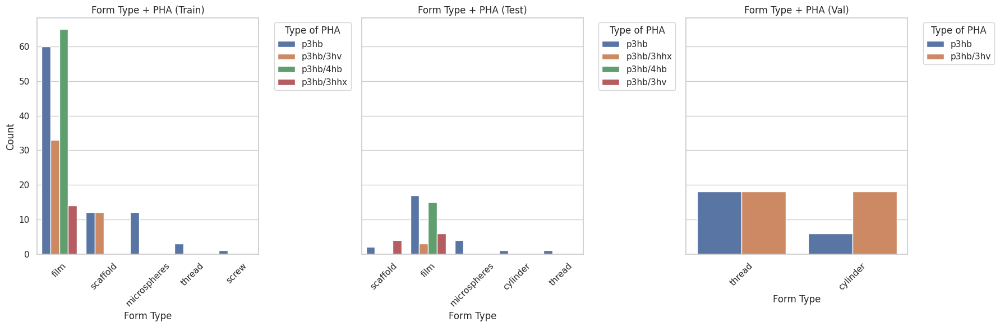

Saved plot: plots/env_pha_form_distribution.png


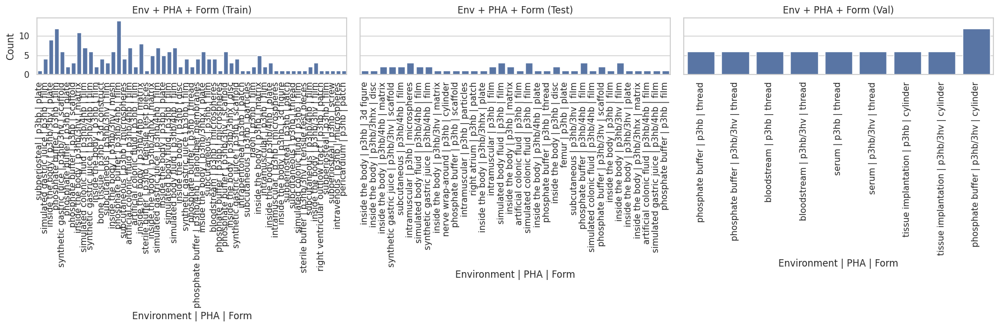

Saved plot: plots/env_type_pha_form_type_distribution.png


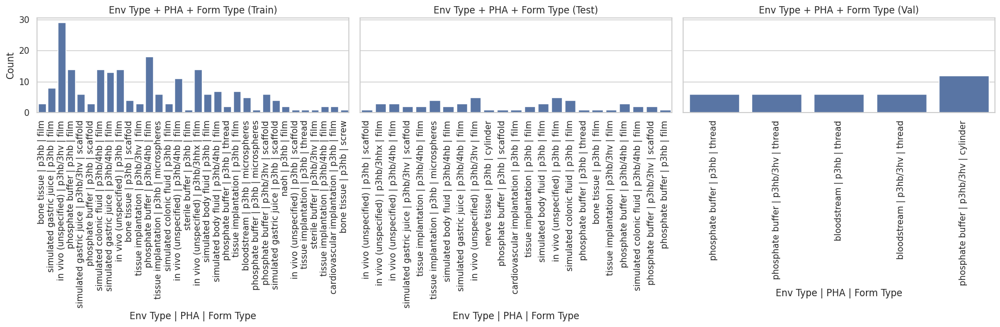

Saved plot: plots/mass_vs_day_by_environment.png


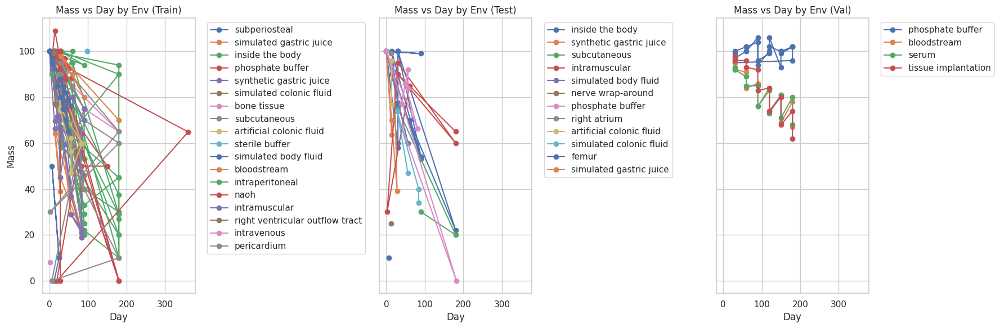

Saved plot: plots/mass_vs_day_by_environment_type.png


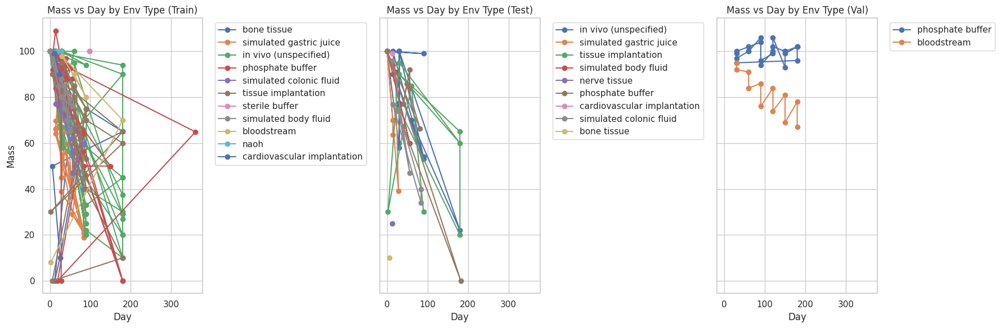

Saved plot: plots/mass_vs_day_by_pha.png


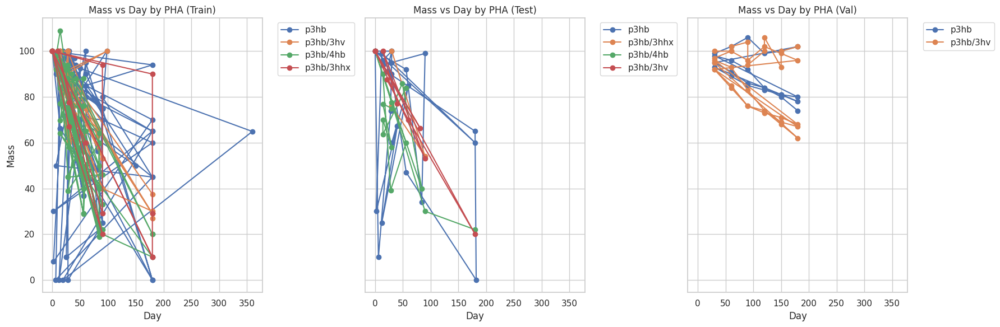

Saved plot: plots/mass_vs_day_by_form_pha.png


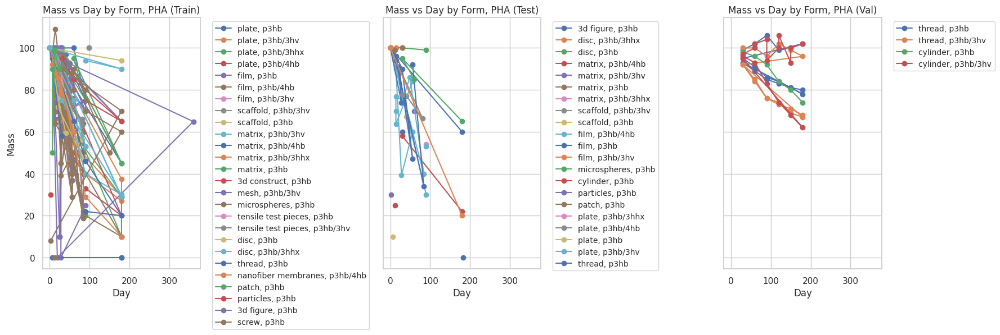

Saved plot: plots/mass_vs_day_by_form_type_pha.png


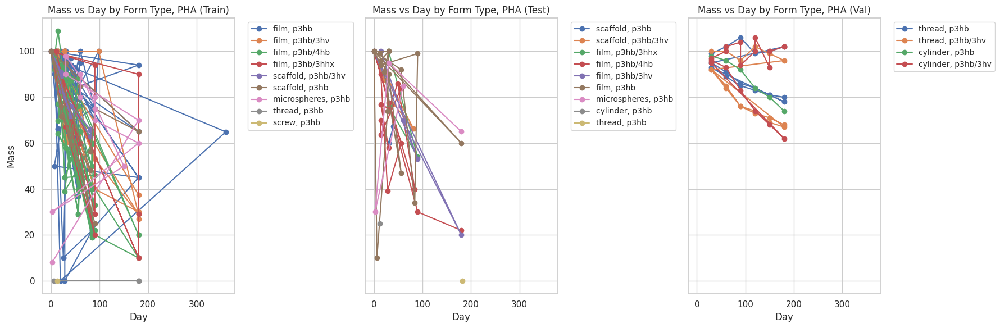

Saved plot: plots/mass_vs_day_by_env_type_pha.png


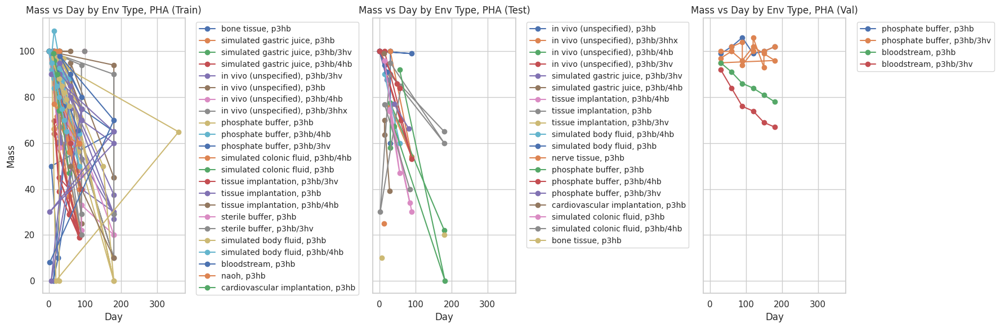

Saved plot: plots/mass_vs_day_by_env_pha.png


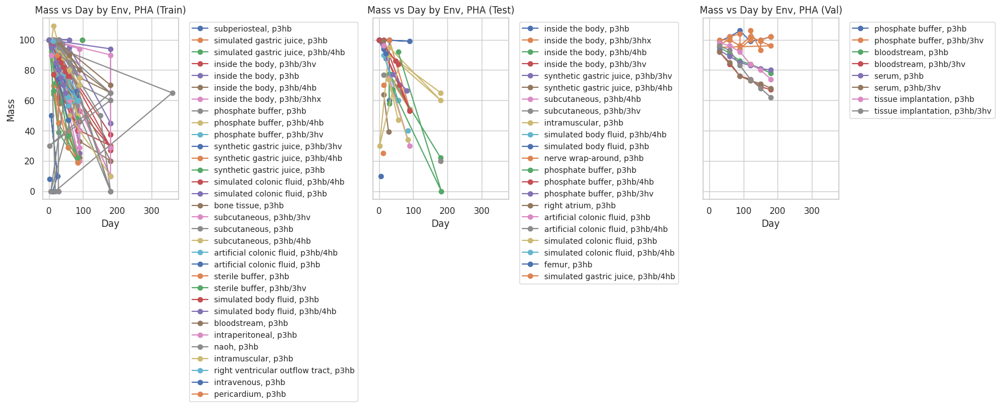

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_nan.png


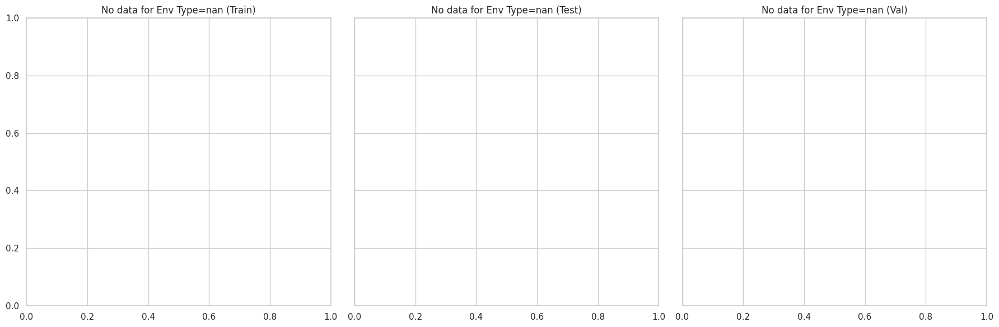

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_nerve_tissue.png


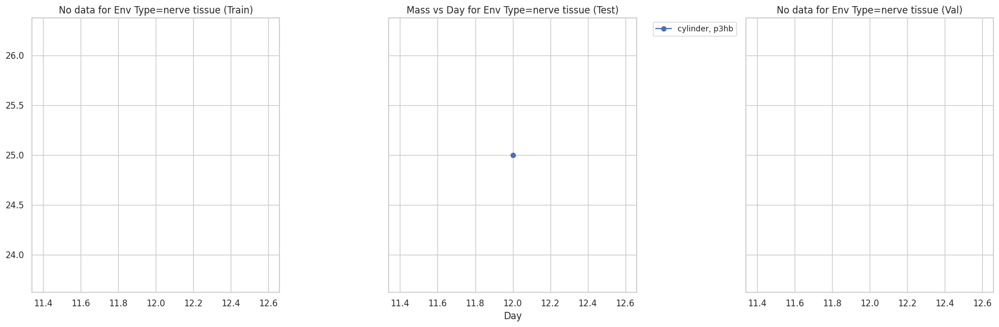

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_simulated_gastric_juice.png


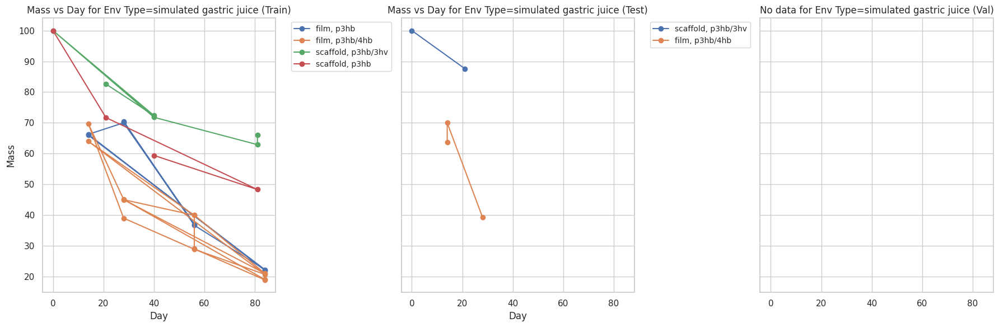

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_sterile_buffer.png


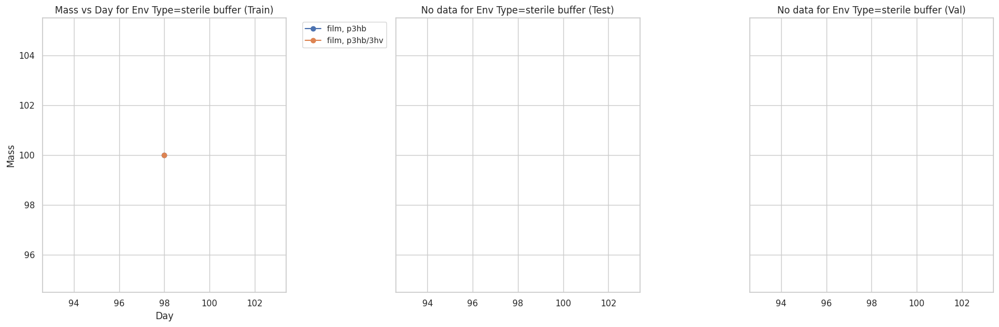

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_bloodstream.png


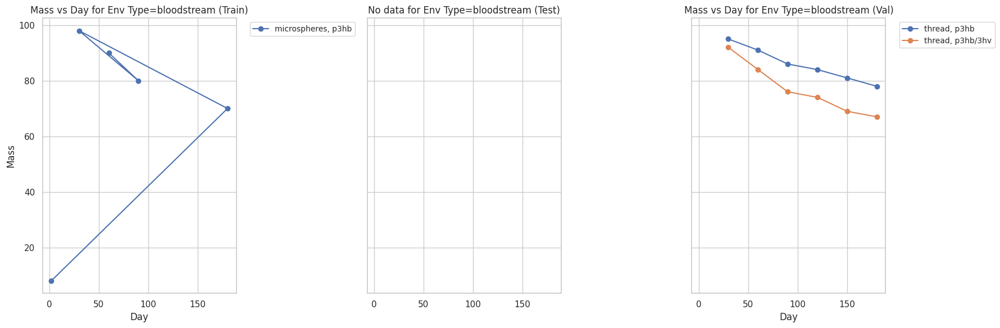

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_simulated_body_fluid.png


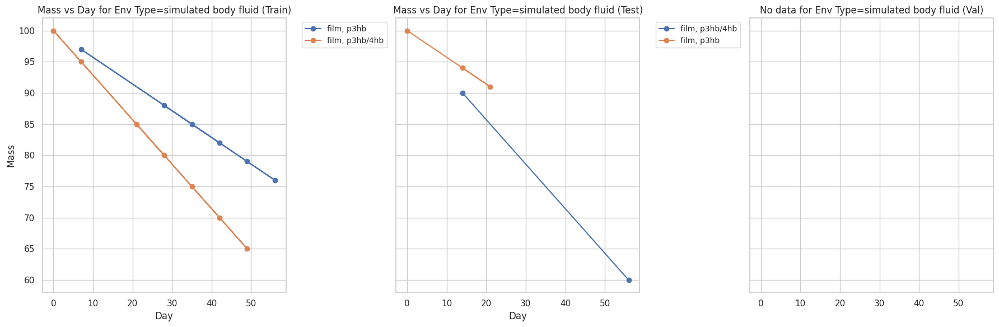

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_bone_tissue.png


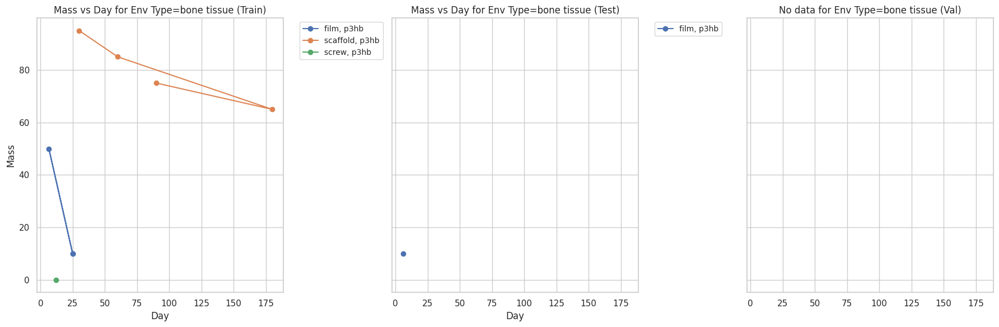

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_tissue_implantation.png


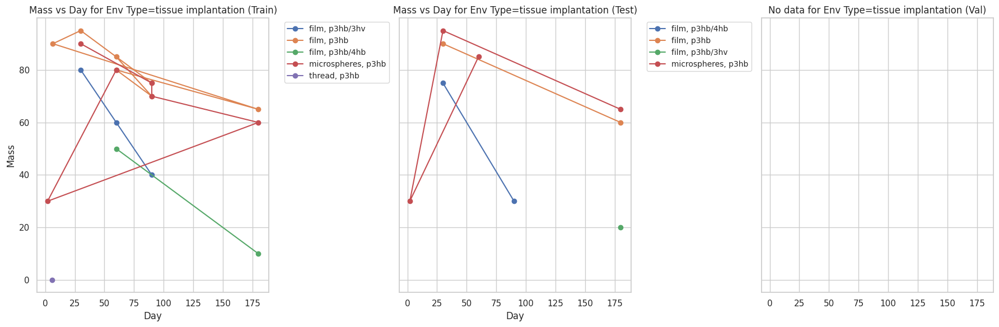

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_in_vivo_unspecified.png


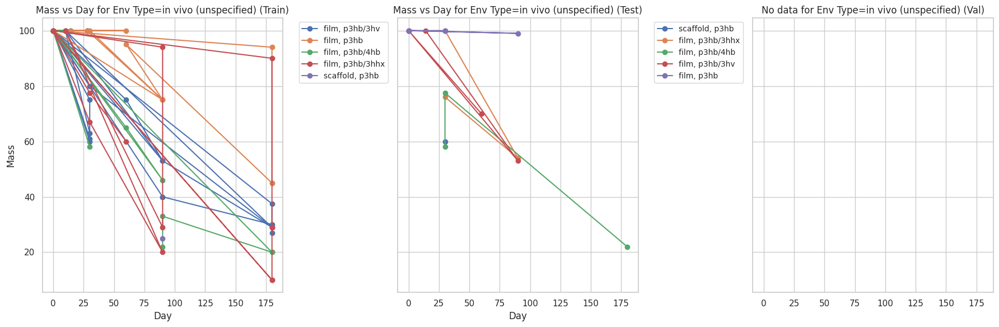

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_phosphate_buffer.png


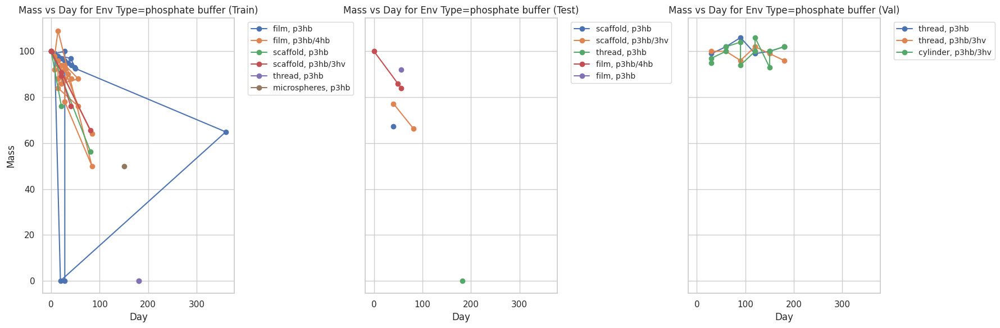

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_naoh.png


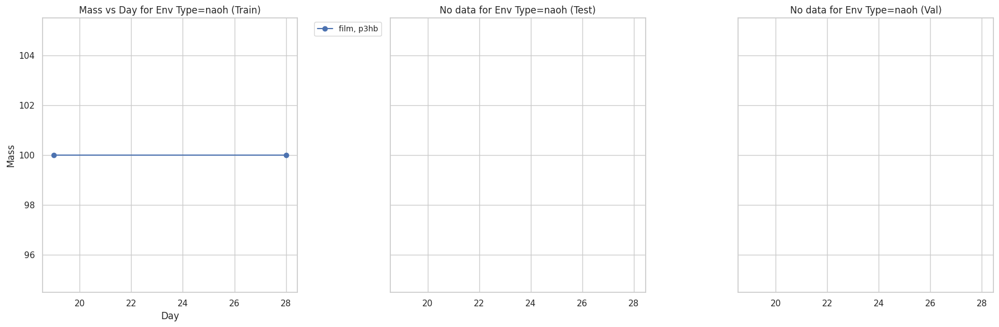

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_simulated_colonic_fluid.png


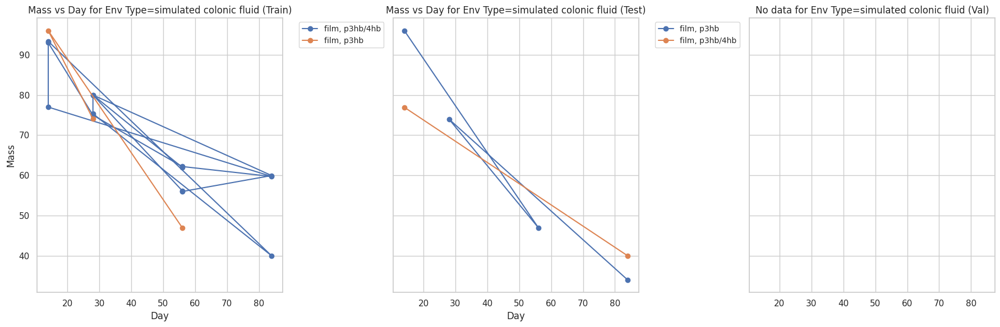

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_cardiovascular_implantation.png


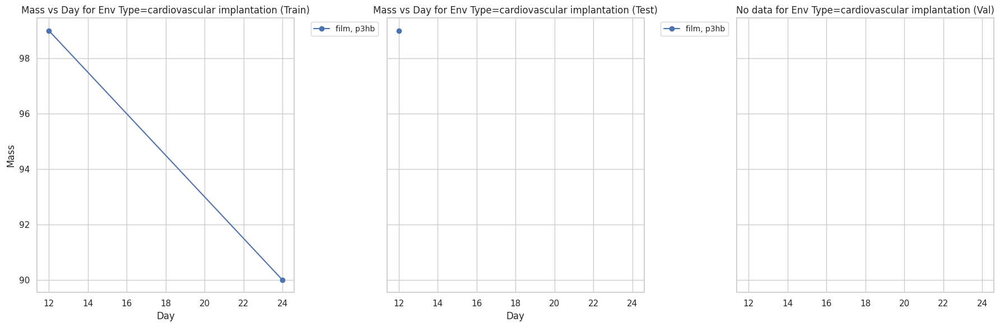

Saved plot: plots/mass_vs_day_by_env_type_pha_p3hb_3hv.png


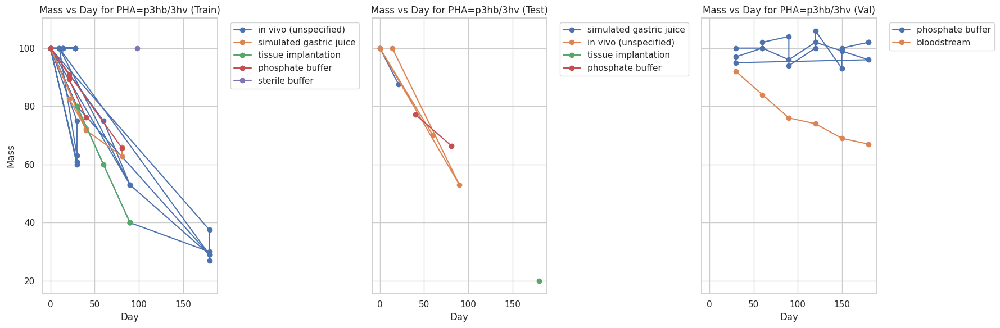

Saved plot: plots/mass_vs_day_by_env_type_pha_p3hb.png


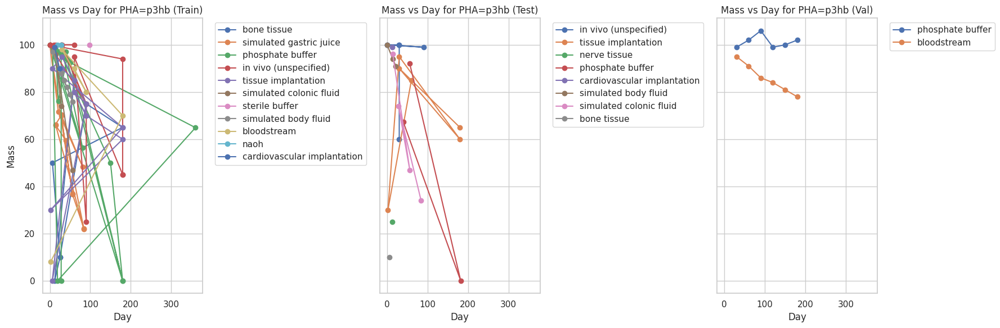

Saved plot: plots/mass_vs_day_by_env_type_pha_p3hb_4hb.png


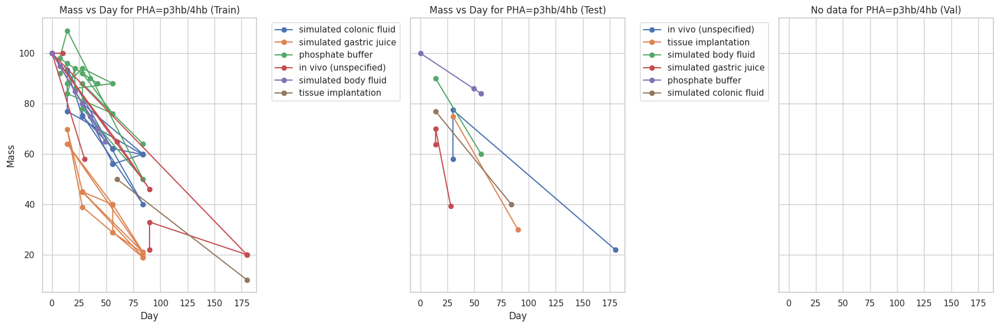

Saved plot: plots/mass_vs_day_by_env_type_pha_p3hb_3hhx.png


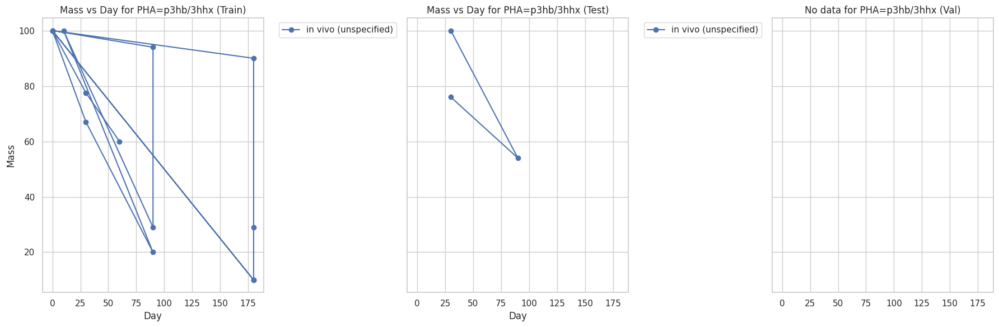

Saved plot: plots/mass_vs_day_by_form_type_pha_p3hb_3hv.png


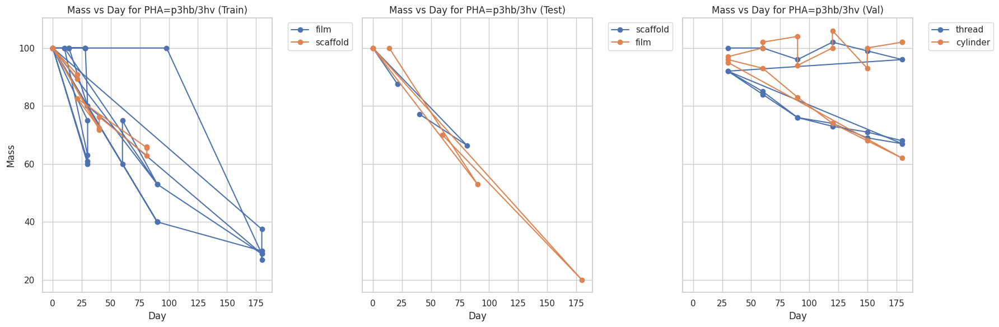

Saved plot: plots/mass_vs_day_by_form_type_pha_p3hb.png


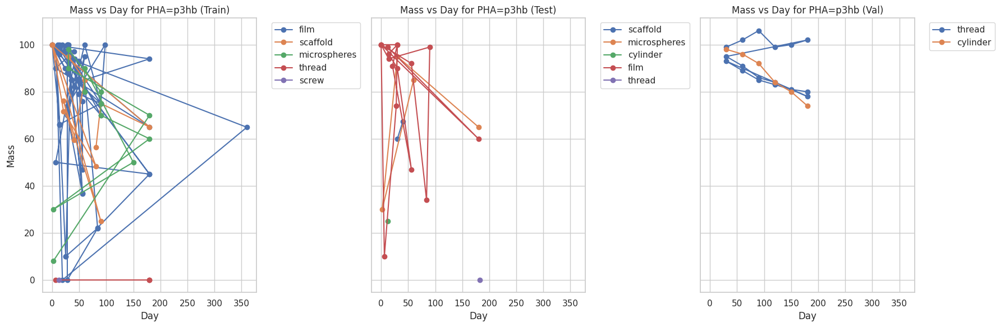

Saved plot: plots/mass_vs_day_by_form_type_pha_p3hb_4hb.png


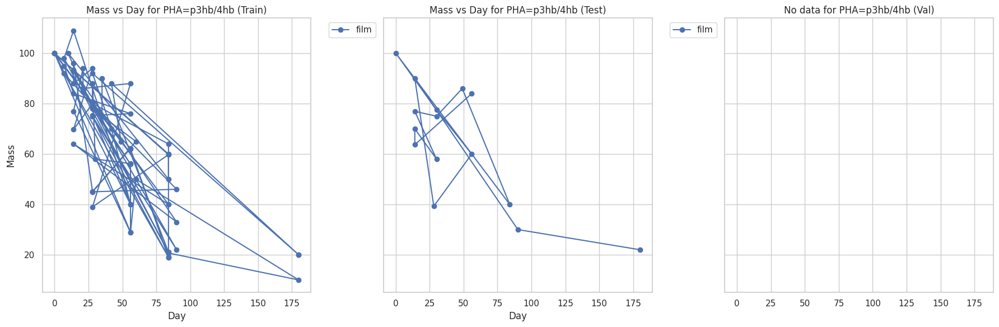

Saved plot: plots/mass_vs_day_by_form_type_pha_p3hb_3hhx.png


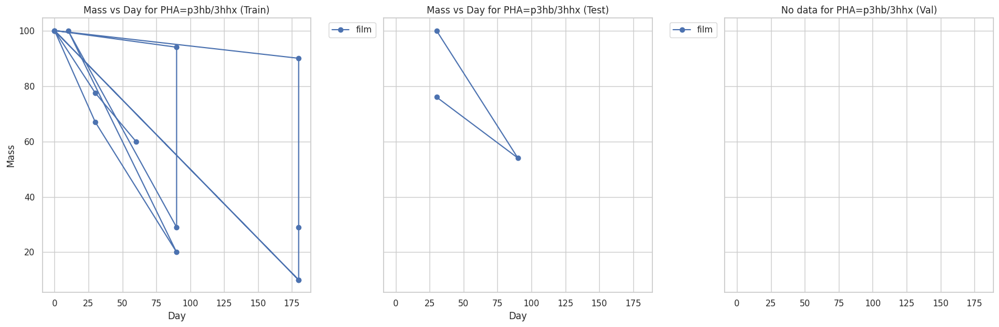

Saved plot: plots/second_component_pie.png


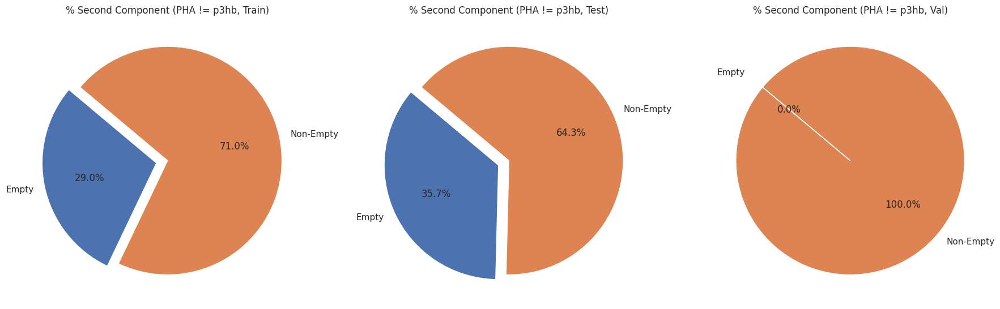

All plots generated and saved in 'plots' directory


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.model_selection import train_test_split

train_df = pd.read_excel('/content/big_train_no_duples.xlsx')
X = train_df.drop(columns=['mass'])
y = train_df['mass']

bins = [-1, 1, 10, 45, 55, 65, 75, 85, 90, 99, 110]
y_binned = pd.cut(y, bins=bins, labels=False, duplicates='drop')

X_train, X_test, y_train, y_test, y_train_binned, y_test_binned = train_test_split(
    X, y, y_binned,
    test_size=0.2,
    random_state=42,
    stratify=y_binned,
)

val_df = pd.read_excel('/content/final_test.xlsx')


train_df = X_train.copy()
train_df['mass'] = y_train
test_df = X_test.copy()
test_df['mass'] = y_test


# List of datasets
datasets = [
    ('train', train_df),
    ('test', test_df),
    ('val', val_df)
]

# Create output directory for plots
output_dir = 'plots'
os.makedirs(output_dir, exist_ok=True)

# Set seaborn style
sns.set(style='whitegrid')

# Function to save and show plot
def save_and_show_plot(filename):
    filepath = os.path.join(output_dir, filename)
    plt.savefig(filepath, bbox_inches='tight')
    print(f"Saved plot: {filepath}")
    plt.show()
    plt.close()

# 1. Distribution Plots
# 1.1 pH Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.histplot(data=df, x='ph', stat='count', discrete=True, ax=axes[idx])
    axes[idx].set_title(f'pH Distribution ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('pH')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
fig.tight_layout()
save_and_show_plot('ph_distribution.png')

# 1.2 Environment + PHA Type Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='environment', hue='type of pha', ax=axes[idx])
    axes[idx].set_title(f'Environment + PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Environment')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Type of PHA', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('environment_pha_distribution.png')

# 1.3 PHA Type + Form Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='type of pha', hue='form', ax=axes[idx])
    axes[idx].set_title(f'PHA + Form ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Type of PHA')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Form', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('pha_form_distribution.png')

# 1.4 Environment Type + PHA Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='environment_type', hue='type of pha', ax=axes[idx])
    axes[idx].set_title(f'Environment Type + PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Environment Type')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Type of PHA', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('environment_type_pha_distribution.png')

# 1.5 Form Type + PHA Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='form_type', hue='type of pha', ax=axes[idx])
    axes[idx].set_title(f'Form Type + PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Form Type')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Type of PHA', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('form_type_pha_distribution.png')

# 1.6 Environment + PHA Type + Form Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    df = df.copy()
    df['env_pha_form'] = df['environment'] + ' | ' + df['type of pha'] + ' | ' + df['form']
    sns.countplot(data=df, x='env_pha_form', ax=axes[idx])
    axes[idx].set_title(f'Env + PHA + Form ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Environment | PHA | Form')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=90)
fig.tight_layout()
save_and_show_plot('env_pha_form_distribution.png')

# 1.7 Environment Type + PHA + Form Type Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    df = df.copy()
    df['env_type_pha_form_type'] = df['environment_type'] + ' | ' + df['type of pha'] + ' | ' + df['form_type']
    sns.countplot(data=df, x='env_type_pha_form_type', ax=axes[idx])
    axes[idx].set_title(f'Env Type + PHA + Form Type ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Env Type | PHA | Form Type')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=90)
fig.tight_layout()
save_and_show_plot('env_type_pha_form_type_distribution.png')

# 2. Day vs Mass Plots
# 2.1 Group by Environment
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env in df['environment'].unique():
        subset = df[df['environment'] == env]
        if not subset.empty:
            axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=env)
    axes[idx].set_title(f'Mass vs Day by Env ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_environment.png')

# 2.2 Group by Environment Type
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env_type in df['environment_type'].unique():
        subset = df[df['environment_type'] == env_type]
        if not subset.empty:
            axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=env_type)
    axes[idx].set_title(f'Mass vs Day by Env Type ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_environment_type.png')

# 2.3 Group by PHA
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for pha in df['type of pha'].unique():
        subset = df[df['type of pha'] == pha]
        if not subset.empty:
            axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=pha)
    axes[idx].set_title(f'Mass vs Day by PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_pha.png')

# 2.4 Group by Form, PHA
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for form in df['form'].unique():
        for pha in df[df['form'] == form]['type of pha'].unique():
            subset = df[(df['form'] == form) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{form}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Form, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_form_pha.png')

# 2.5 Group by Form Type, PHA
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for form_type in df['form_type'].unique():
        for pha in df[df['form_type'] == form_type]['type of pha'].unique():
            subset = df[(df['form_type'] == form_type) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{form_type}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Form Type, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_form_type_pha.png')

# 2.6 Group by Environment Type, PHA
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env_type in df['environment_type'].unique():
        for pha in df[df['environment_type'] == env_type]['type of pha'].unique():
            subset = df[(df['environment_type'] == env_type) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{env_type}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Env Type, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_env_type_pha.png')

# 2.7 Group by Environment, PHA
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env in df['environment'].unique():
        for pha in df[df['environment'] == env]['type of pha'].unique():
            subset = df[(df['environment'] == env) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{env}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Env, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_env_pha.png')

# 2.8 For each Environment Type, group by Form Type, PHA
for env_type in set.union(*(set(df['environment_type'].unique()) for _, df in datasets)):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
    for idx, (dataset_name, df) in enumerate(datasets):
        subset_env = df[df['environment_type'] == env_type]
        if subset_env.empty:
            axes[idx].set_title(f'No data for Env Type={env_type} ({dataset_name.capitalize()})')
            continue
        for form_type in subset_env['form_type'].unique():
            for pha in subset_env[subset_env['form_type'] == form_type]['type of pha'].unique():
                subset = subset_env[(subset_env['form_type'] == form_type) & (subset_env['type of pha'] == pha)]
                if not subset.empty:
                    axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{form_type}, {pha}')
        axes[idx].set_title(f'Mass vs Day for Env Type={env_type} ({dataset_name.capitalize()})')
        axes[idx].set_xlabel('Day')
        axes[idx].set_ylabel('Mass' if idx == 0 else '')
        axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        axes[idx].grid(True)
    fig.tight_layout()
    safe_env_type = str(env_type).replace(' ', '_').replace('(', '').replace(')', '')
    save_and_show_plot(f'mass_vs_day_by_form_type_pha_env_type_{safe_env_type}.png')

# 2.9 For each PHA, group by Environment Type
for pha in set.union(*(set(df['type of pha'].unique()) for _, df in datasets)):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
    for idx, (dataset_name, df) in enumerate(datasets):
        subset_pha = df[df['type of pha'] == pha]
        if subset_pha.empty:
            axes[idx].set_title(f'No data for PHA={pha} ({dataset_name.capitalize()})')
            continue
        for env_type in subset_pha['environment_type'].unique():
            subset = subset_pha[subset_pha['environment_type'] == env_type]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=env_type)
        axes[idx].set_title(f'Mass vs Day for PHA={pha} ({dataset_name.capitalize()})')
        axes[idx].set_xlabel('Day')
        axes[idx].set_ylabel('Mass' if idx == 0 else '')
        axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        axes[idx].grid(True)
    fig.tight_layout()
    safe_pha = str(pha).replace('/', '_').replace(' ', '_')
    save_and_show_plot(f'mass_vs_day_by_env_type_pha_{safe_pha}.png')

# 2.10 For each PHA, group by Form Type
for pha in set.union(*(set(df['type of pha'].unique()) for _, df in datasets)):
    fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
    for idx, (dataset_name, df) in enumerate(datasets):
        subset_pha = df[df['type of pha'] == pha]
        if subset_pha.empty:
            axes[idx].set_title(f'No data for PHA={pha} ({dataset_name.capitalize()})')
            continue
        for form_type in subset_pha['form_type'].unique():
            subset = subset_pha[subset_pha['form_type'] == form_type]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=form_type)
        axes[idx].set_title(f'Mass vs Day for PHA={pha} ({dataset_name.capitalize()})')
        axes[idx].set_xlabel('Day')
        axes[idx].set_ylabel('Mass' if idx == 0 else '')
        axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        axes[idx].grid(True)
    fig.tight_layout()
    safe_pha = str(pha).replace('/', '_').replace(' ', '_')
    save_and_show_plot(f'mass_vs_day_by_form_type_pha_{safe_pha}.png')

# 3. Pie Chart for % Second Component (where type of pha != 'p3hb')
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for idx, (dataset_name, df) in enumerate(datasets):
    subset = df[df['type of pha'] != 'p3hb']
    empty_count = subset['% second component'].isna().sum()
    non_empty_count = subset['% second component'].notna().sum()
    total = empty_count + non_empty_count
    if total > 0:
        labels = ['Empty', 'Non-Empty']
        sizes = [empty_count, non_empty_count]
        explode = (0.1, 0)
        axes[idx].pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', startangle=140)
        axes[idx].set_title(f'% Second Component (PHA != p3hb, {dataset_name.capitalize()})')
    else:
        axes[idx].text(0.5, 0.5, 'No Data', horizontalalignment='center', verticalalignment='center')
        axes[idx].set_title(f'No data for PHA != p3hb ({dataset_name.capitalize()})')
fig.tight_layout()
save_and_show_plot('second_component_pie.png')

print(f"All plots generated and saved in '{output_dir}' directory")

Saved plot: plots/ph_distribution.png


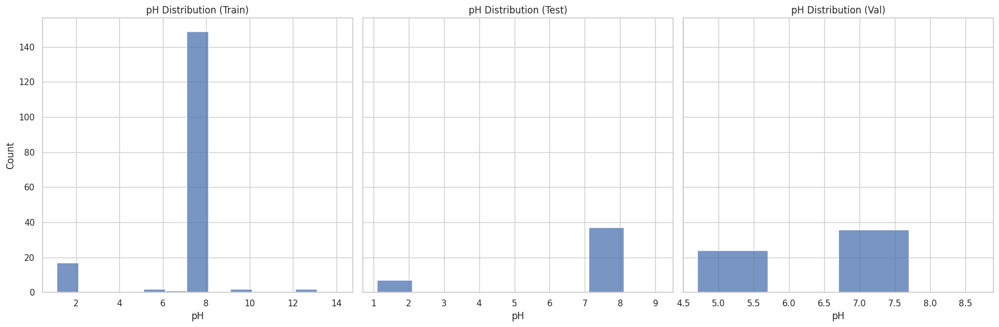

Saved plot: plots/environment_pha_distribution.png


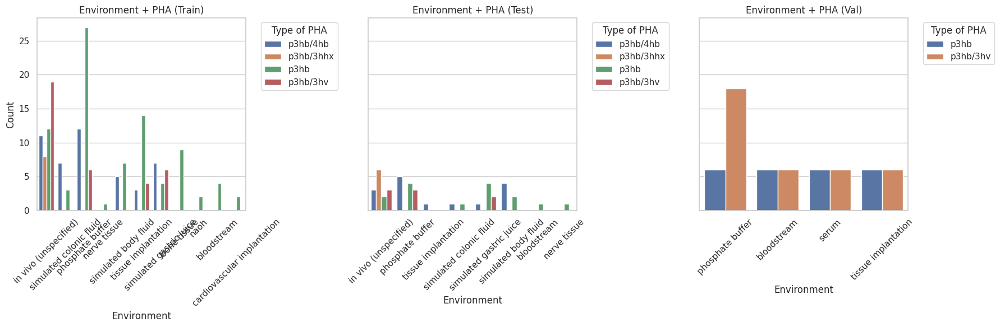

Saved plot: plots/pha_form_distribution.png


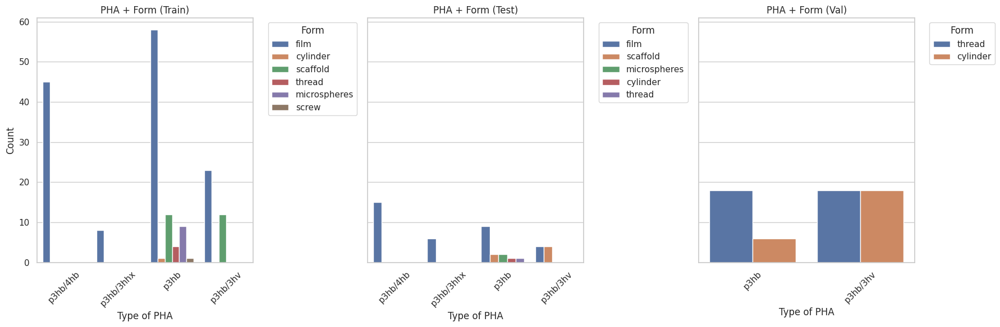

Saved plot: plots/env_pha_form_distribution.png


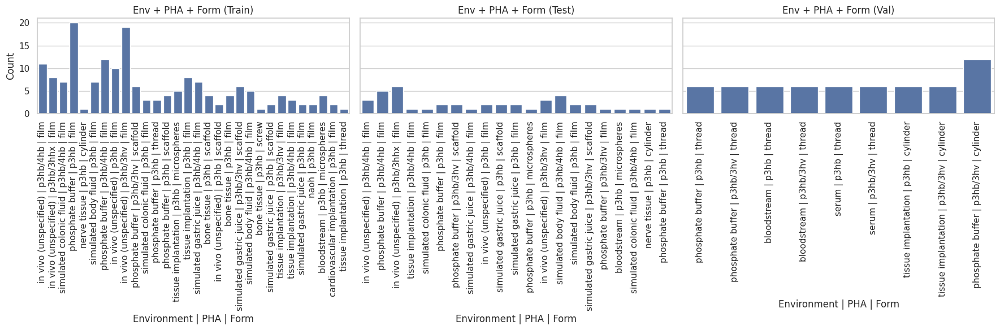

Saved plot: plots/mass_vs_day_by_environment.png


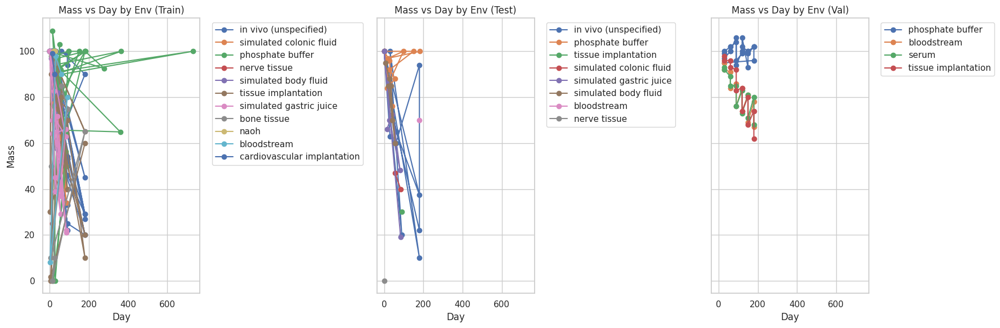

Saved plot: plots/mass_vs_day_by_pha.png


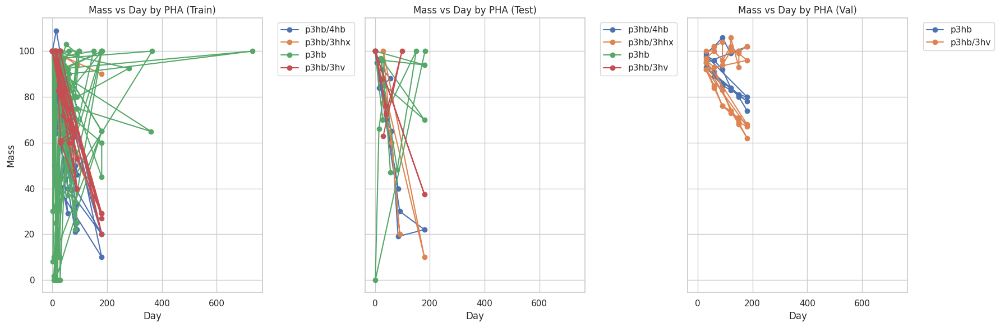

Saved plot: plots/mass_vs_day_by_form_pha.png


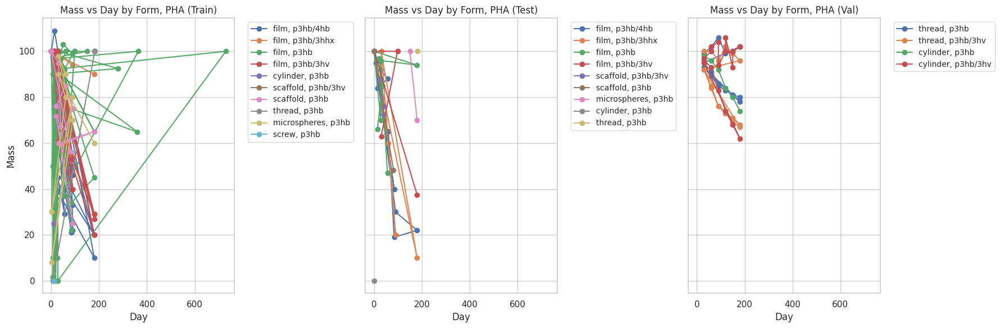

Saved plot: plots/mass_vs_day_by_env_pha.png


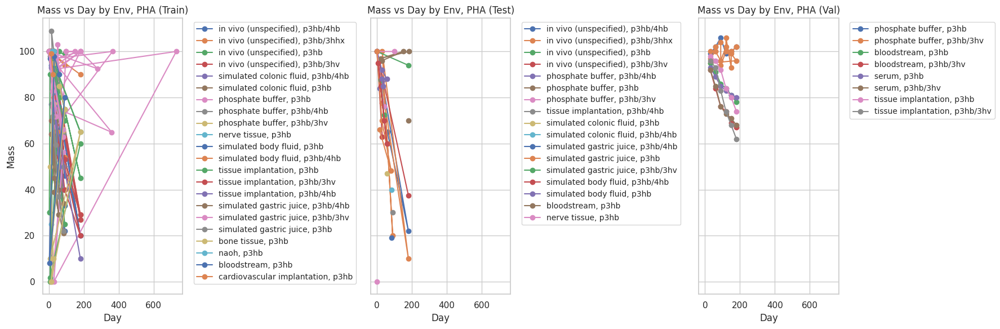

Saved plot: plots/second_component_pie.png


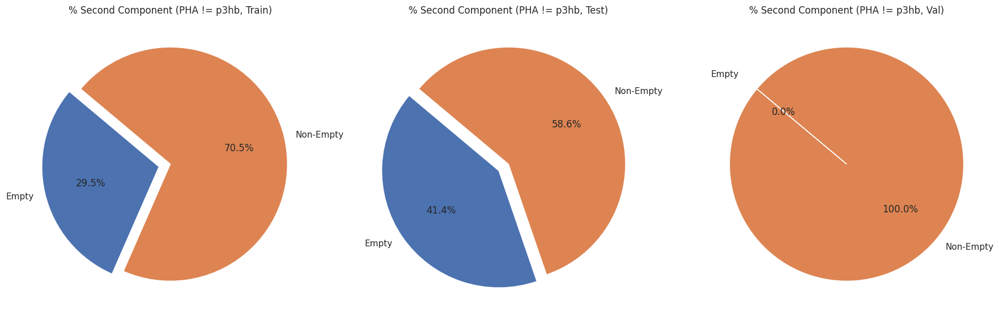

All plots generated and saved in 'plots' directory


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.model_selection import train_test_split

train_df = pd.read_excel('/content/preprocessed_train1 (7).xlsx')
X = train_df.drop(columns=['mass'])
y = train_df['mass']

bins = [-1, 1, 10, 45, 55, 65, 75, 85, 90, 99, 110]
y_binned = pd.cut(y, bins=bins, labels=False, duplicates='drop')

X_train, X_test, y_train, y_test, y_train_binned, y_test_binned = train_test_split(
    X, y, y_binned,
    test_size=0.2,
    random_state=42,
    stratify=y_binned,
)

val_df = pd.read_excel('/content/final_test.xlsx')


train_df = X_train.copy()
train_df['mass'] = y_train
test_df = X_test.copy()
test_df['mass'] = y_test


# List of datasets
datasets = [
    ('train', train_df),
    ('test', test_df),
    ('val', val_df)
]

# Create output directory for plots
output_dir = 'plots'
os.makedirs(output_dir, exist_ok=True)

# Set seaborn style
sns.set(style='whitegrid')

# Function to save and show plot
def save_and_show_plot(filename):
    filepath = os.path.join(output_dir, filename)
    plt.savefig(filepath, bbox_inches='tight')
    print(f"Saved plot: {filepath}")
    plt.show()
    plt.close()

# 1. Distribution Plots
# 1.1 pH Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.histplot(data=df, x='ph', stat='count', discrete=True, ax=axes[idx])
    axes[idx].set_title(f'pH Distribution ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('pH')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
fig.tight_layout()
save_and_show_plot('ph_distribution.png')

# 1.2 Environment + PHA Type Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='environment', hue='type of pha', ax=axes[idx])
    axes[idx].set_title(f'Environment + PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Environment')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Type of PHA', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('environment_pha_distribution.png')

# 1.3 PHA Type + Form Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='type of pha', hue='form', ax=axes[idx])
    axes[idx].set_title(f'PHA + Form ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Type of PHA')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Form', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('pha_form_distribution.png')


# 1.6 Environment + PHA Type + Form Distribution
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    df = df.copy()
    df['env_pha_form'] = df['environment'] + ' | ' + df['type of pha'] + ' | ' + df['form']
    sns.countplot(data=df, x='env_pha_form', ax=axes[idx])
    axes[idx].set_title(f'Env + PHA + Form ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Environment | PHA | Form')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=90)
fig.tight_layout()
save_and_show_plot('env_pha_form_distribution.png')

# 2. Day vs Mass Plots
# 2.1 Group by Environment
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env in df['environment'].unique():
        subset = df[df['environment'] == env]
        if not subset.empty:
            axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=env)
    axes[idx].set_title(f'Mass vs Day by Env ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_environment.png')



# 2.3 Group by PHA
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for pha in df['type of pha'].unique():
        subset = df[df['type of pha'] == pha]
        if not subset.empty:
            axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=pha)
    axes[idx].set_title(f'Mass vs Day by PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_pha.png')

# 2.4 Group by Form, PHA
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for form in df['form'].unique():
        for pha in df[df['form'] == form]['type of pha'].unique():
            subset = df[(df['form'] == form) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{form}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Form, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_form_pha.png')

#

# 2.7 Group by Environment, PHA
fig, axes = plt.subplots(1, 3, figsize=(18, 6), sharex=True, sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env in df['environment'].unique():
        for pha in df[df['environment'] == env]['type of pha'].unique():
            subset = df[(df['environment'] == env) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{env}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Env, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_env_pha.png')



# 3. Pie Chart for % Second Component (where type of pha != 'p3hb')
fig, axes = plt.subplots(1, 3, figsize=(18, 6))
for idx, (dataset_name, df) in enumerate(datasets):
    subset = df[df['type of pha'] != 'p3hb']
    empty_count = subset['% second component'].isna().sum()
    non_empty_count = subset['% second component'].notna().sum()
    total = empty_count + non_empty_count
    if total > 0:
        labels = ['Empty', 'Non-Empty']
        sizes = [empty_count, non_empty_count]
        explode = (0.1, 0)
        axes[idx].pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', startangle=140)
        axes[idx].set_title(f'% Second Component (PHA != p3hb, {dataset_name.capitalize()})')
    else:
        axes[idx].text(0.5, 0.5, 'No Data', horizontalalignment='center', verticalalignment='center')
        axes[idx].set_title(f'No data for PHA != p3hb ({dataset_name.capitalize()})')
fig.tight_layout()
save_and_show_plot('second_component_pie.png')

print(f"All plots generated and saved in '{output_dir}' directory")

In [ ]:
import pandas as pd

# Загрузка файлов
file1 = pd.read_excel('/content/final_test.xlsx')  # Замените на ваш путь к файлу
file2 = pd.read_excel('/content/big_train_duples.xlsx')  # Замените на ваш путь к файлу

# Получаем уникальные значения из файла №1 для нужных столбцов
valid_forms = set(file1['form_type'].dropna().unique())
valid_types = set(file1['type of pha'].dropna().unique())
valid_environments = set(file1['environment_type'].dropna().unique())

# Функция для проверки, есть ли все значения строки в допустимых значениях
def is_row_valid(row):
    form_valid = pd.isna(row['form_type']) or (row['form_type'] in valid_forms)
    type_valid = pd.isna(row['type of pha']) or (row['type of pha'] in valid_types)
    env_valid = pd.isna(row['environment_type']) or (row['environment_type'] in valid_environments)
    return form_valid or type_valid or env_valid

# Фильтруем файл №2, оставляя только строки с допустимыми значениями
filtered_file2 = file2[file2.apply(is_row_valid, axis=1)]

# Сохраняем результат
filtered_file2.to_excel('big_train_filtered.xlsx', index=False)

print(f"Исходное количество строк в файле №2: {len(file2)}")
print(f"Оставшееся количество строк после фильтрации: {len(filtered_file2)}")

Исходное количество строк в файле №2: 311
Оставшееся количество строк после фильтрации: 217


Saved plot: plots/ph_distribution.png


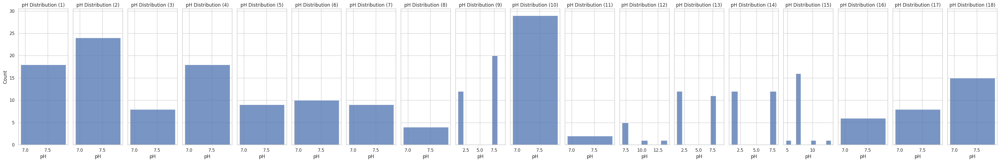

<ipython-input-3-cd5e62a0055d>:52: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/environment_pha_distribution.png


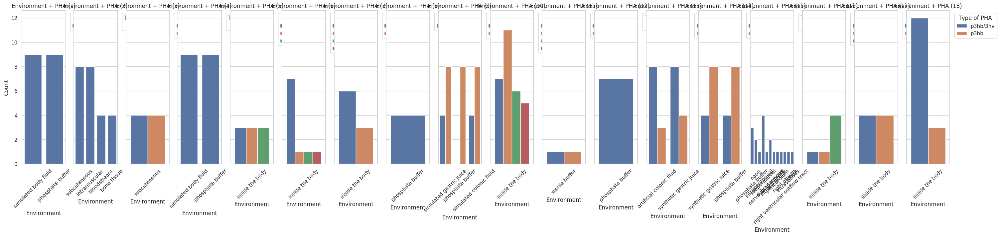

<ipython-input-3-cd5e62a0055d>:64: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/pha_form_distribution.png


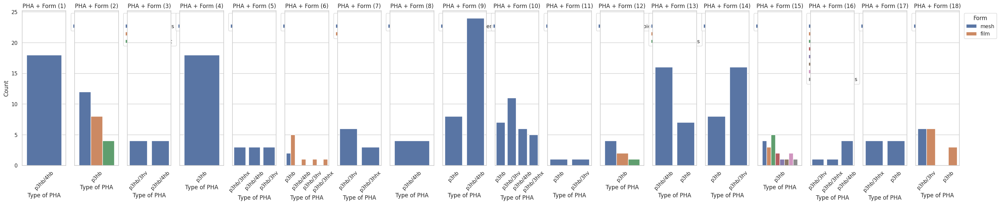

<ipython-input-3-cd5e62a0055d>:76: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/environment_type_pha_distribution.png


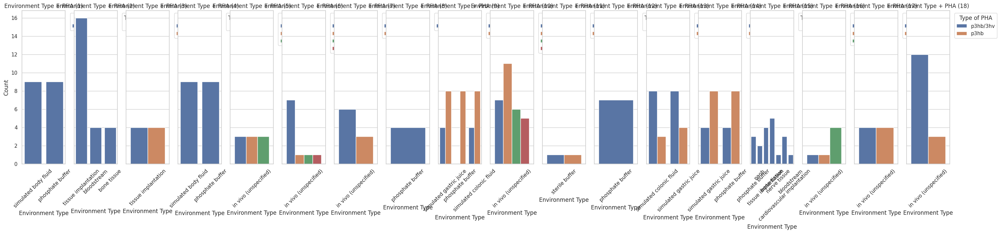

Saved plot: plots/form_type_pha_distribution.png


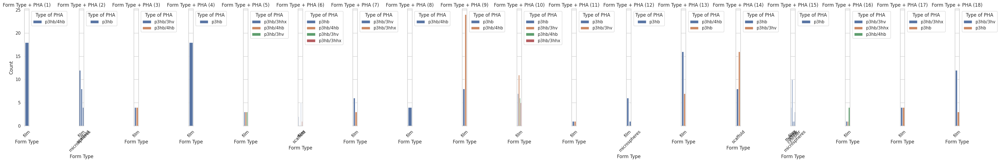

Saved plot: plots/env_pha_form_distribution.png


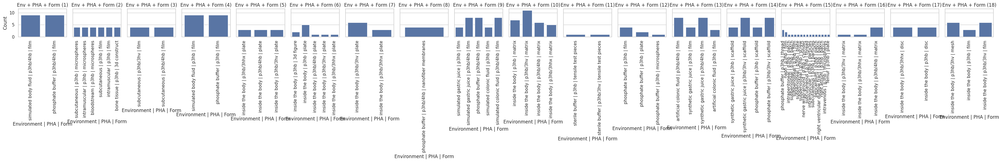

Saved plot: plots/env_type_pha_form_type_distribution.png


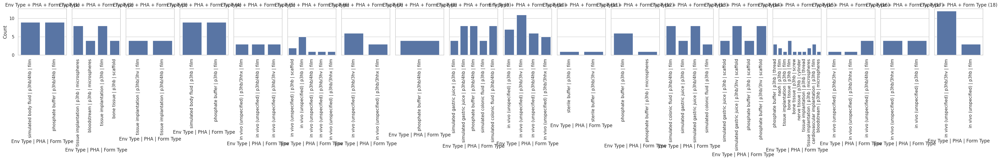

<ipython-input-3-cd5e62a0055d>:130: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/mass_vs_day_by_environment.png


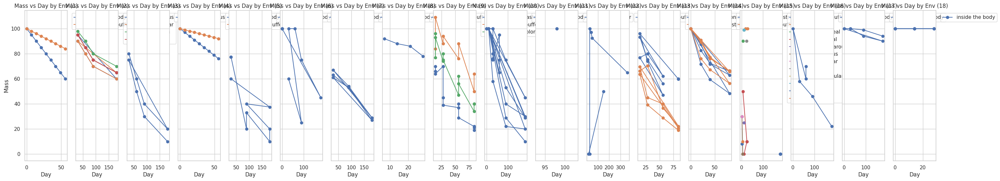

<ipython-input-3-cd5e62a0055d>:145: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/mass_vs_day_by_environment_type.png


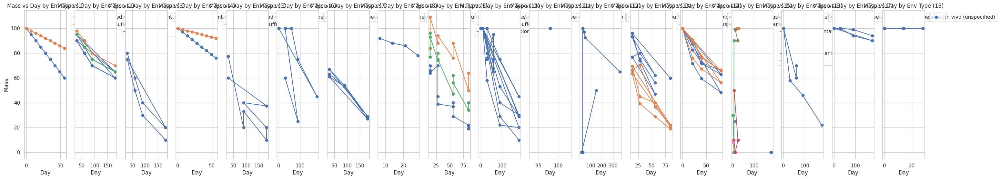

Saved plot: plots/mass_vs_day_by_pha.png


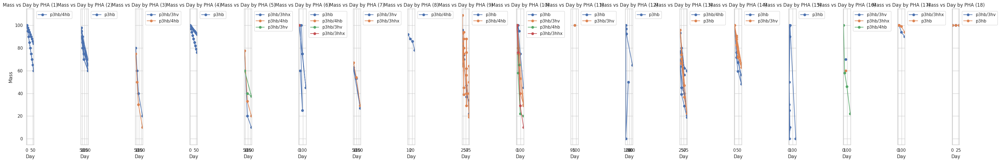

<ipython-input-3-cd5e62a0055d>:176: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/mass_vs_day_by_form_pha.png


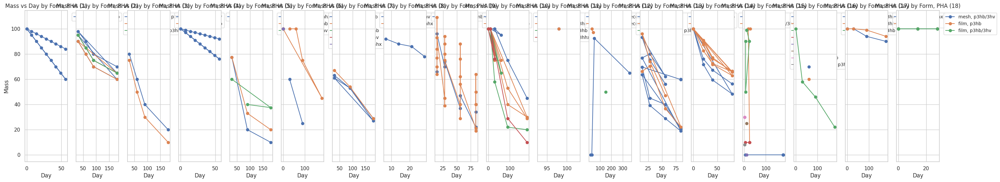

<ipython-input-3-cd5e62a0055d>:192: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/mass_vs_day_by_form_type_pha.png


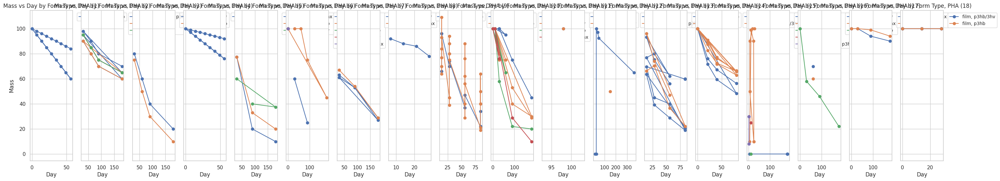

<ipython-input-3-cd5e62a0055d>:208: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/mass_vs_day_by_env_type_pha.png


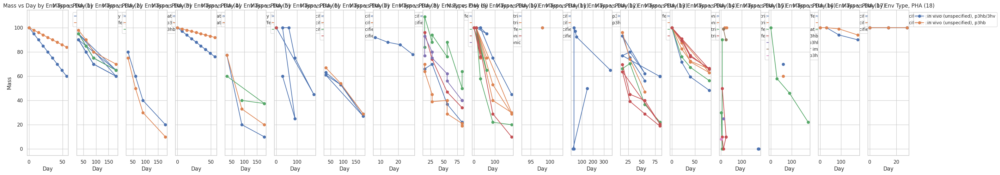

<ipython-input-3-cd5e62a0055d>:224: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/mass_vs_day_by_env_pha.png


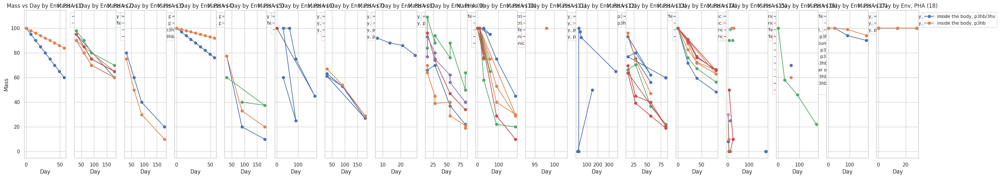

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_cardiovascular_implantation.png


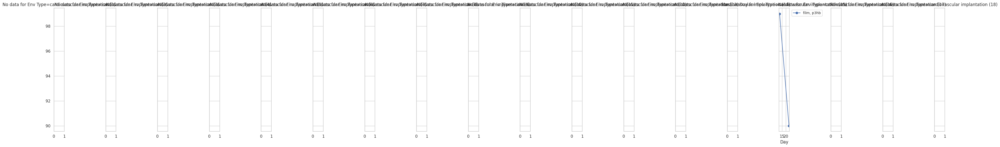

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_simulated_colonic_fluid.png


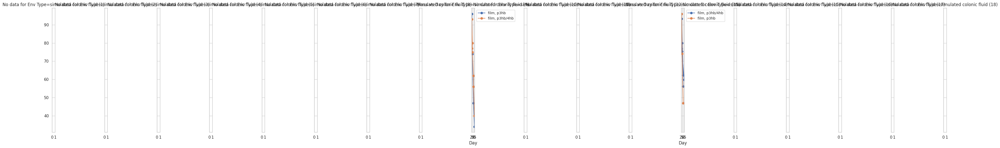

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_nerve_tissue.png


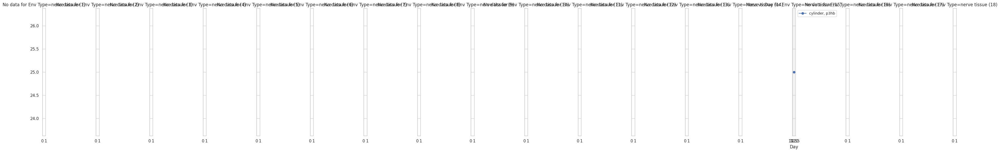

<ipython-input-3-cd5e62a0055d>:245: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_phosphate_buffer.png


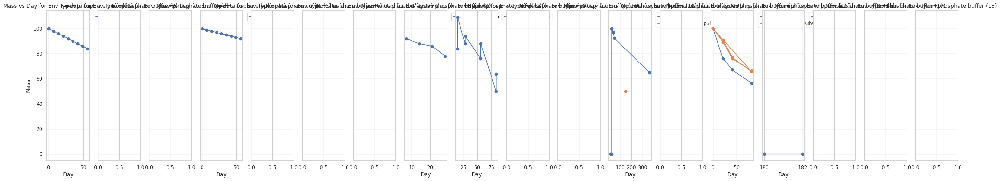

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_simulated_gastric_juice.png


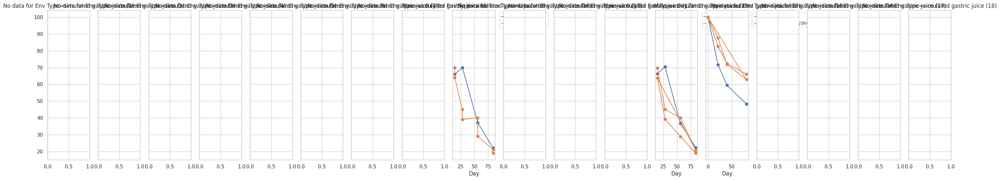

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_in_vivo_unspecified.png


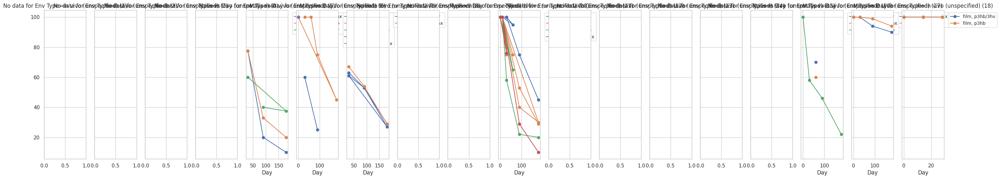

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_bloodstream.png


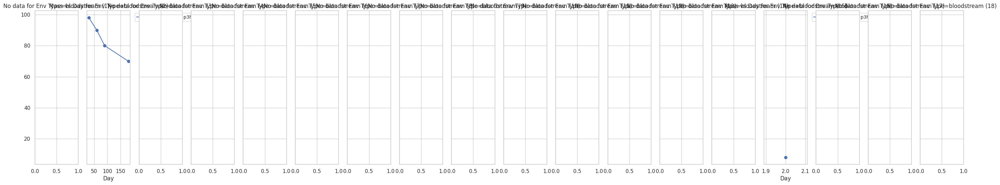

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_bone_tissue.png


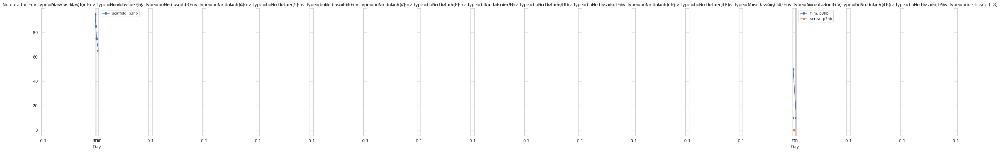

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_sterile_buffer.png


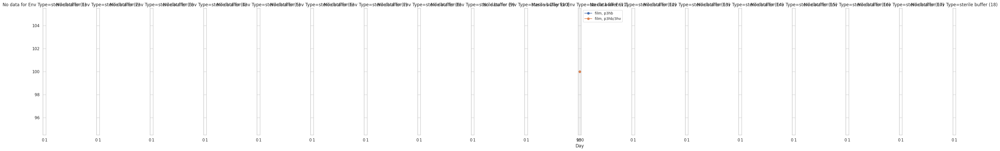

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_simulated_body_fluid.png


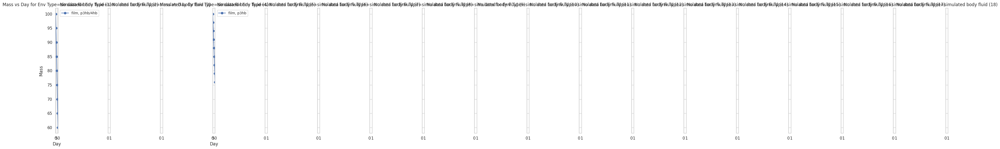

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_naoh.png


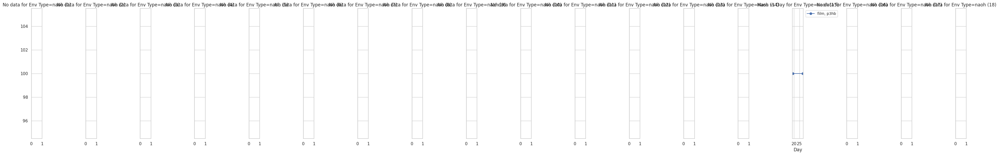

Saved plot: plots/mass_vs_day_by_form_type_pha_env_type_tissue_implantation.png


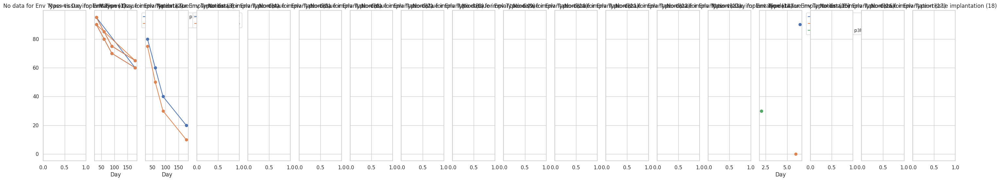

<ipython-input-3-cd5e62a0055d>:266: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/mass_vs_day_by_env_type_pha_p3hb_3hv.png


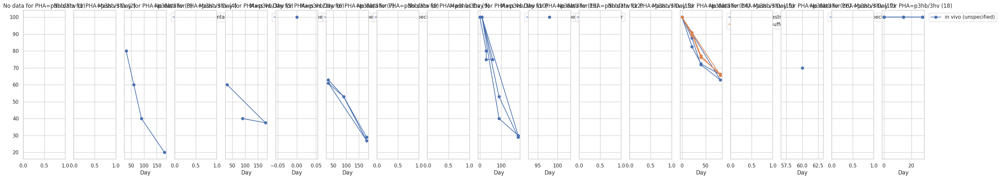

Saved plot: plots/mass_vs_day_by_env_type_pha_p3hb_4hb.png


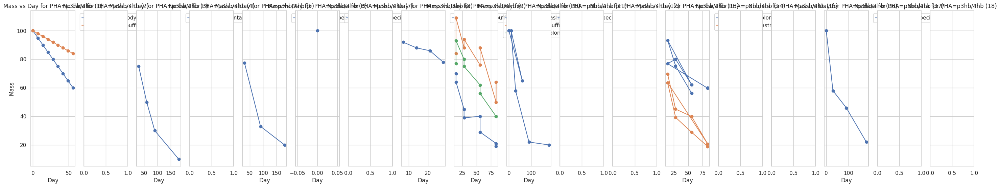

Saved plot: plots/mass_vs_day_by_env_type_pha_p3hb.png


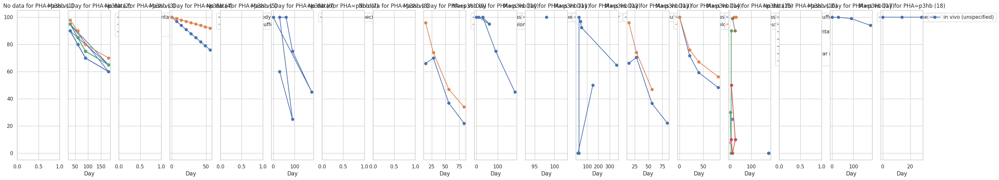

Saved plot: plots/mass_vs_day_by_env_type_pha_p3hb_3hhx.png


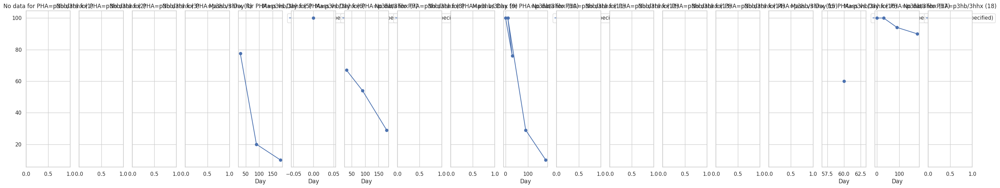

Saved plot: plots/mass_vs_day_by_form_type_pha_p3hb_3hv.png


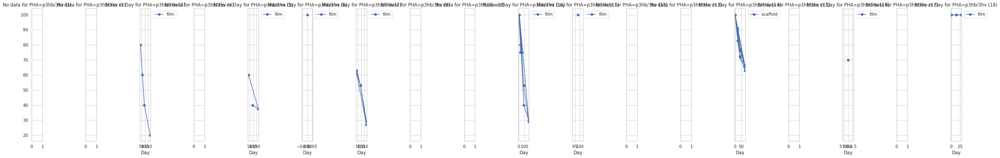

Saved plot: plots/mass_vs_day_by_form_type_pha_p3hb_4hb.png


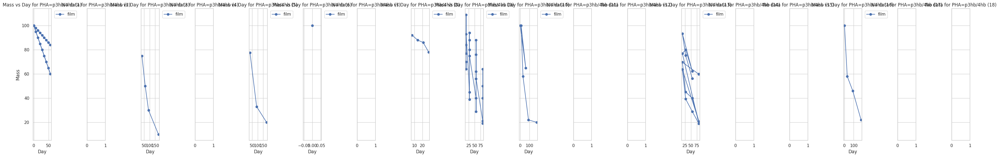

<ipython-input-3-cd5e62a0055d>:287: UserWarning: Tight layout not applied. tight_layout cannot make Axes width small enough to accommodate all Axes decorations
  fig.tight_layout()


Saved plot: plots/mass_vs_day_by_form_type_pha_p3hb.png


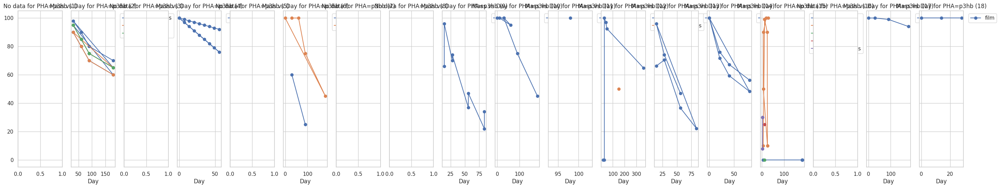

Saved plot: plots/mass_vs_day_by_form_type_pha_p3hb_3hhx.png


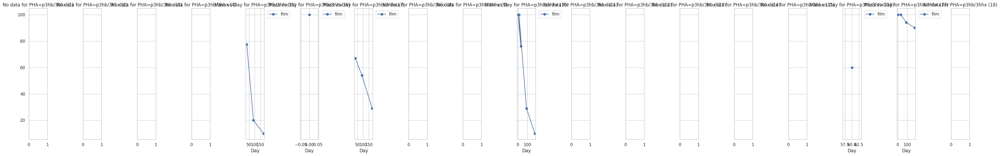

Saved plot: plots/second_component_pie.png


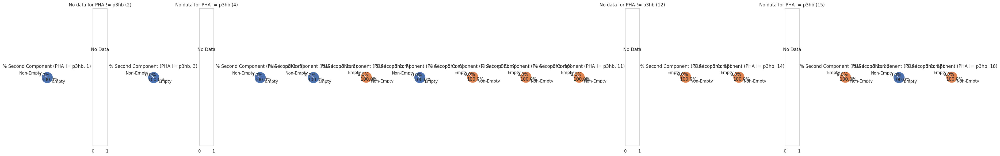

All plots generated and saved in 'plots' directory


In [ ]:
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import os
from sklearn.model_selection import train_test_split

# Загрузка данных
df = pd.read_excel('/content/big_train_no_duples.xlsx')

# Получаем все уникальные article из всех датасетов
all_articles = set()
all_articles.update(df['article'].unique())

# List of datasets
datasets = [(f'{article}', df[df['article'] == article].copy()) for article in all_articles]

# Create output directory for plots
output_dir = 'plots'
os.makedirs(output_dir, exist_ok=True)

# Set seaborn style
sns.set(style='whitegrid')

# Function to save and show plot
def save_and_show_plot(filename):
    filepath = os.path.join(output_dir, filename)
    plt.savefig(filepath, bbox_inches='tight')
    print(f"Saved plot: {filepath}")
    plt.show()
    plt.close()

# 1. Distribution Plots
# 1.1 pH Distribution
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.histplot(data=df, x='ph', stat='count', discrete=True, ax=axes[idx])
    axes[idx].set_title(f'pH Distribution ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('pH')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
fig.tight_layout()
save_and_show_plot('ph_distribution.png')

# 1.2 Environment + PHA Type Distribution
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='environment', hue='type of pha', ax=axes[idx])
    axes[idx].set_title(f'Environment + PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Environment')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Type of PHA', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('environment_pha_distribution.png')

# 1.3 PHA Type + Form Distribution
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='type of pha', hue='form', ax=axes[idx])
    axes[idx].set_title(f'PHA + Form ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Type of PHA')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Form', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('pha_form_distribution.png')

# 1.4 Environment Type + PHA Distribution
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='environment_type', hue='type of pha', ax=axes[idx])
    axes[idx].set_title(f'Environment Type + PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Environment Type')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Type of PHA', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('environment_type_pha_distribution.png')

# 1.5 Form Type + PHA Distribution
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    sns.countplot(data=df, x='form_type', hue='type of pha', ax=axes[idx])
    axes[idx].set_title(f'Form Type + PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Form Type')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=45)
    axes[idx].legend(title='Type of PHA', bbox_to_anchor=(1.05, 1), loc='upper left')
fig.tight_layout()
save_and_show_plot('form_type_pha_distribution.png')

# 1.6 Environment + PHA Type + Form Distribution
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    df = df.copy()
    df['env_pha_form'] = df['environment'] + ' | ' + df['type of pha'] + ' | ' + df['form']
    sns.countplot(data=df, x='env_pha_form', ax=axes[idx])
    axes[idx].set_title(f'Env + PHA + Form ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Environment | PHA | Form')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=90)
fig.tight_layout()
save_and_show_plot('env_pha_form_distribution.png')

# 1.7 Environment Type + PHA + Form Type Distribution
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    df = df.copy()
    df['env_type_pha_form_type'] = df['environment_type'] + ' | ' + df['type of pha'] + ' | ' + df['form_type']
    sns.countplot(data=df, x='env_type_pha_form_type', ax=axes[idx])
    axes[idx].set_title(f'Env Type + PHA + Form Type ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Env Type | PHA | Form Type')
    axes[idx].set_ylabel('Count' if idx == 0 else '')
    axes[idx].tick_params(axis='x', rotation=90)
fig.tight_layout()
save_and_show_plot('env_type_pha_form_type_distribution.png')

# 2. Day vs Mass Plots
# 2.1 Group by Environment
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env in df['environment'].unique():
        subset = df[df['environment'] == env]
        if not subset.empty:
            axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=env)
    axes[idx].set_title(f'Mass vs Day by Env ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_environment.png')

# 2.2 Group by Environment Type
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env_type in df['environment_type'].unique():
        subset = df[df['environment_type'] == env_type]
        if not subset.empty:
            axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=env_type)
    axes[idx].set_title(f'Mass vs Day by Env Type ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_environment_type.png')

# 2.3 Group by PHA
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for pha in df['type of pha'].unique():
        subset = df[df['type of pha'] == pha]
        if not subset.empty:
            axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=pha)
    axes[idx].set_title(f'Mass vs Day by PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_pha.png')

# 2.4 Group by Form, PHA
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for form in df['form'].unique():
        for pha in df[df['form'] == form]['type of pha'].unique():
            subset = df[(df['form'] == form) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{form}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Form, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_form_pha.png')

# 2.5 Group by Form Type, PHA
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for form_type in df['form_type'].unique():
        for pha in df[df['form_type'] == form_type]['type of pha'].unique():
            subset = df[(df['form_type'] == form_type) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{form_type}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Form Type, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_form_type_pha.png')

# 2.6 Group by Environment Type, PHA
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env_type in df['environment_type'].unique():
        for pha in df[df['environment_type'] == env_type]['type of pha'].unique():
            subset = df[(df['environment_type'] == env_type) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{env_type}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Env Type, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_env_type_pha.png')

# 2.7 Group by Environment, PHA
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    for env in df['environment'].unique():
        for pha in df[df['environment'] == env]['type of pha'].unique():
            subset = df[(df['environment'] == env) & (df['type of pha'] == pha)]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{env}, {pha}')
    axes[idx].set_title(f'Mass vs Day by Env, PHA ({dataset_name.capitalize()})')
    axes[idx].set_xlabel('Day')
    axes[idx].set_ylabel('Mass' if idx == 0 else '')
    axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
    axes[idx].grid(True)
fig.tight_layout()
save_and_show_plot('mass_vs_day_by_env_pha.png')

# 2.8 For each Environment Type, group by Form Type, PHA
for env_type in set.union(*(set(df['environment_type'].unique()) for _, df in datasets)):
    fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
    for idx, (dataset_name, df) in enumerate(datasets):
        subset_env = df[df['environment_type'] == env_type]
        if subset_env.empty:
            axes[idx].set_title(f'No data for Env Type={env_type} ({dataset_name.capitalize()})')
            continue
        for form_type in subset_env['form_type'].unique():
            for pha in subset_env[subset_env['form_type'] == form_type]['type of pha'].unique():
                subset = subset_env[(subset_env['form_type'] == form_type) & (subset_env['type of pha'] == pha)]
                if not subset.empty:
                    axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=f'{form_type}, {pha}')
        axes[idx].set_title(f'Mass vs Day for Env Type={env_type} ({dataset_name.capitalize()})')
        axes[idx].set_xlabel('Day')
        axes[idx].set_ylabel('Mass' if idx == 0 else '')
        axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left', fontsize='small')
        axes[idx].grid(True)
    fig.tight_layout()
    safe_env_type = str(env_type).replace(' ', '_').replace('(', '').replace(')', '')
    save_and_show_plot(f'mass_vs_day_by_form_type_pha_env_type_{safe_env_type}.png')

# 2.9 For each PHA, group by Environment Type
for pha in set.union(*(set(df['type of pha'].unique()) for _, df in datasets)):
    fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
    for idx, (dataset_name, df) in enumerate(datasets):
        subset_pha = df[df['type of pha'] == pha]
        if subset_pha.empty:
            axes[idx].set_title(f'No data for PHA={pha} ({dataset_name.capitalize()})')
            continue
        for env_type in subset_pha['environment_type'].unique():
            subset = subset_pha[subset_pha['environment_type'] == env_type]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=env_type)
        axes[idx].set_title(f'Mass vs Day for PHA={pha} ({dataset_name.capitalize()})')
        axes[idx].set_xlabel('Day')
        axes[idx].set_ylabel('Mass' if idx == 0 else '')
        axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        axes[idx].grid(True)
    fig.tight_layout()
    safe_pha = str(pha).replace('/', '_').replace(' ', '_')
    save_and_show_plot(f'mass_vs_day_by_env_type_pha_{safe_pha}.png')

# 2.10 For each PHA, group by Form Type
for pha in set.union(*(set(df['type of pha'].unique()) for _, df in datasets)):
    fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
    for idx, (dataset_name, df) in enumerate(datasets):
        subset_pha = df[df['type of pha'] == pha]
        if subset_pha.empty:
            axes[idx].set_title(f'No data for PHA={pha} ({dataset_name.capitalize()})')
            continue
        for form_type in subset_pha['form_type'].unique():
            subset = subset_pha[subset_pha['form_type'] == form_type]
            if not subset.empty:
                axes[idx].plot(subset['day'], subset['mass'], marker='o', linestyle='-', label=form_type)
        axes[idx].set_title(f'Mass vs Day for PHA={pha} ({dataset_name.capitalize()})')
        axes[idx].set_xlabel('Day')
        axes[idx].set_ylabel('Mass' if idx == 0 else '')
        axes[idx].legend(bbox_to_anchor=(1.05, 1), loc='upper left')
        axes[idx].grid(True)
    fig.tight_layout()
    safe_pha = str(pha).replace('/', '_').replace(' ', '_')
    save_and_show_plot(f'mass_vs_day_by_form_type_pha_{safe_pha}.png')

# 3. Pie Chart for % Second Component (where type of pha != 'p3hb')
fig, axes = plt.subplots(1, 18, figsize=(36, 6), sharey=True)
for idx, (dataset_name, df) in enumerate(datasets):
    subset = df[df['type of pha'] != 'p3hb']
    empty_count = subset['% second component'].isna().sum()
    non_empty_count = subset['% second component'].notna().sum()
    total = empty_count + non_empty_count
    if total > 0:
        labels = ['Empty', 'Non-Empty']
        sizes = [empty_count, non_empty_count]
        explode = (0.1, 0)
        axes[idx].pie(sizes, explode=explode, labels=labels, autopct='%1.1f%%', startangle=140)
        axes[idx].set_title(f'% Second Component (PHA != p3hb, {dataset_name.capitalize()})')
    else:
        axes[idx].text(0.5, 0.5, 'No Data', horizontalalignment='center', verticalalignment='center')
        axes[idx].set_title(f'No data for PHA != p3hb ({dataset_name.capitalize()})')
fig.tight_layout()
save_and_show_plot('second_component_pie.png')

print(f"All plots generated and saved in '{output_dir}' directory")

In [ ]:
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import matplotlib

# Устанавливаем шрифт, совместимый с ГОСТ (Times New Roman)
matplotlib.rcParams['font.family'] = 'Times New Roman'

# Данные из таблицы
data = {
    'Процентное содержание кополимера': [0, 36, 66, 36],
    'pH': [1.6, 1.6, 1.6, 7.4],
    'Остаточная масса, %': [66, 70, 64, 84],
    'Начальная среднечисловая молекулярная масса': [380.1, 72.83, 134, 72.83],
    'Начальная средневесовая молекулярная масса': [481.26, 127.14, 174.13, 127.14]
}

# Создаём DataFrame
df = pd.DataFrame(data)

# Вычисляем корреляционную матрицу (метод Пирсона)
corr_matrix = df.corr(method='pearson')

# Создаём тепловую карту
plt.figure(figsize=(10, 8))  # Размер фигуры
sns.heatmap(
    corr_matrix,
    annot=True,  # Показывать значения корреляции
    cmap='coolwarm',  # Цветовая схема (от синего для -1 до красного для +1)
    vmin=-1, vmax=1,  # Диапазон значений корреляции
    center=0,  # Центр цветовой шкалы
    fmt='.2f',  # Формат чисел (2 знака после запятой)
    annot_kws={'size': 12},  # Размер шрифта для чисел
    square=True,  # Квадратные ячейки
    cbar_kws={'label': 'Коэффициент корреляции'}  # Подпись цветовой шкалы
)

# Настраиваем заголовок и подписи
plt.title('Корреляционная матрица параметров биодеградации ПГА', fontsize=14, pad=20)
plt.xticks(rotation=45, ha='right', fontsize=12)  # Поворот подписей по оси X
plt.yticks(fontsize=12)  # Размер подписей по оси Y

# Увеличиваем плотность компоновки, чтобы избежать обрезки подписей
plt.tight_layout()

# Сохраняем изображение в высоком разрешении для ВКР
plt.savefig('correlation_matrix.png', dpi=300, bbox_inches='tight')

# Показываем график
plt.show()

AttributeError: 'numpy.ndarray' object has no attribute 'corr'